In [1]:
# Definizione intervalli personalizzati per ciascun file
intervalli_per_file = {
    '0.900.txt': (65, 145),
    '0.950.txt': (40, 150),
    '0.960.txt': (50, 148),
    '0.965.txt': (75, 215),
    '0.9675.txt': (75, 217),
    '0.970.txt': (60, 185),
    '0.9725.txt': (77, 190),
    '0.975.txt': (75, 183),
    '0.980.txt': (75, 225),
    '1.000.txt': (70, 155),

    '0.905.txt': (50, 245),
    '0.910.txt': (50, 245),
    '0.955.txt': (50, 270),
    '0.963.txt': (100, 410),
    '0.966.txt': (75, 245),
    '0.967.txt': (75, 265),
    '0.990.txt': (75, 240),
    '0.995.txt': (75, 235),
    '0.9645.txt': (75, 270),
}

# Estrazione automatica della frequenza f da ciascun nome file
frequenza_f = {fname: float(fname.replace('.txt', '')) for fname in intervalli_per_file.keys()}

# Calcolo del periodo (T = 1 / f) per ciascun file
periodi_T = {fname: 1 / f for fname, f in frequenza_f.items()}

# Assumiamo che il dizionario 'frequenza_f' sia già stato creato.
# Esempio: frequenza_f = {'0.950.txt': 0.950, '1.000.txt': 1.000, ...}

# 1. Prendi la lista dei nomi dei file
nomi_dei_file = list(frequenza_f.keys())

# 2. Ordina la lista usando i valori del dizionario 'frequenza_f' come chiave di ordinamento
#    Per ogni 'fname' nella lista, Python userà 'frequenza_f[fname]' per decidere l'ordine.
file_ordinati= sorted(nomi_dei_file, key=lambda fname: frequenza_f[fname])


# --- VERIFICA (opzionale) ---
# Stampa la lista ordinata per controllare che sia corretta.
print("Lista dei file correttamente ordinata per frequenza crescente:")
for nome_file in file_ordinati:
    print(f"- {nome_file} (f: {frequenza_f[nome_file]} Hz)")








Lista dei file correttamente ordinata per frequenza crescente:
- 0.900.txt (f: 0.9 Hz)
- 0.905.txt (f: 0.905 Hz)
- 0.910.txt (f: 0.91 Hz)
- 0.950.txt (f: 0.95 Hz)
- 0.955.txt (f: 0.955 Hz)
- 0.960.txt (f: 0.96 Hz)
- 0.963.txt (f: 0.963 Hz)
- 0.9645.txt (f: 0.9645 Hz)
- 0.965.txt (f: 0.965 Hz)
- 0.966.txt (f: 0.966 Hz)
- 0.967.txt (f: 0.967 Hz)
- 0.9675.txt (f: 0.9675 Hz)
- 0.970.txt (f: 0.97 Hz)
- 0.9725.txt (f: 0.9725 Hz)
- 0.975.txt (f: 0.975 Hz)
- 0.980.txt (f: 0.98 Hz)
- 0.990.txt (f: 0.99 Hz)
- 0.995.txt (f: 0.995 Hz)
- 1.000.txt (f: 1.0 Hz)



=== Analisi per il file: 0.900.txt ===


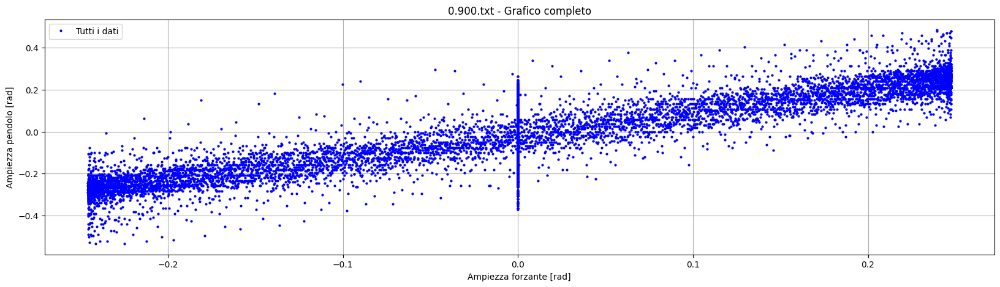

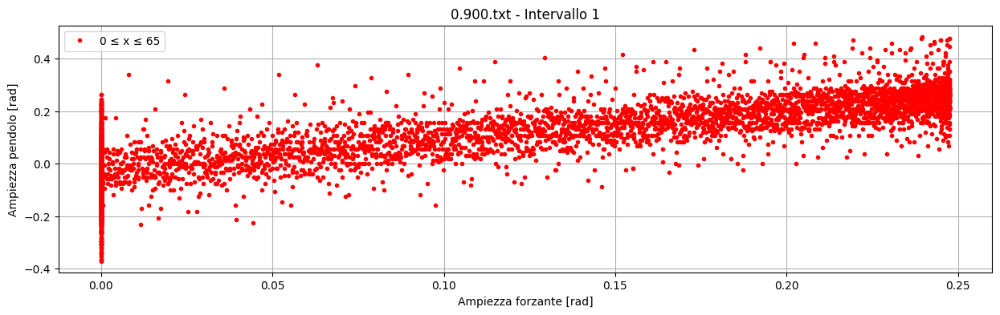


=== Analisi per il file: 0.950.txt ===


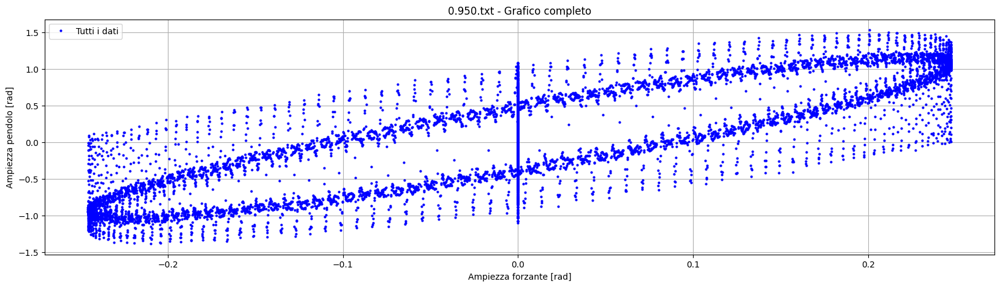

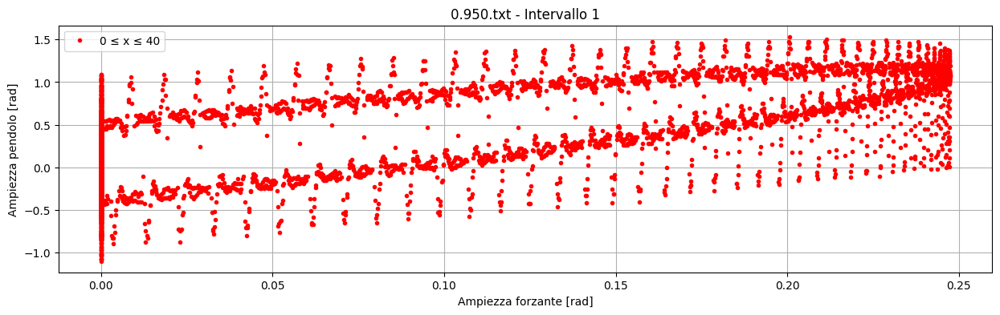


=== Analisi per il file: 0.960.txt ===


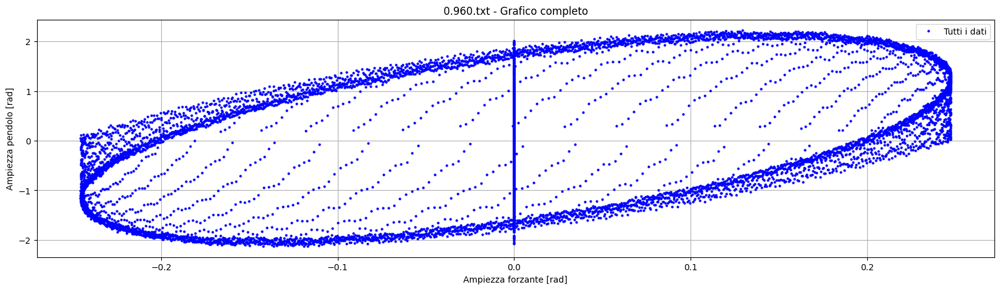

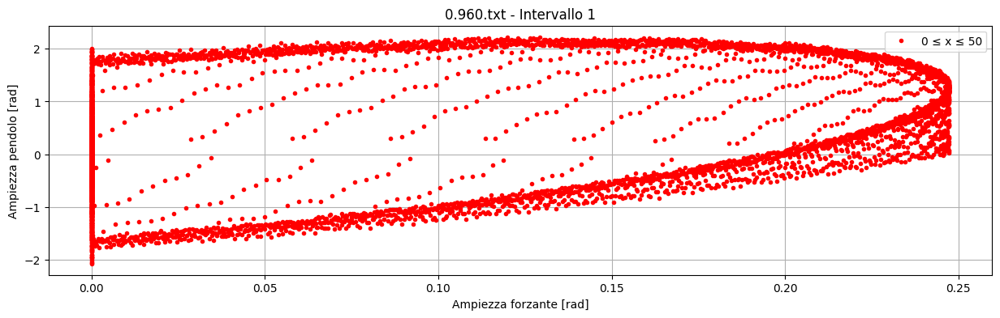


=== Analisi per il file: 0.965.txt ===


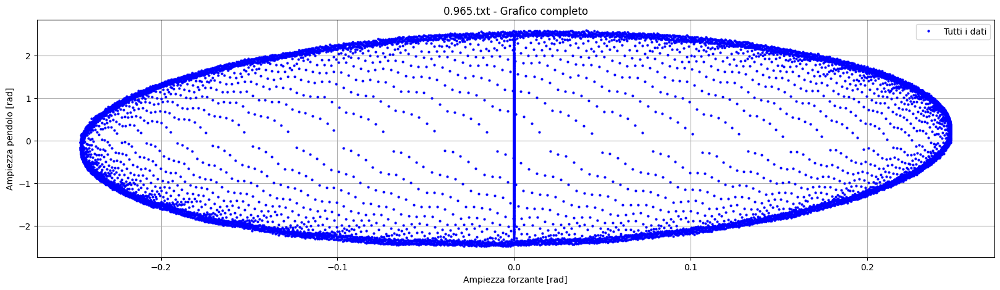

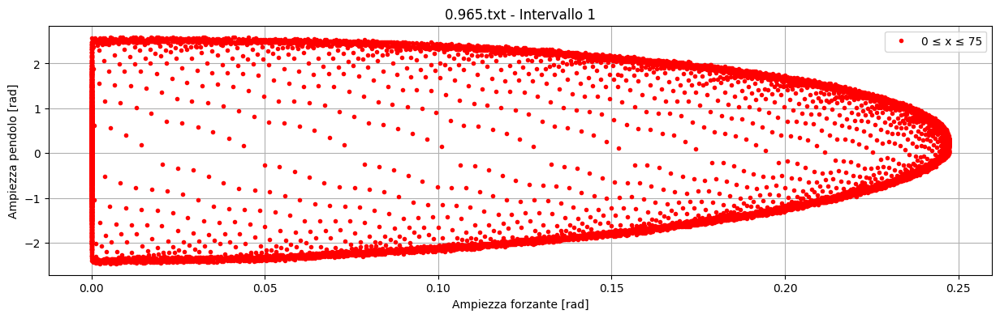


=== Analisi per il file: 0.9675.txt ===


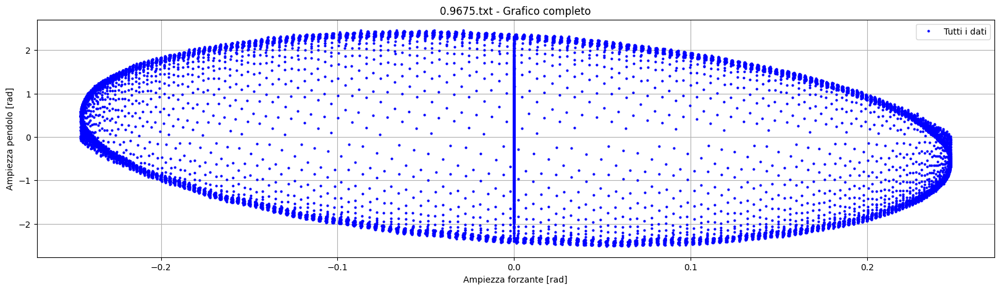

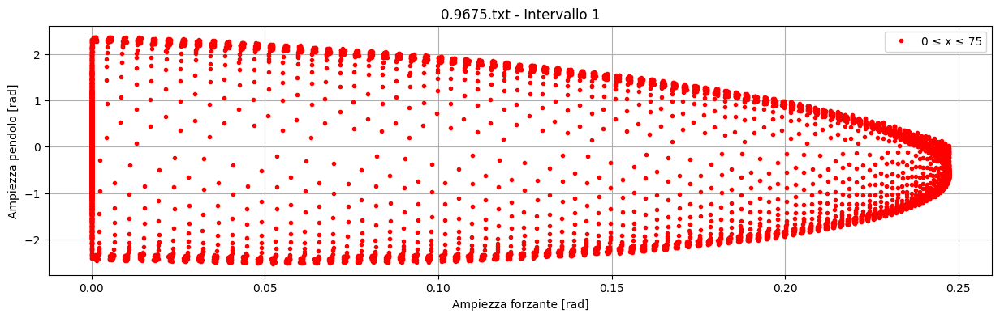


=== Analisi per il file: 0.970.txt ===


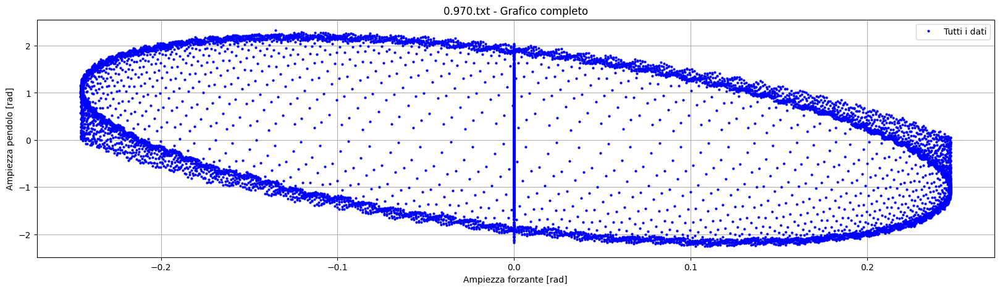

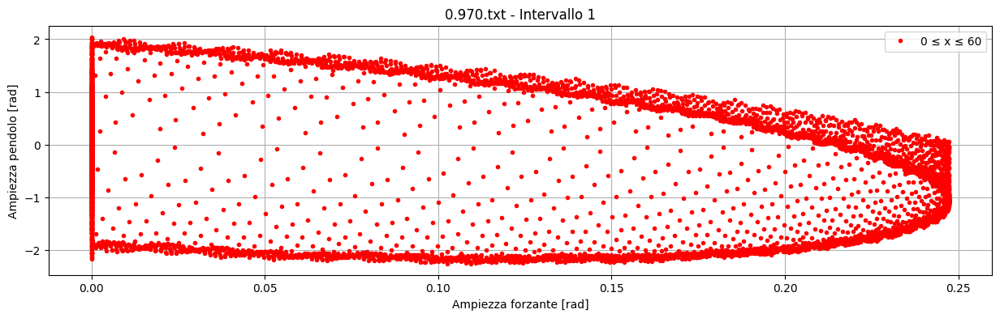


=== Analisi per il file: 0.9725.txt ===


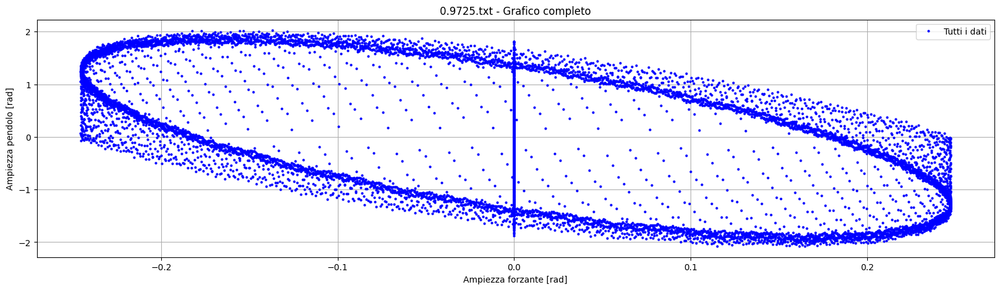

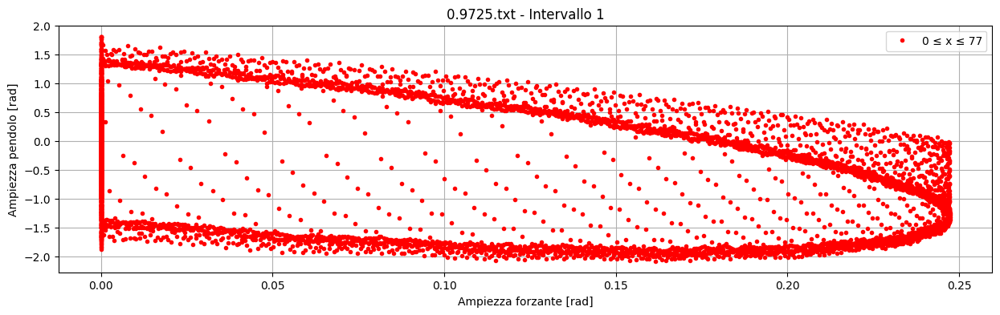


=== Analisi per il file: 0.975.txt ===


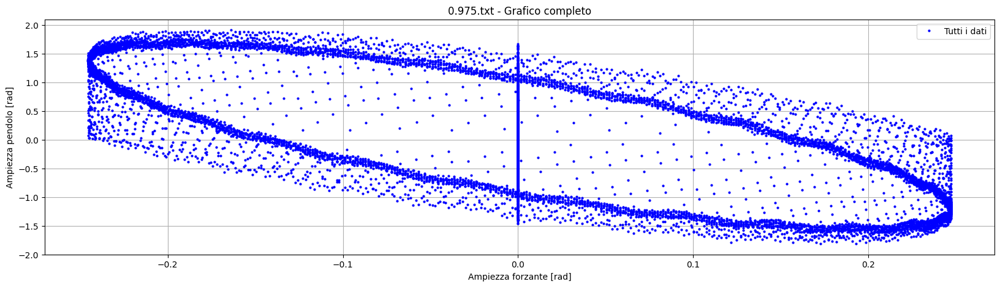

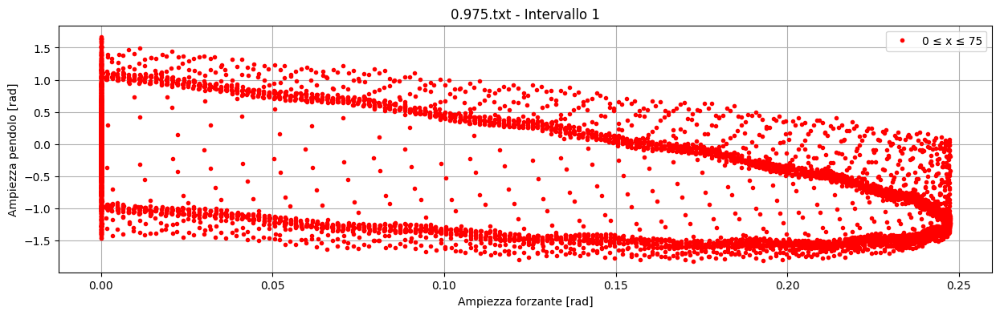


=== Analisi per il file: 0.980.txt ===


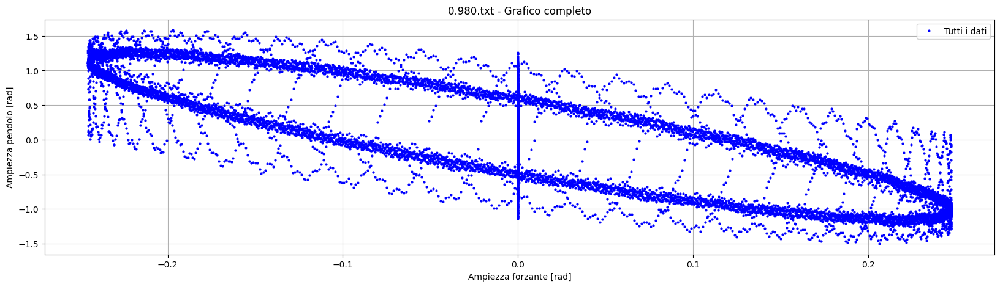

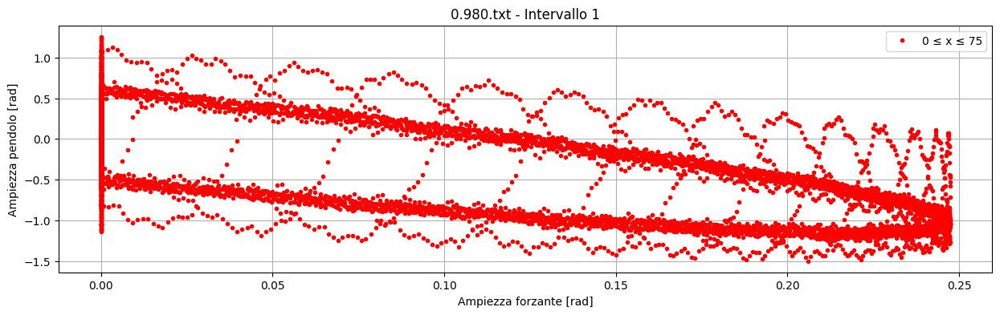


=== Analisi per il file: 1.000.txt ===


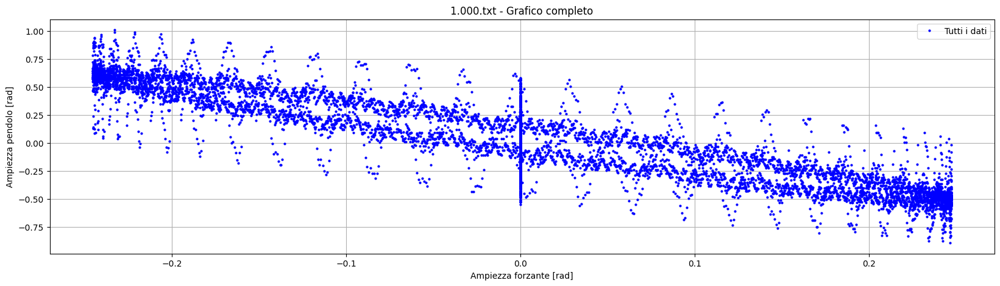

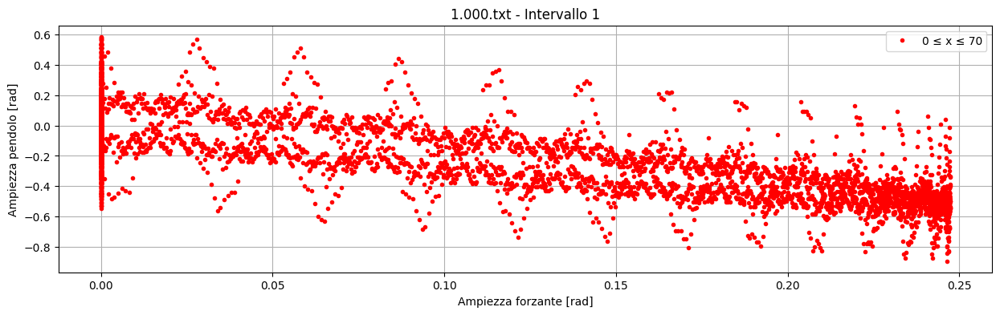


=== Analisi per il file: 0.905.txt ===


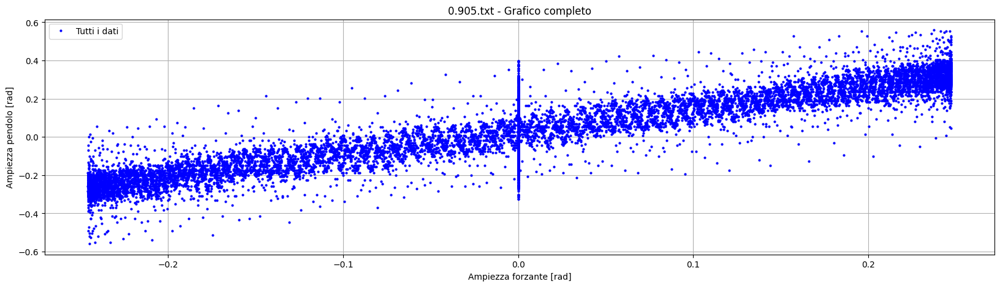

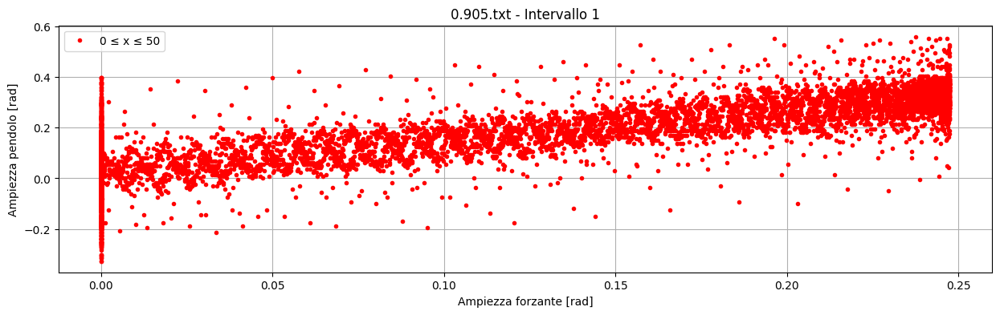


=== Analisi per il file: 0.910.txt ===


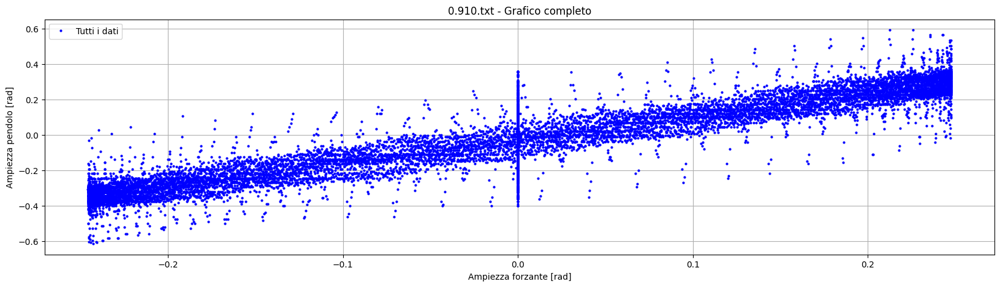

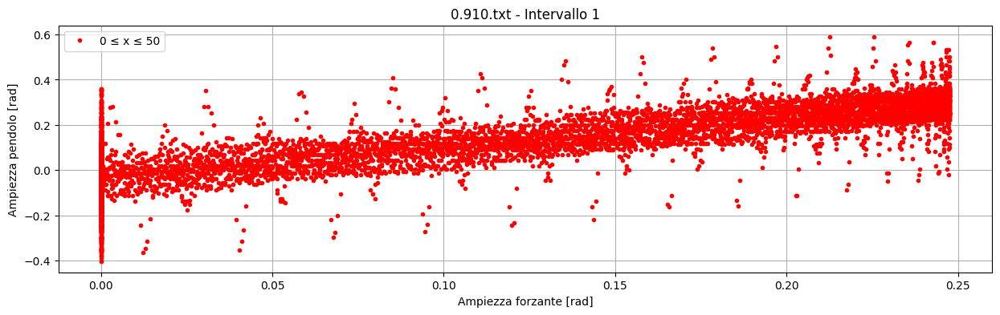


=== Analisi per il file: 0.955.txt ===


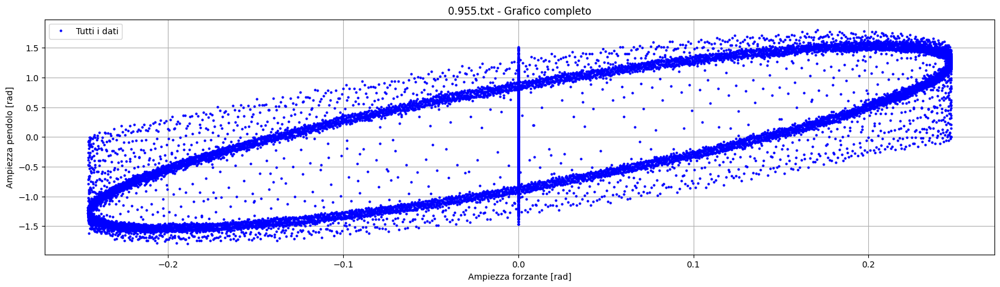

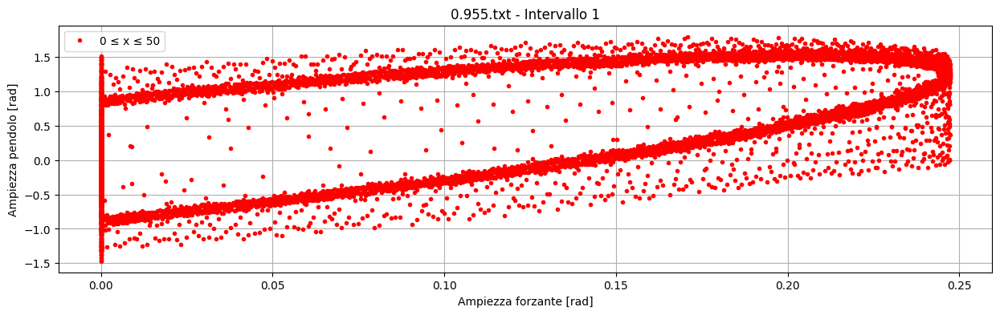


=== Analisi per il file: 0.963.txt ===


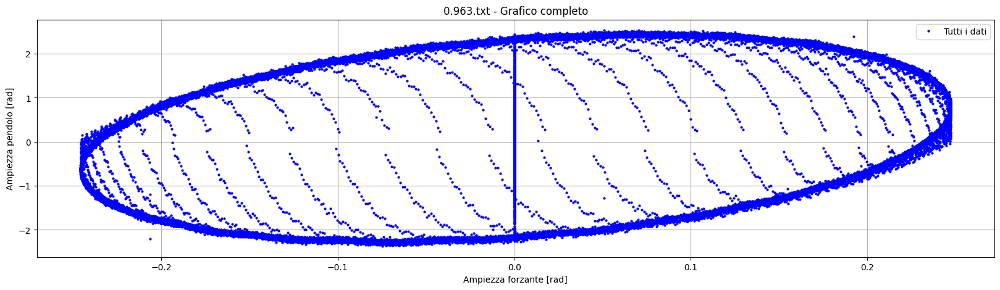

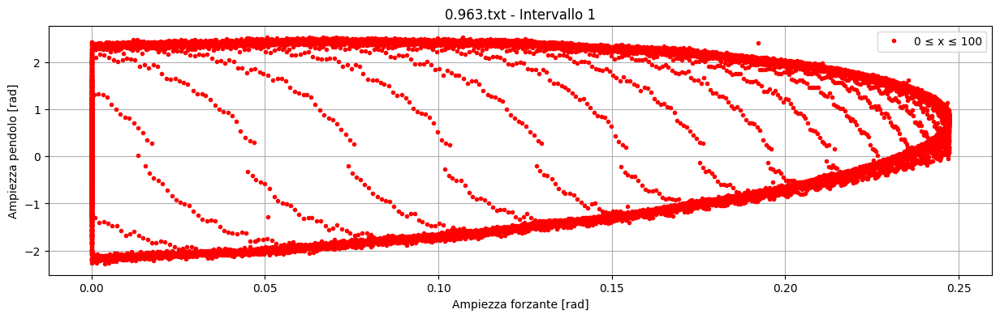


=== Analisi per il file: 0.966.txt ===


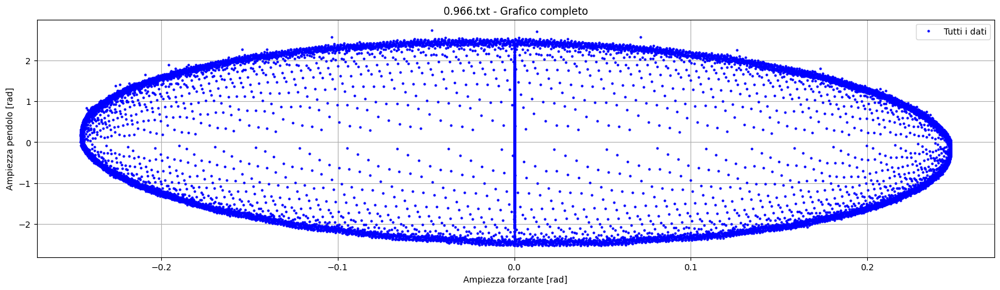

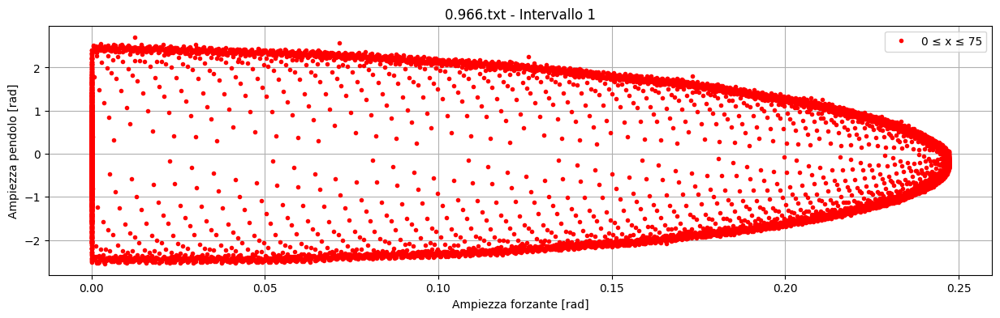


=== Analisi per il file: 0.967.txt ===


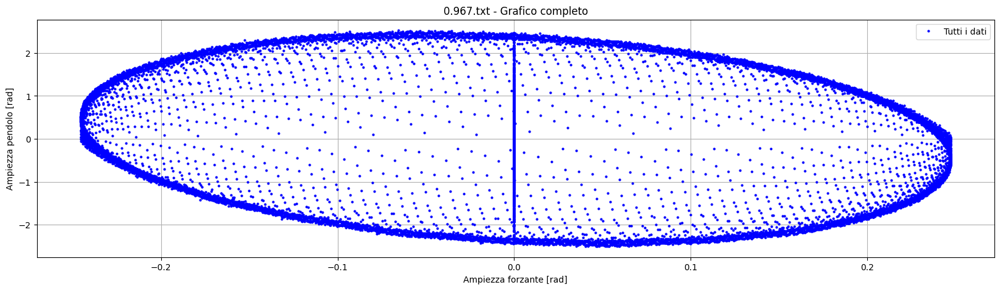

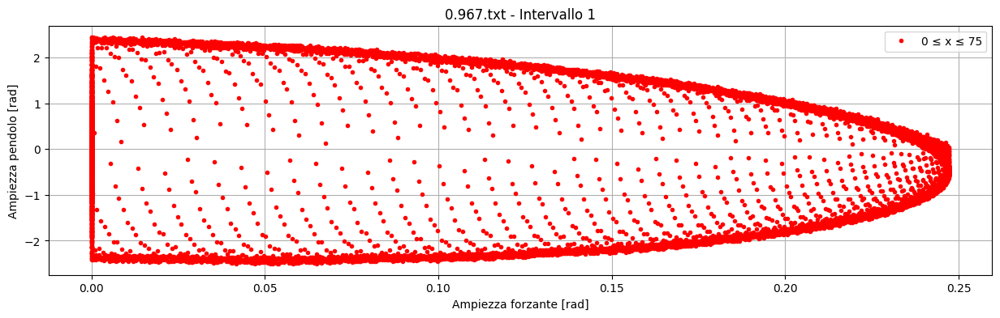


=== Analisi per il file: 0.990.txt ===


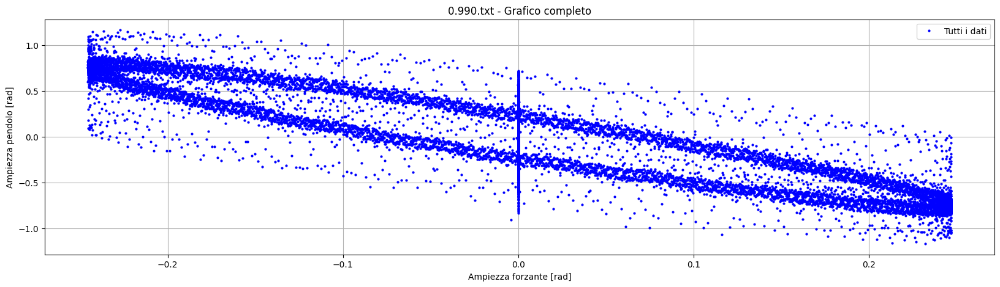

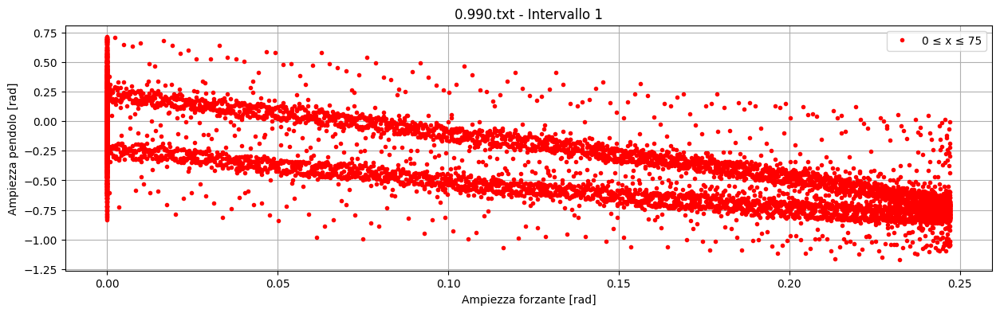


=== Analisi per il file: 0.995.txt ===


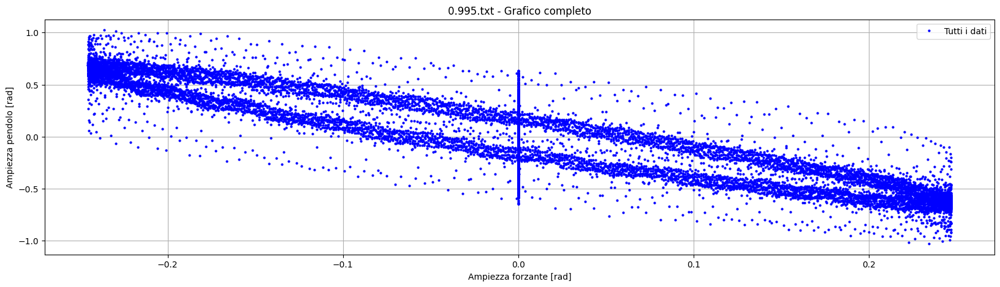

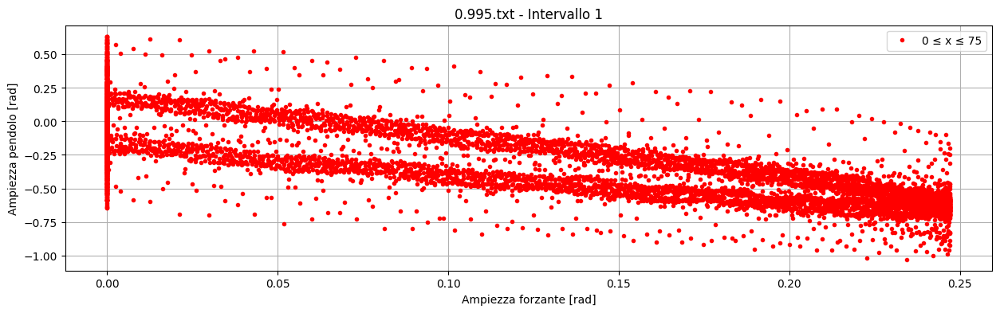


=== Analisi per il file: 0.9645.txt ===


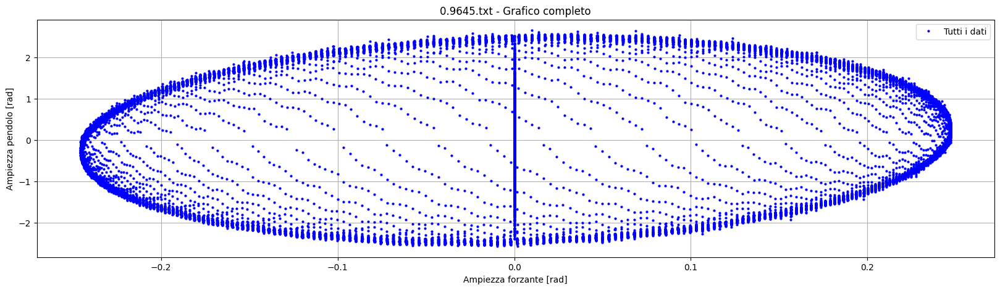

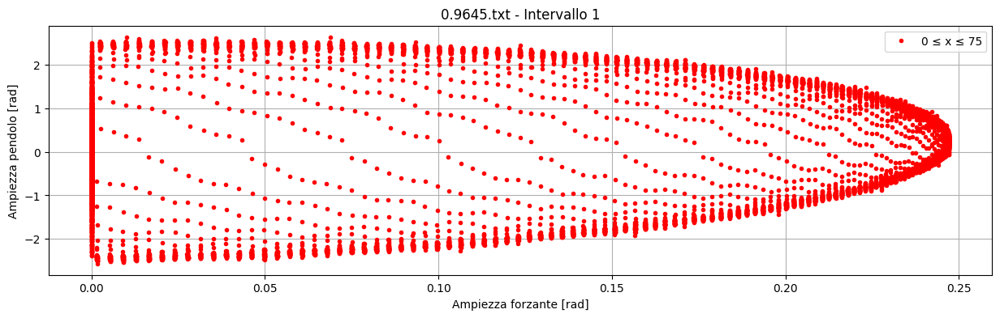

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import bisect
import os
import math

# === Lista dei file da analizzare ===
file_paths = list(intervalli_per_file.keys())

# === Funzioni utili ===
def filtra_intervallo(x_data, y_data, xmin, xmax):
    x_filtrato = []
    y_filtrato = []
    for xi, yi in zip(x_data, y_data):
        if xmin <= xi <= xmax:
            x_filtrato.append(xi)
            y_filtrato.append(yi)
    return x_filtrato, y_filtrato

def trova_indice_piu_vicino(arr, val):
    pos = bisect.bisect_left(arr, val)
    if pos == 0:
        return 0
    if pos == len(arr):
        return len(arr) - 1
    before = pos - 1
    after = pos
    return before if abs(arr[before] - val) <= abs(arr[after] - val) else after

# === Loop sui file ===
for file_path in file_paths:
    print(f"\n=== Analisi per il file: {file_path} ===")
    x_split_1, x_split_2 = intervalli_per_file.get(file_path, (60, 185))

    x_vals = []
    y_vals = []

    # Lettura file con trasformazioni
    try:
        with open(file_path, 'r') as file:
            lines = file.readlines()
        for line in lines[1:]:  # Salta intestazione
            parts = line.strip().split()
            if len(parts) >= 3:
                try:
                    x = float(parts[1]) * 2 * math.pi / 1000  # seconda colonna trasformata
                    y = float(parts[2]) * 2 * math.pi         # terza colonna trasformata
                    x_vals.append(x)
                    y_vals.append(y)
                except ValueError:
                    continue
    except Exception as e:
        print(f"Errore con il file {file_path}: {e}")
        continue

    if not x_vals:
        print("Nessun dato valido trovato.")
        continue

    # Intervalli
    x1, y1 = filtra_intervallo(x_vals, y_vals, 0, x_split_1)
    x2, y2 = filtra_intervallo(x_vals, y_vals, x_split_1 + 1, x_split_2)
    max_x_val = max(x_vals)
    x3, y3 = filtra_intervallo(x_vals, y_vals, x_split_2 + 1, max_x_val)

    # Plot completo
    plt.figure(figsize=(20, 5))
    plt.plot(x_vals, y_vals, '.', markersize=4, color='blue', label='Tutti i dati')
    plt.xlabel('Ampiezza forzante [rad]')
    plt.ylabel('Ampiezza pendolo [rad]')
    plt.title(f'{file_path} - Grafico completo')
    plt.grid(True)
    plt.legend()
    plt.show()

    # Intervallo 1
    if x1:
        plt.figure(figsize=(15, 4))
        plt.plot(x1, y1, '.', markersize=6, color='red', label=f'0 ≤ x ≤ {x_split_1}')
        plt.xlabel('Ampiezza forzante [rad]')
        plt.ylabel('Ampiezza pendolo [rad]')
        plt.title(f'{file_path} - Intervallo 1')
        plt.grid(True)
        plt.legend()
        plt.show()

    # Intervallo 2
    if x2:
        plt.figure(figsize=(50, 4))
        plt.plot(x2, y2, '.', markersize=6, color='green', label=f'{x_split_1+1} ≤ x ≤ {x_split_2}')
        plt.xlabel('Ampiezza forzante [rad]')
        plt.ylabel('Ampiezza pendolo [rad]')
        plt.title(f'{file_path} - Intervallo 2')
        plt.grid(True)
        plt.legend()
        plt.show()

    # Intervallo 3
    if x3:
        plt.figure(figsize=(50, 4))
        plt.plot(x3, y3, '.', markersize=6, color='purple', label=f'x ≥ {x_split_2+1}')
        plt.xlabel('Ampiezza forzante [rad]')
        plt.ylabel('Ampiezza pendolo [rad]')
        plt.title(f'{file_path} - Intervallo 3')
        plt.grid(True)
        plt.legend()
        plt.show()


In [3]:
# Dizionari per contenere i dati divisi per ogni file
# Intervallo 2: da x_split_1+1 a x_split_2
# Finale: da x_split_2+1 fino alla fine
dati_staz = {}
dati_decr = {}

for file_path in intervalli_per_file.keys():
    x_split_1, x_split_2 = intervalli_per_file[file_path]

    x_vals = []
    y_vals = []

    try:
        with open(file_path, 'r') as file:
            lines = file.readlines()

        for line in lines[1:]:  # Salta intestazione
            parts = line.strip().split()
            if len(parts) >= 3:
                try:
                    x = float(parts[0])
                    y = float(parts[2])
                    x_vals.append(x)
                    y_vals.append(y)
                except ValueError:
                    continue
    except Exception as e:
        print(f"Errore durante la lettura di {file_path}: {e}")
        continue

    if not x_vals:
        print(f"Nessun dato valido per {file_path}")
        continue

    # Intervallo 2
    x2, y2 = filtra_intervallo(x_vals, y_vals, x_split_1 + 1, x_split_2)
    dati_staz[file_path] = (x2, y2)

    # Finale
    max_x_val = max(x_vals)
    x3, y3 = filtra_intervallo(x_vals, y_vals, x_split_2 + 1, max_x_val)
    dati_decr[file_path] = (x3, y3)






TROVA MAX

=== INIZIO ANALISI FINALE: MASSIMI E MINIMI (con dt teorico) ===

--- Analisi completa per: 0.900.txt ---
Fase 'stazionario': Trovati 71 massimi e 70 minimi.
Fase 'decremento': Trovati 62 massimi e 62 minimi.


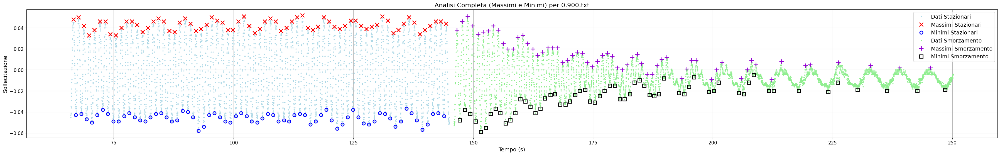


--- Analisi completa per: 0.905.txt ---
Fase 'stazionario': Trovati 176 massimi e 175 minimi.
Fase 'decremento': Trovati 48 massimi e 50 minimi.


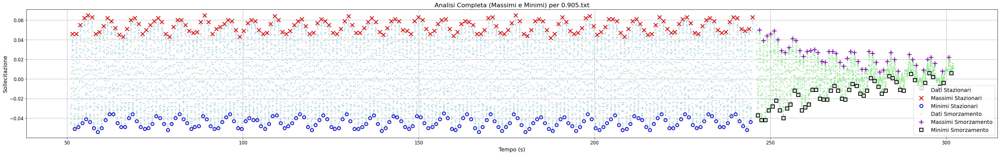


--- Analisi completa per: 0.910.txt ---
Fase 'stazionario': Trovati 176 massimi e 177 minimi.
Fase 'decremento': Trovati 38 massimi e 38 minimi.


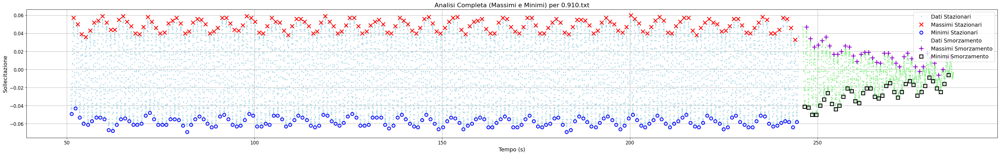


--- Analisi completa per: 0.950.txt ---
Fase 'stazionario': Trovati 103 massimi e 104 minimi.
Fase 'decremento': Trovati 93 massimi e 91 minimi.


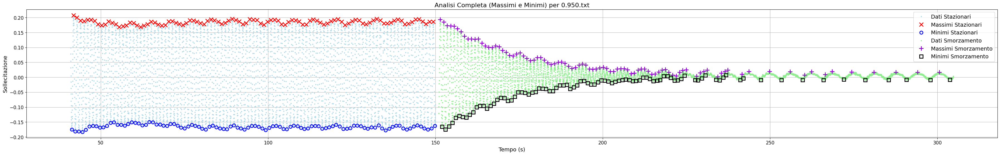


--- Analisi completa per: 0.955.txt ---
Fase 'stazionario': Trovati 212 massimi e 212 minimi.
Fase 'decremento': Trovati 100 massimi e 99 minimi.


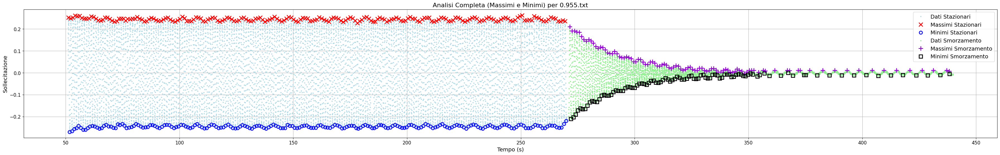


--- Analisi completa per: 0.960.txt ---
Fase 'stazionario': Trovati 93 massimi e 93 minimi.
Fase 'decremento': Trovati 108 massimi e 106 minimi.


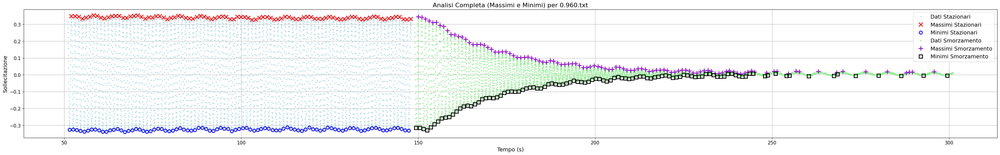


--- Analisi completa per: 0.963.txt ---
Fase 'stazionario': Trovati 297 massimi e 297 minimi.
Fase 'decremento': Trovati 102 massimi e 102 minimi.


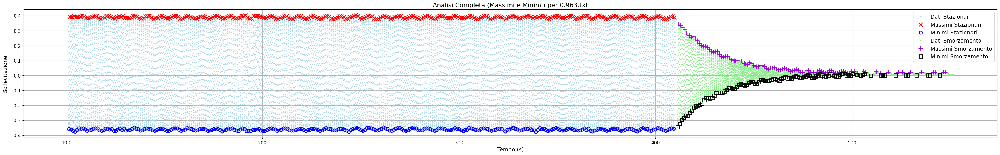


--- Analisi completa per: 0.9645.txt ---
Fase 'stazionario': Trovati 187 massimi e 187 minimi.
Fase 'decremento': Trovati 89 massimi e 88 minimi.


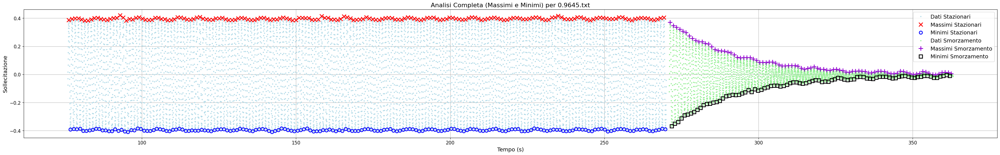


--- Analisi completa per: 0.965.txt ---
Fase 'stazionario': Trovati 134 massimi e 134 minimi.
Fase 'decremento': Trovati 95 massimi e 96 minimi.


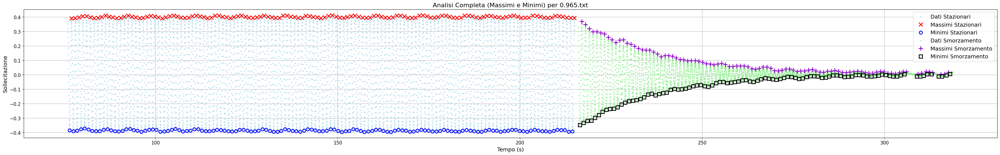


--- Analisi completa per: 0.966.txt ---
Fase 'stazionario': Trovati 163 massimi e 163 minimi.
Fase 'decremento': Trovati 110 massimi e 109 minimi.


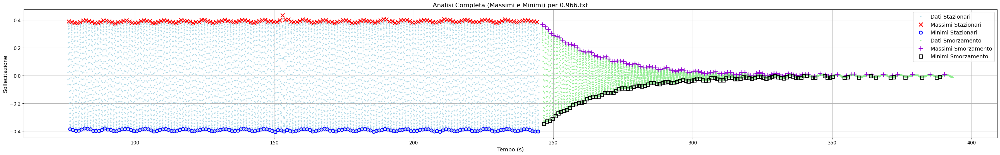


--- Analisi completa per: 0.967.txt ---
Fase 'stazionario': Trovati 183 massimi e 183 minimi.
Fase 'decremento': Trovati 100 massimi e 100 minimi.


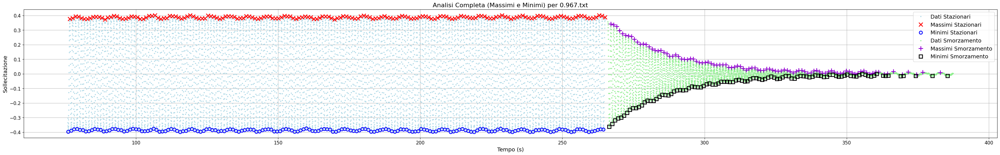


--- Analisi completa per: 0.9675.txt ---
Fase 'stazionario': Trovati 136 massimi e 137 minimi.
Fase 'decremento': Trovati 92 massimi e 92 minimi.


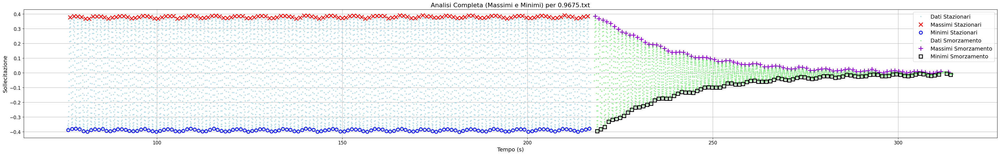


--- Analisi completa per: 0.970.txt ---
Fase 'stazionario': Trovati 120 massimi e 121 minimi.
Fase 'decremento': Trovati 89 massimi e 90 minimi.


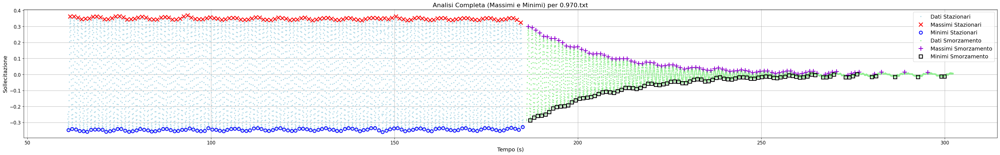


--- Analisi completa per: 0.9725.txt ---
Fase 'stazionario': Trovati 109 massimi e 109 minimi.
Fase 'decremento': Trovati 92 massimi e 91 minimi.


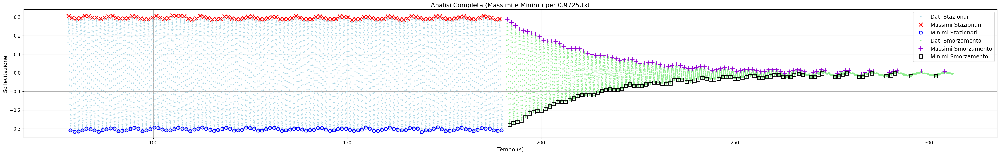


--- Analisi completa per: 0.975.txt ---
Fase 'stazionario': Trovati 104 massimi e 104 minimi.
Fase 'decremento': Trovati 96 massimi e 96 minimi.


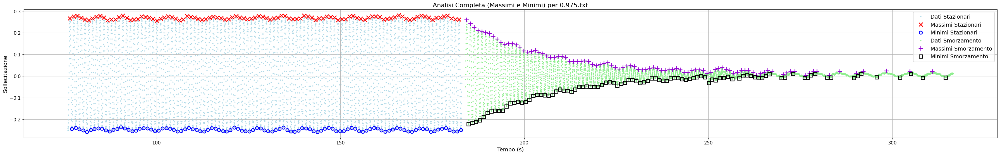


--- Analisi completa per: 0.980.txt ---
Fase 'stazionario': Trovati 146 massimi e 146 minimi.
Fase 'decremento': Trovati 78 massimi e 78 minimi.


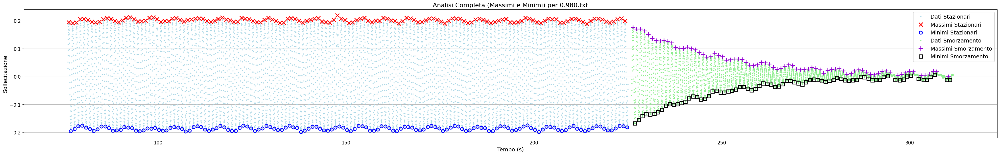


--- Analisi completa per: 0.990.txt ---
Fase 'stazionario': Trovati 163 massimi e 162 minimi.
Fase 'decremento': Trovati 57 massimi e 57 minimi.


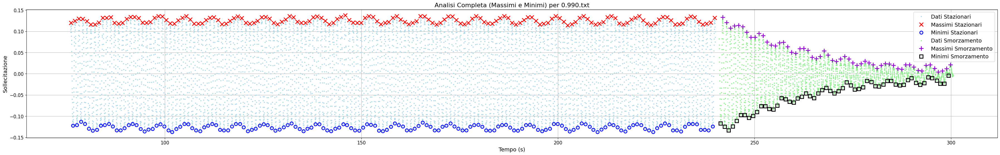


--- Analisi completa per: 0.995.txt ---
Fase 'stazionario': Trovati 158 massimi e 158 minimi.
Fase 'decremento': Trovati 83 massimi e 82 minimi.


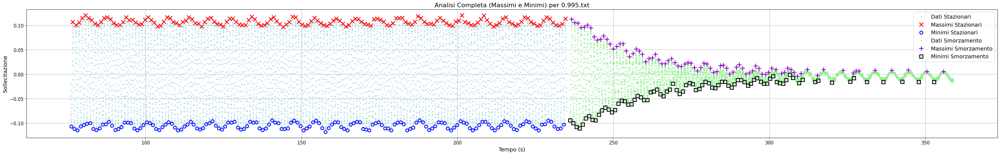


--- Analisi completa per: 1.000.txt ---
Fase 'stazionario': Trovati 84 massimi e 84 minimi.
Fase 'decremento': Trovati 84 massimi e 84 minimi.


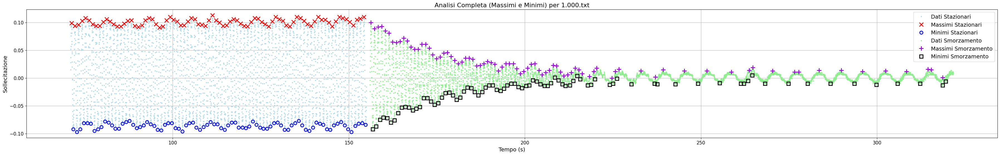


=== ANALISI FINALE COMPLETATA ===


In [4]:
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
import numpy as np

# ==============================================================================
# 1. FUNZIONE PER TROVARE I MASSIMI (AGGIORNATA)
# ==============================================================================
def trova_picchi_periodici(tempo_dati, sollecitazione_dati, periodo_T, prominence=0.01, distance_factor=0.8):
    """Trova i massimi in un segnale usando il passo temporale teorico di 50 Hz."""
    # Converte in array numpy per sicurezza
    tempo_dati, sollecitazione_dati = np.array(tempo_dati), np.array(sollecitazione_dati)
    if tempo_dati.size < 2: return np.array([]), np.array([])

    # --- MODIFICA: Usiamo il valore teorico (1/50s) invece di calcolarlo dai dati ---
    passo_temporale_dt = 1 / 50
    # --------------------------------------------------------------------------

    distanza_minima_campioni = int(distance_factor * periodo_T / passo_temporale_dt)
    picchi_indici, _ = find_peaks(sollecitazione_dati, distance=distanza_minima_campioni, prominence=prominence)
    return tempo_dati[picchi_indici], sollecitazione_dati[picchi_indici]


# ==============================================================================
# 2. FUNZIONE PER TROVARE I MINIMI (AGGIORNATA)
# ==============================================================================
def trova_minimi_periodici(tempo_dati, sollecitazione_dati, periodo_T, prominence=0.01, distance_factor=0.8):
    """Trova i minimi usando il passo temporale teorico e invertendo il segnale."""
    # Converte in array numpy per sicurezza
    tempo_dati, sollecitazione_dati = np.array(tempo_dati), np.array(sollecitazione_dati)
    if tempo_dati.size < 2:
        return np.array([]), np.array([])

    sollecitazione_invertita = -sollecitazione_dati

    # --- MODIFICA: Usiamo il valore teorico (1/50s) invece di calcolarlo dai dati ---
    passo_temporale_dt = 1 / 50
    # --------------------------------------------------------------------------

    distanza_minima_campioni = int(distance_factor * periodo_T / passo_temporale_dt)
    minimi_indici, _ = find_peaks(
        sollecitazione_invertita,
        distance=distanza_minima_campioni,
        prominence=prominence
    )
    return tempo_dati[minimi_indici], sollecitazione_dati[minimi_indici]


# ==============================================================================
# 3. CICLO DI ANALISI (modificato per dimensioni testo e legenda)
# ==============================================================================
risultati_finali = {}
# Imposta la dimensione di default per tutte le figure
plt.rcParams['figure.figsize'] = [45, 6]
# Impostazioni aggiunte per testo più grande
plt.rcParams['legend.fontsize'] = 14
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

print("=== INIZIO ANALISI FINALE: MASSIMI E MINIMI (con dt teorico) ===")

# Usa la lista ordinata per frequenza
for file_path in file_ordinati:
    print(f"\n--- Analisi completa per: {file_path} ---")

    periodo_T_file = periodi_T[file_path]
    risultati_finali[file_path] = {}

    for fase in ['stazionario', 'decremento']:
        if fase == 'stazionario':
            tempo_dati, soll_dati = dati_staz[file_path]
        else:
            tempo_dati, soll_dati = dati_decr[file_path]

        # Trova massimi e minimi usando le funzioni aggiornate
        picchi_tempo, picchi_soll = trova_picchi_periodici(tempo_dati, soll_dati, periodo_T_file)
        minimi_tempo, minimi_soll = trova_minimi_periodici(tempo_dati, soll_dati, periodo_T_file)

        print(f"Fase '{fase}': Trovati {len(picchi_tempo)} massimi e {len(minimi_tempo)} minimi.")

        risultati_finali[file_path][fase] = {
            'massimi': {'tempo': picchi_tempo, 'sollecitazione': picchi_soll},
            'minimi': {'tempo': minimi_tempo, 'sollecitazione': minimi_soll}
        }

    # --- Grafico di verifica completo ---
    plt.figure()

    tempo_staz, soll_staz = dati_staz[file_path]
    plt.plot(tempo_staz, soll_staz, '.', markersize=4, color='lightblue', label='Dati Stazionari')
    plt.plot(risultati_finali[file_path]['stazionario']['massimi']['tempo'],
             risultati_finali[file_path]['stazionario']['massimi']['sollecitazione'],
             'x', color='red', markersize=10, mew=2, label='Massimi Stazionari')
    plt.plot(risultati_finali[file_path]['stazionario']['minimi']['tempo'],
             risultati_finali[file_path]['stazionario']['minimi']['sollecitazione'],
             'o', color='blue', markersize=8, mfc='none', mew=2, label='Minimi Stazionari')

    tempo_decr, soll_decr = dati_decr[file_path]
    plt.plot(tempo_decr, soll_decr, '.', markersize=4, color='lightgreen', label='Dati Smorzamento')
    plt.plot(risultati_finali[file_path]['decremento']['massimi']['tempo'],
             risultati_finali[file_path]['decremento']['massimi']['sollecitazione'],
             '+', color='darkviolet', markersize=12, mew=2, label='Massimi Smorzamento')
    plt.plot(risultati_finali[file_path]['decremento']['minimi']['tempo'],
             risultati_finali[file_path]['decremento']['minimi']['sollecitazione'],
             's', color='black', markersize=8, mfc='none', mew=2, label='Minimi Smorzamento')

    plt.title(f'Analisi Completa (Massimi e Minimi) per {file_path}', fontsize=16)
    plt.xlabel('Tempo (s)', fontsize=14)
    plt.ylabel('Sollecitazione', fontsize=14)
    plt.legend(fontsize=14)
    plt.grid(True)
    plt.show()

print("\n=== ANALISI FINALE COMPLETATA ===")

HISTO

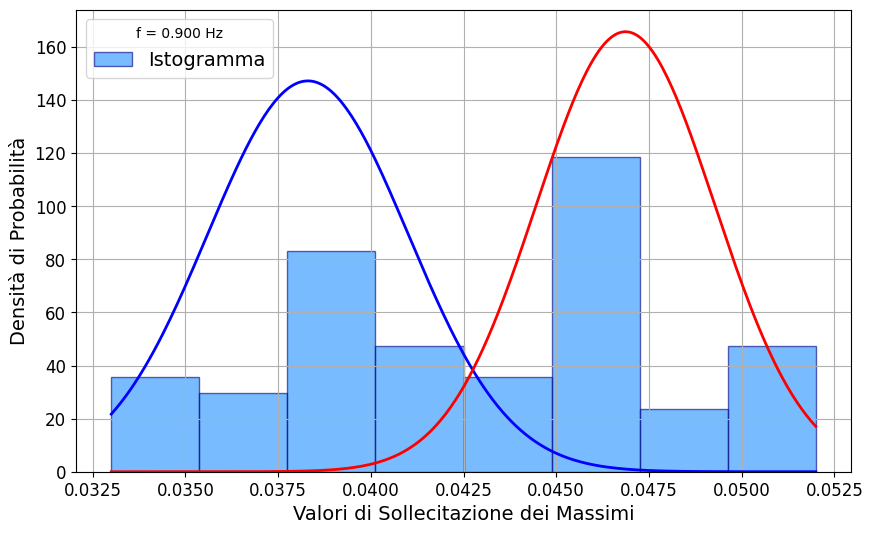

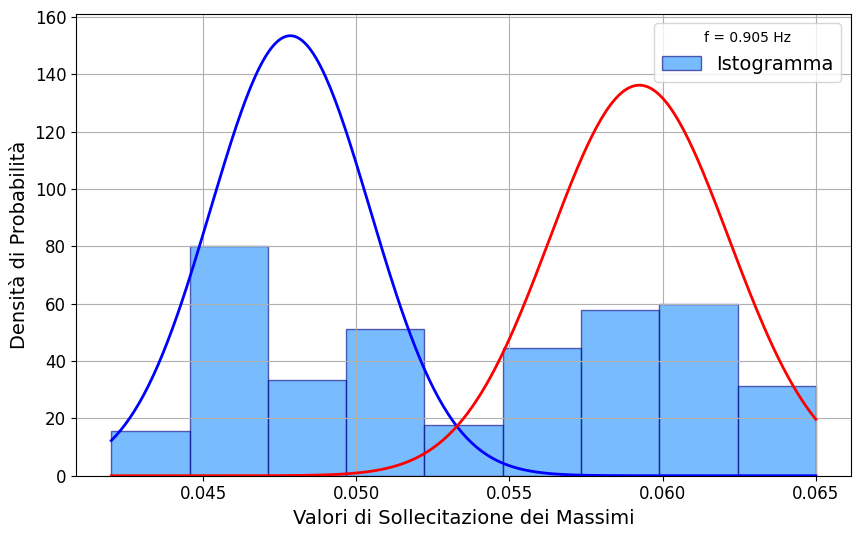

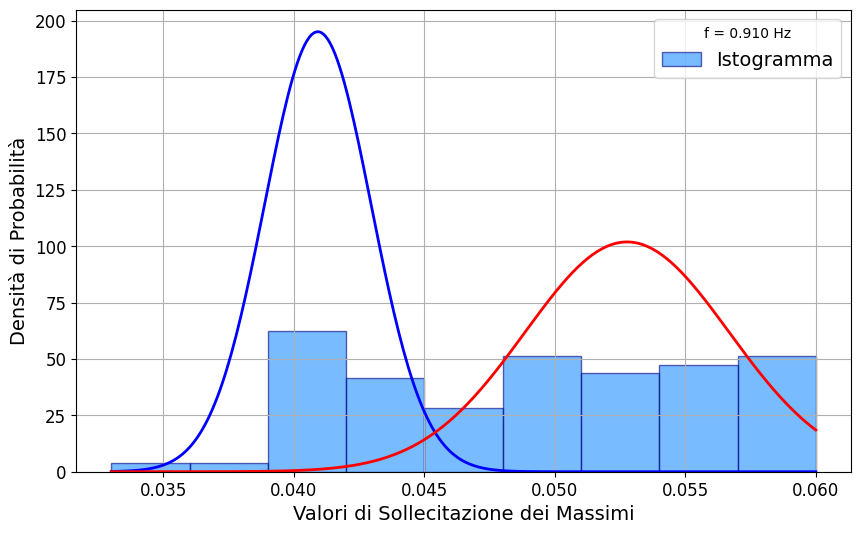

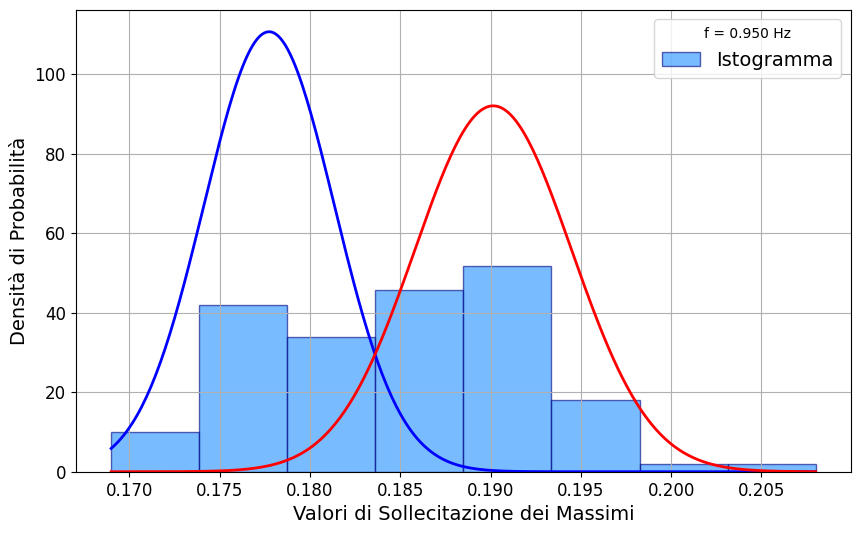

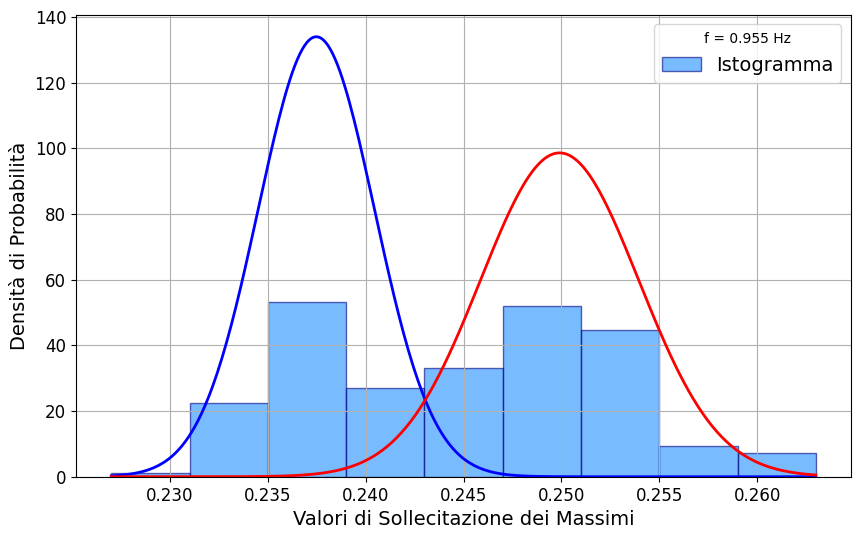

0.960.txt: Solo un picco trovato, provo con più bin...


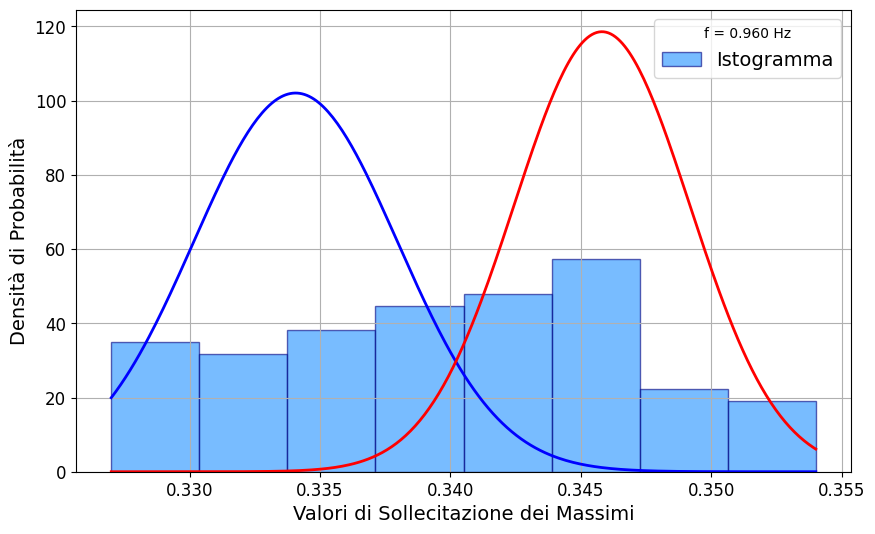

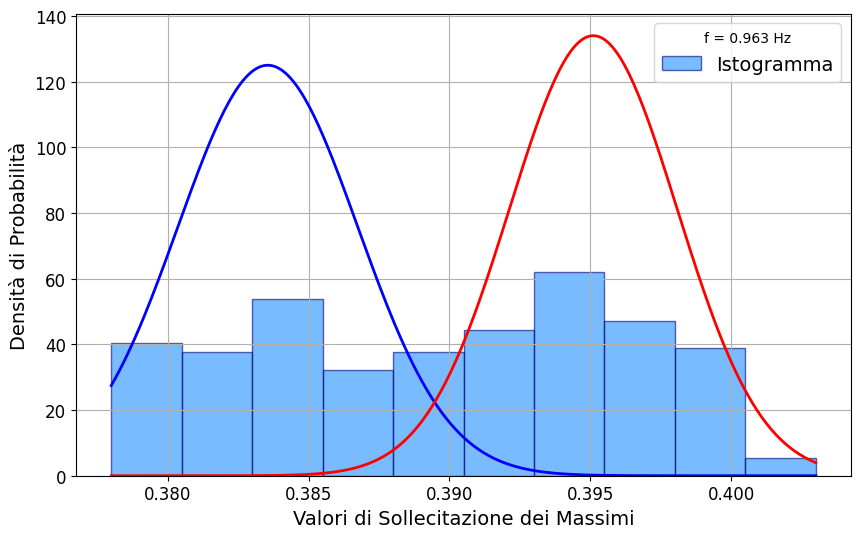

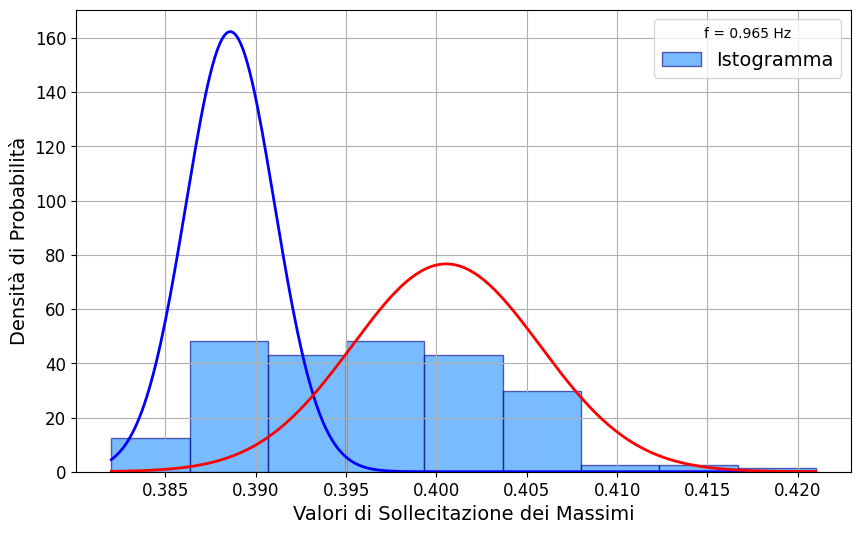

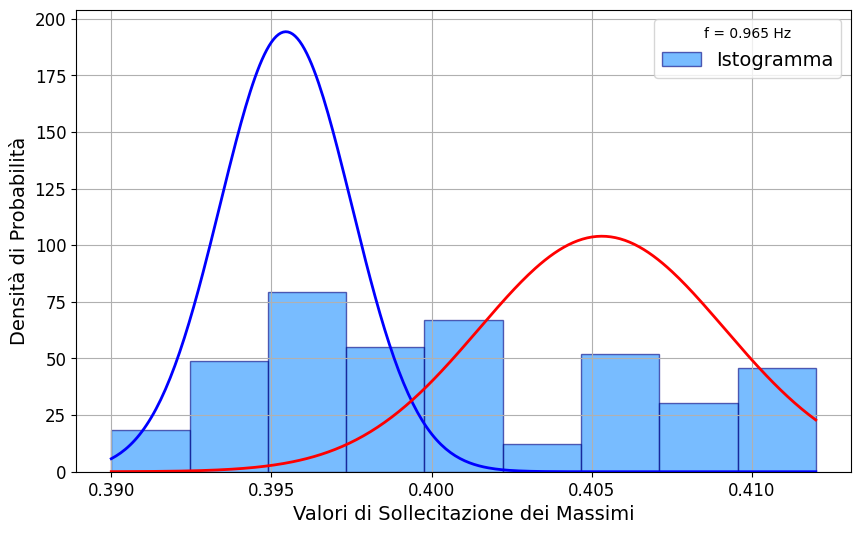

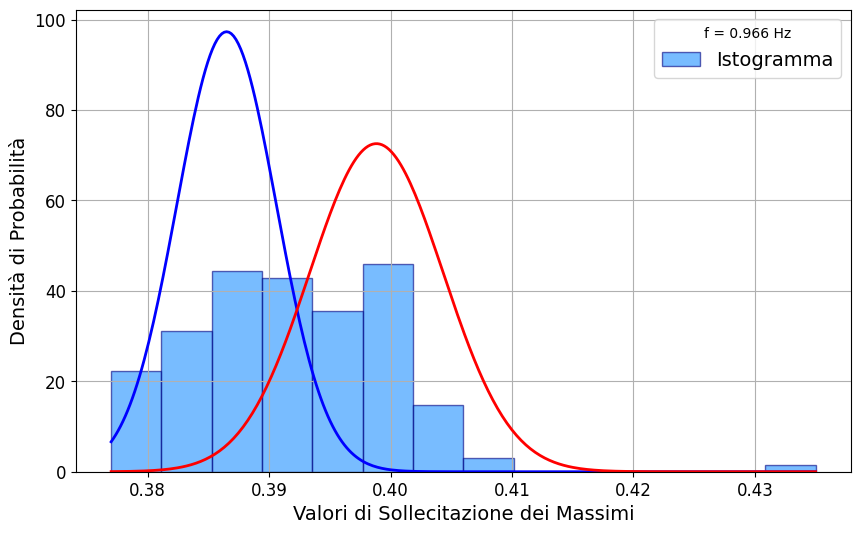

...

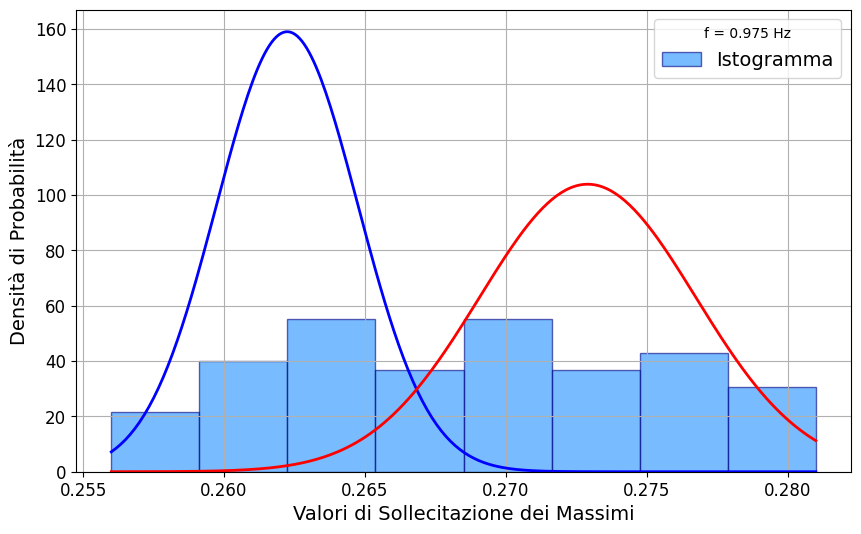

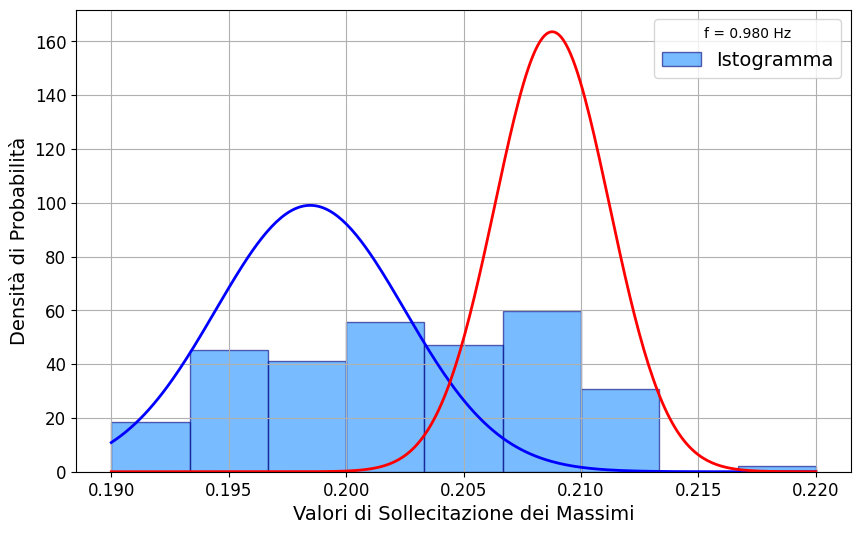

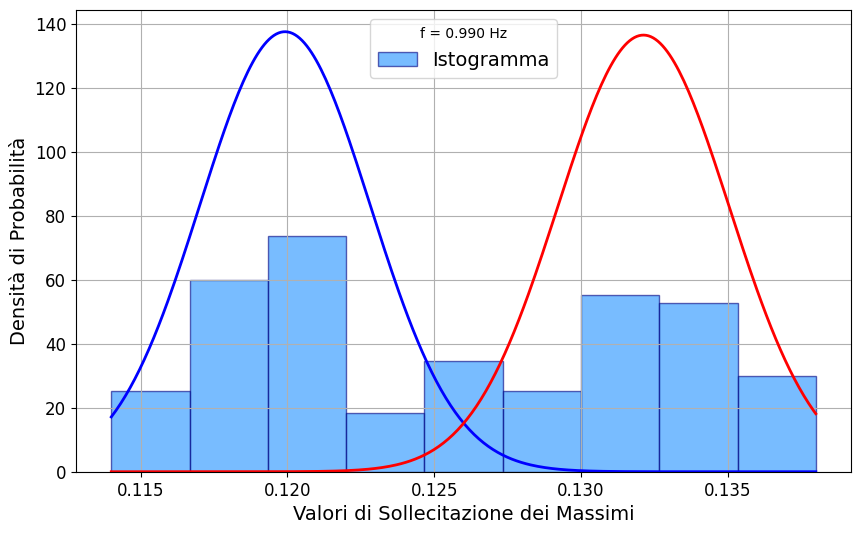

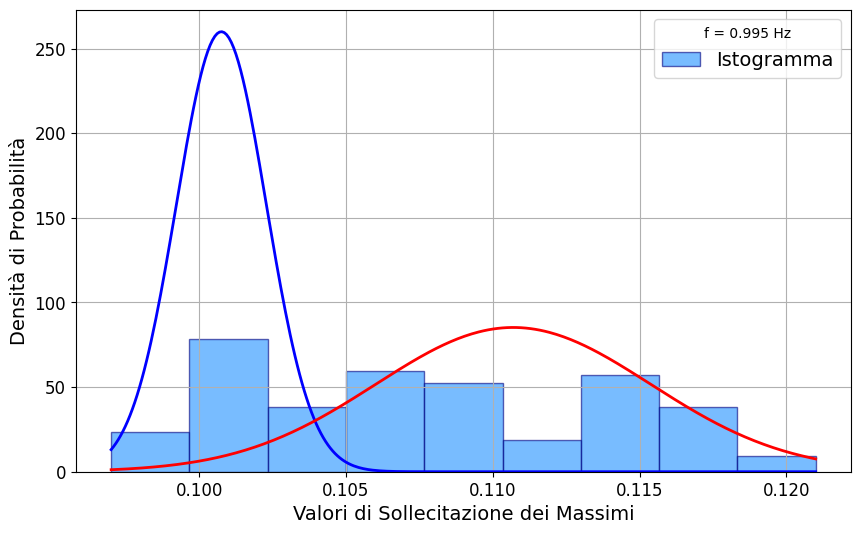

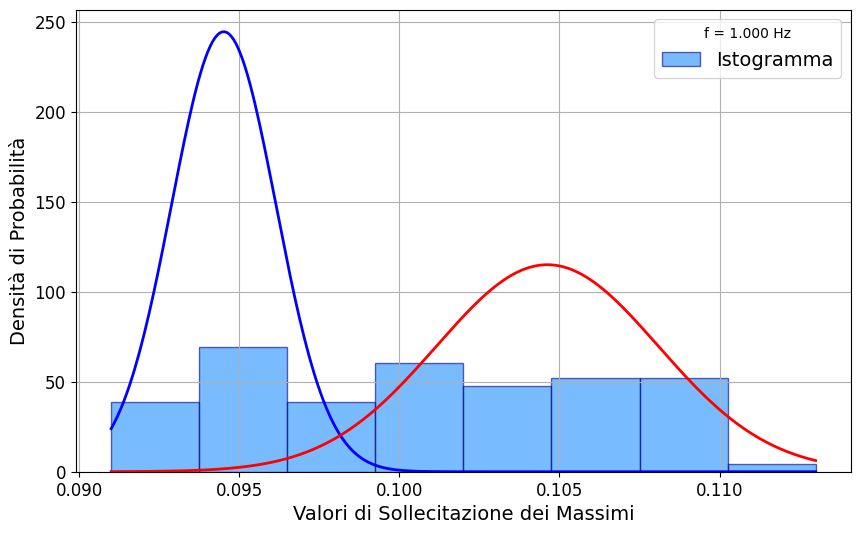


0.900.txt:
  μ_sx = 0.038
  μ_dx = 0.047
  μ_medio = 0.043
  σ_media = 0.003
  σ_campionaria corretta (x√10) = 0.008
  σ_media (non corretta) = 0.000
  σ_media (corretta x10) = 0.003
  σ_uniforme = 0.005

0.905.txt:
  μ_sx = 0.048
  μ_dx = 0.059
  μ_medio = 0.054
  σ_media = 0.003
  σ_campionaria corretta (x√10) = 0.009
  σ_media (non corretta) = 0.000
  σ_media (corretta x10) = 0.002
  σ_uniforme = 0.007

0.910.txt:
  μ_sx = 0.041
  μ_dx = 0.053
  μ_medio = 0.047
  σ_media = 0.003
  σ_campionaria corretta (x√10) = 0.009
  σ_media (non corretta) = 0.000
  σ_media (corretta x10) = 0.002
  σ_uniforme = 0.008

0.950.txt:
  μ_sx = 0.178
  μ_dx = 0.190
  μ_medio = 0.184
  σ_media = 0.004
  σ_campionaria corretta (x√10) = 0.013
  σ_media (non corretta) = 0.000
  σ_media (corretta x10) = 0.004
  σ_uniforme = 0.011

0.955.txt:
  μ_sx = 0.237
  μ_dx = 0.250
  μ_medio = 0.244
  σ_media = 0.004
  σ_campionaria corretta (x√10) = 0.011
  σ_media (non corretta) = 0.000
  σ_media (corretta x10) = 0.

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.signal import find_peaks

risultati_fit_massimi = {}

for nome_file in file_ordinati:
    massimi_y = risultati_finali[nome_file]['stazionario']['massimi']['sollecitazione']

    if len(massimi_y) < 10:
        print(f"{nome_file}: Dati insufficienti.")
        continue

    # Primo tentativo con bins='auto'
    hist_vals, bin_edges = np.histogram(massimi_y, bins='auto')
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    peaks, _ = find_peaks(hist_vals, distance=2)

    # Se solo un picco e file è 0.950 o 0.960, riprova con più bin
    if len(peaks) < 2 and nome_file in ['0.950.txt', '0.960.txt']:
        print(f"{nome_file}: Solo un picco trovato, provo con più bin...")
        hist_vals, bin_edges = np.histogram(massimi_y, bins=30)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        peaks, _ = find_peaks(hist_vals, distance=1)

    if len(peaks) < 2:
        print(f"{nome_file}: Picchi insufficienti anche dopo il tentativo.")
        continue

    # Seleziona i due picchi principali
    peak_indices = peaks[np.argsort(hist_vals[peaks])[-2:]]
    peak_positions = bin_centers[peak_indices]
    peak_positions.sort()
    midpoint = np.mean(peak_positions)

    # Divide i dati
    left_group = massimi_y[massimi_y <= midpoint]
    right_group = massimi_y[massimi_y > midpoint]

    # Fit gaussiano
    mu_sx, std_sx = np.mean(left_group), np.std(left_group, ddof=1)
    mu_dx, std_dx = np.mean(right_group), np.std(right_group, ddof=1)
    mu_medio = (mu_sx + mu_dx) / 2

    std_media = (std_sx + std_dx) / 2
    std_corretto = std_media * np.sqrt(10)
    std_media_noncorretta = std_media / np.sqrt(len(massimi_y))
    std_media_corretto = std_media_noncorretta * 10

    # Incertezza distribuzione uniforme
    a, b = np.min(massimi_y), np.max(massimi_y)
    std_uniforme = (b - a) / np.sqrt(12)

    risultati_fit_massimi[nome_file] = {
        'mu_sx': mu_sx, 'mu_dx': mu_dx,
        'mu_medio': mu_medio,
        'std_media': std_media,
        'std_corretto': std_corretto,
        'std_media_noncorretta': std_media_noncorretta,
        'std_media_corretto': std_media_corretto,
        'std_uniforme': std_uniforme,
    }

    # Plot
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.hist(massimi_y, bins='auto', density=True, alpha=0.6, color='dodgerblue', edgecolor='navy', label='Istogramma')
    x = np.linspace(min(massimi_y), max(massimi_y), 300)
    ax.plot(x, norm.pdf(x, mu_sx, std_sx), 'b-', lw=2)
    ax.plot(x, norm.pdf(x, mu_dx, std_dx), 'r-', lw=2)
    ax.set_xlabel("Valori di Sollecitazione dei Massimi")
    ax.set_ylabel("Densità di Probabilità")
    ax.grid(True)
    ax.legend(title=f"f = {frequenza_f[nome_file]:.3f} Hz")
    plt.show()

# Report finale
for nome_file, stats in risultati_fit_massimi.items():
    print(f"\n{nome_file}:")
    print(f"  μ_sx = {stats['mu_sx']:.3f}")
    print(f"  μ_dx = {stats['mu_dx']:.3f}")
    print(f"  μ_medio = {stats['mu_medio']:.3f}")
    print(f"  σ_media = {stats['std_media']:.3f}")
    print(f"  σ_campionaria corretta (x√10) = {stats['std_corretto']:.3f}")
    print(f"  σ_media (non corretta) = {stats['std_media_noncorretta']:.3f}")
    print(f"  σ_media (corretta x10) = {stats['std_media_corretto']:.3f}")
    print(f"  σ_uniforme = {stats['std_uniforme']:.3f}")


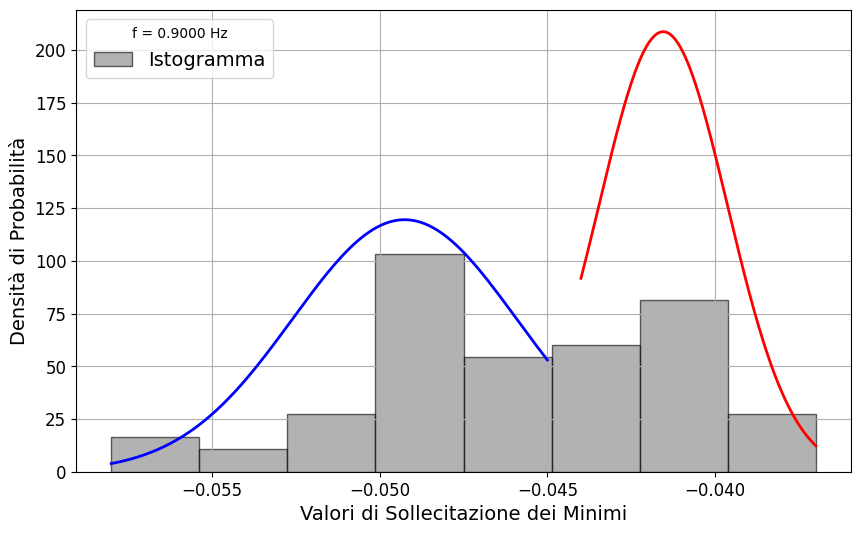

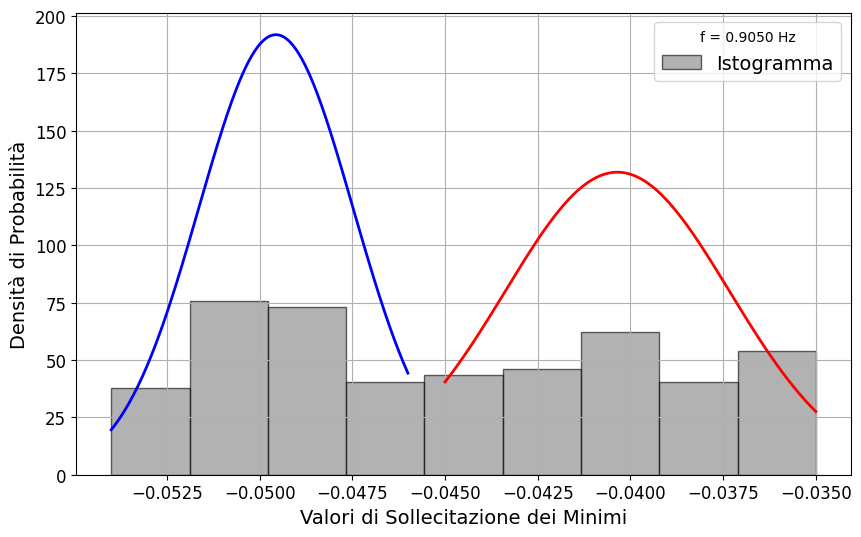

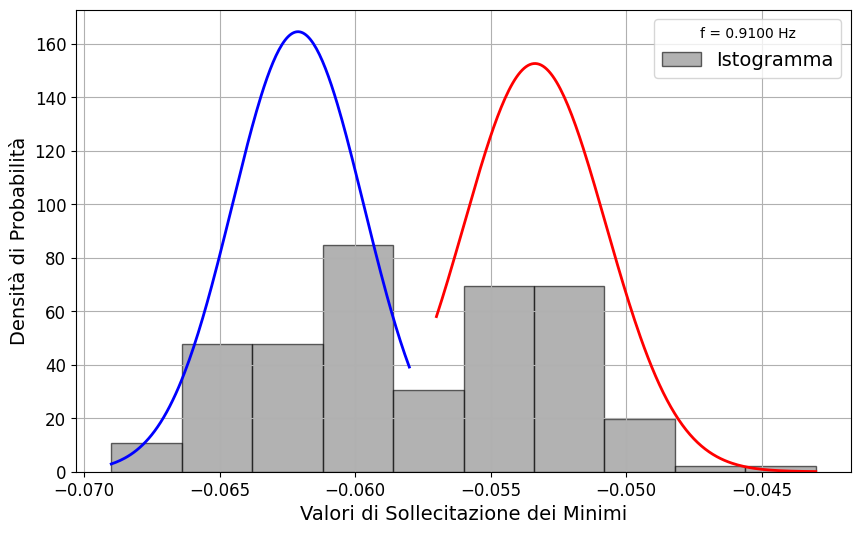

0.950.txt: Solo un picco trovato, provo con più bin...


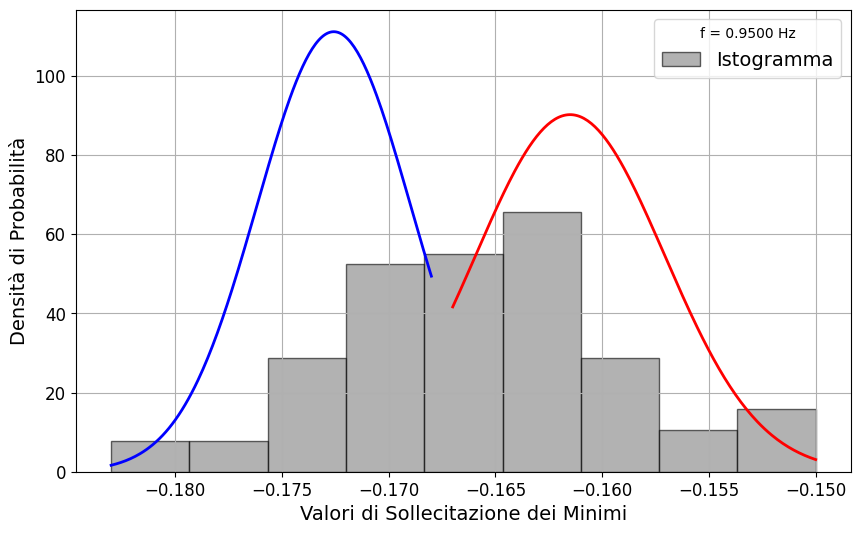

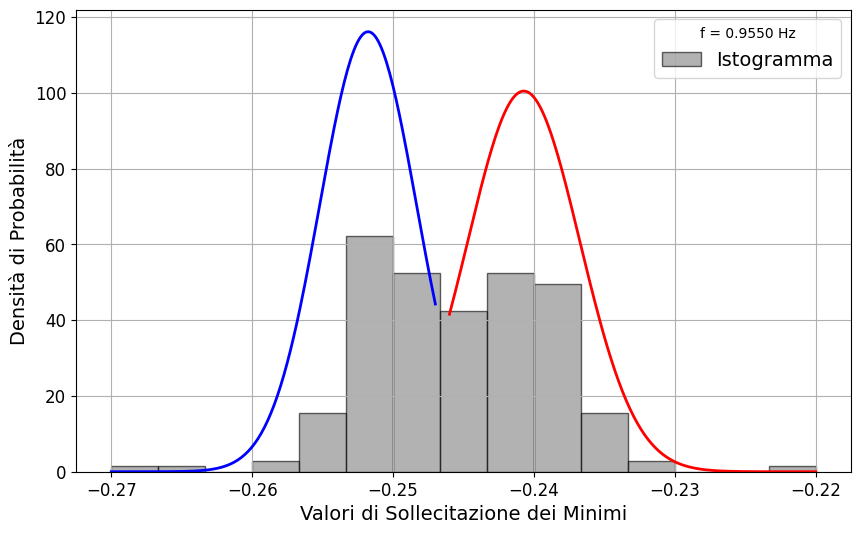

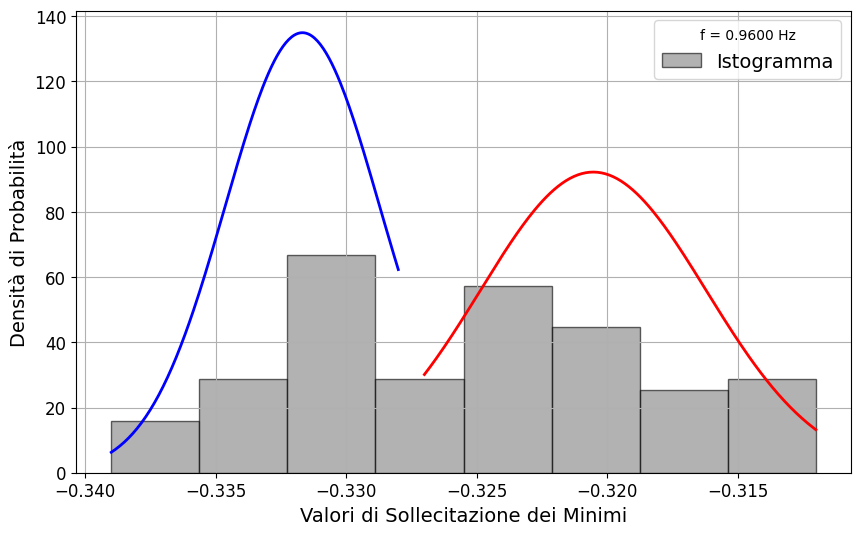

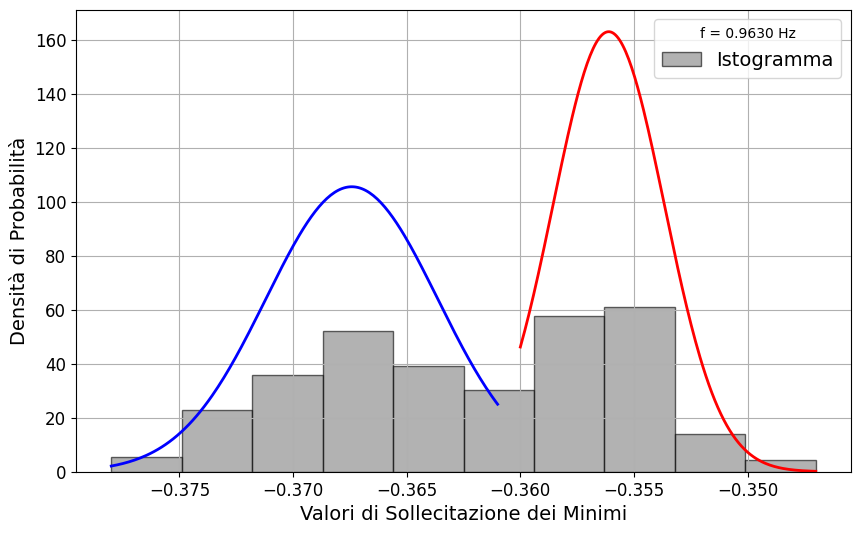

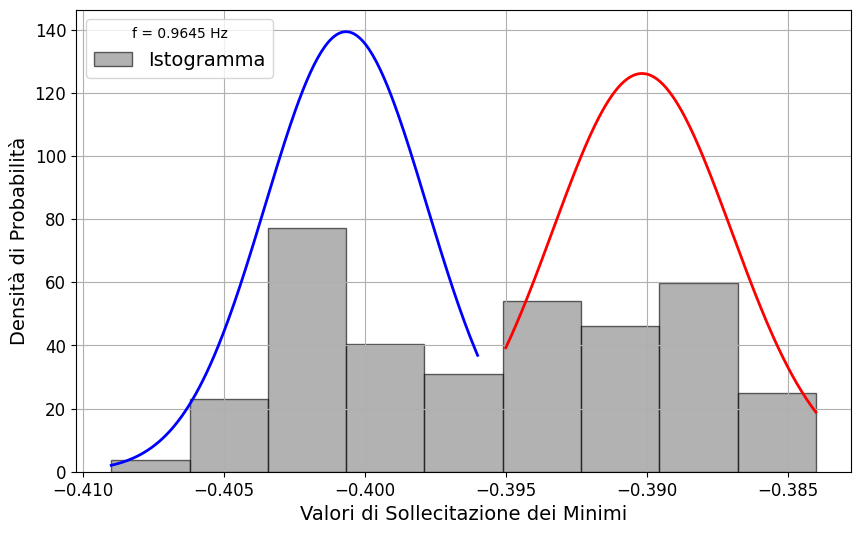

...

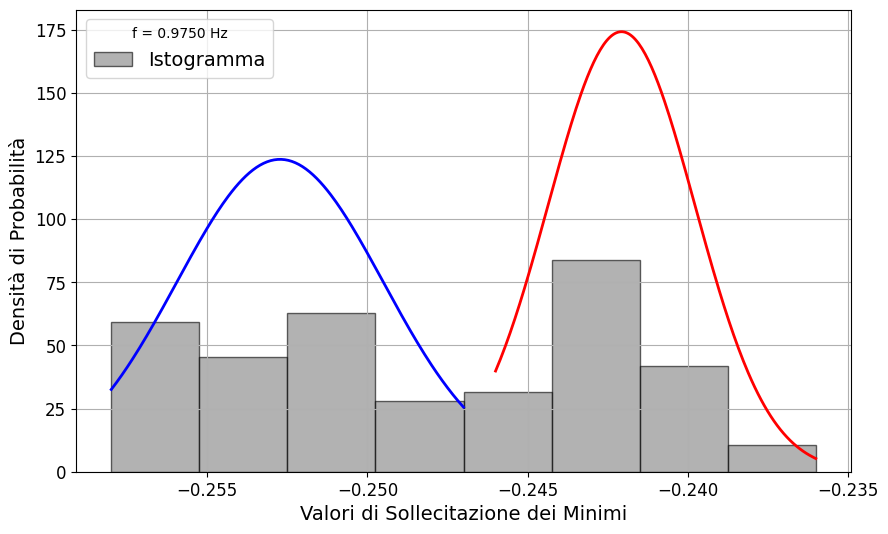

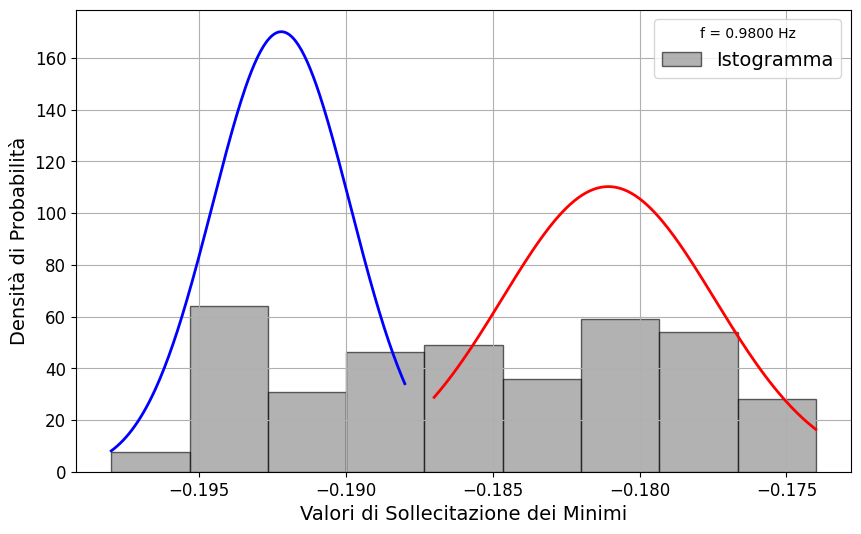

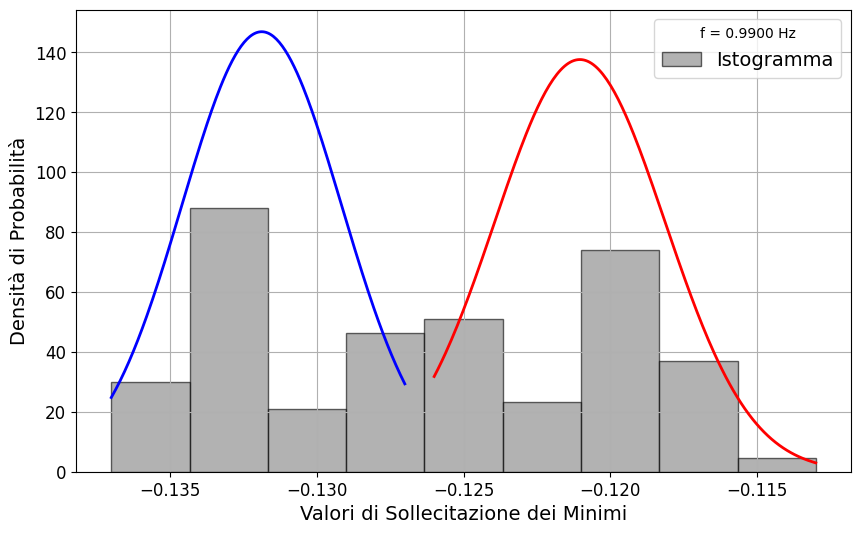

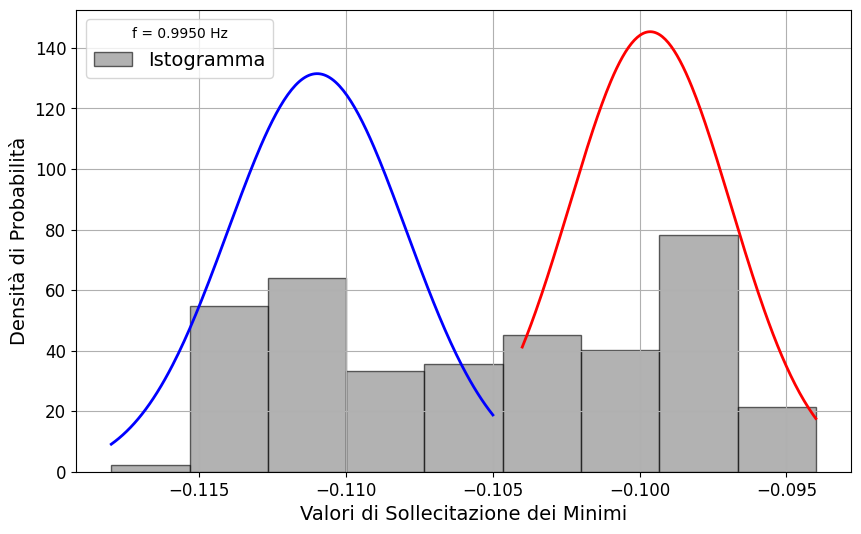

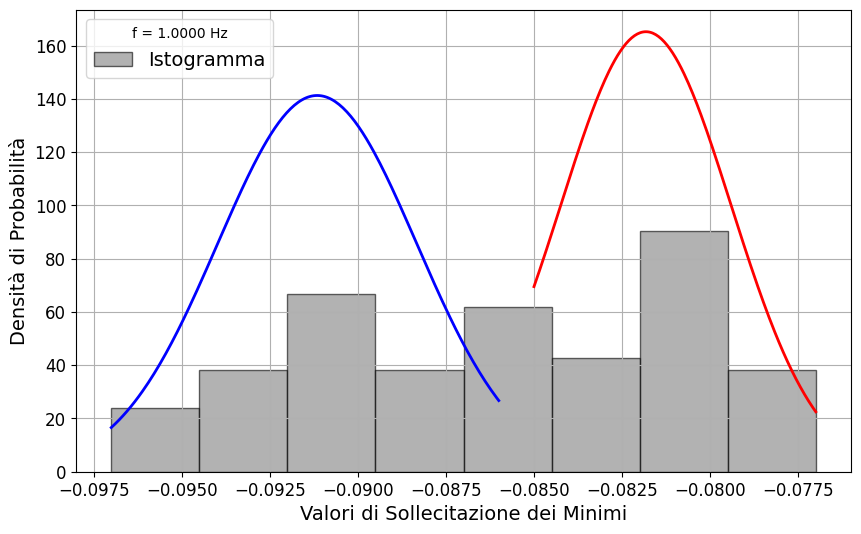


0.900.txt:
  μ_sx = -0.0493
  μ_dx = -0.0415
  μ_medio = -0.0454
  σ_media = 0.0026
  σ_campionaria corretta (x√10) = 0.0083
  σ_media (non corretta) = 0.0003
  σ_media (corretta x10) = 0.0031
  σ_uniforme = 0.0061

0.905.txt:
  μ_sx = -0.0496
  μ_dx = -0.0404
  μ_medio = -0.0450
  σ_media = 0.0026
  σ_campionaria corretta (x√10) = 0.0081
  σ_media (non corretta) = 0.0002
  σ_media (corretta x10) = 0.0019
  σ_uniforme = 0.0055

0.910.txt:
  μ_sx = -0.0621
  μ_dx = -0.0534
  μ_medio = -0.0577
  σ_media = 0.0025
  σ_campionaria corretta (x√10) = 0.0080
  σ_media (non corretta) = 0.0002
  σ_media (corretta x10) = 0.0019
  σ_uniforme = 0.0075

0.950.txt:
  μ_sx = -0.1726
  μ_dx = -0.1615
  μ_medio = -0.1670
  σ_media = 0.0040
  σ_campionaria corretta (x√10) = 0.0127
  σ_media (non corretta) = 0.0004
  σ_media (corretta x10) = 0.0039
  σ_uniforme = 0.0095

0.955.txt:
  μ_sx = -0.2518
  μ_dx = -0.2407
  μ_medio = -0.2462
  σ_media = 0.0037
  σ_campionaria corretta (x√10) = 0.0117
  σ_media 

In [6]:
from scipy.stats import norm
from scipy.signal import find_peaks
import numpy as np
import matplotlib.pyplot as plt

risultati_fit_minimi = {}

for nome_file in file_ordinati:
    minimi_y = risultati_finali[nome_file]['stazionario']['minimi']['sollecitazione']

    if len(minimi_y) < 10:
        print(f"{nome_file}: Dati insufficienti.")
        continue

    # Primo tentativo con bins='auto'
    hist_vals, bin_edges = np.histogram(minimi_y, bins='auto')
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    peaks, _ = find_peaks(hist_vals, distance=1, prominence=1)

    # Se solo un picco e file è 0.950 o 0.960, riprova con più bin
    if len(peaks) < 2 and nome_file in ['0.950.txt', '0.960.txt']:
        print(f"{nome_file}: Solo un picco trovato, provo con più bin...")
        hist_vals, bin_edges = np.histogram(minimi_y, bins=30)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        peaks, _ = find_peaks(hist_vals, distance=1, prominence=1)

    if len(peaks) < 2:
        print(f"{nome_file}: Picchi insufficienti anche dopo il tentativo.")
        continue

    peak_indices = peaks[np.argsort(hist_vals[peaks])[-2:]]
    peak_positions = bin_centers[peak_indices]
    peak_positions.sort()
    midpoint = np.mean(peak_positions)

    left_group = minimi_y[minimi_y <= midpoint]
    right_group = minimi_y[minimi_y > midpoint]

    mu_sx, std_sx = np.mean(left_group), np.std(left_group, ddof=1)
    mu_dx, std_dx = np.mean(right_group), np.std(right_group, ddof=1)
    mu_medio = (mu_sx + mu_dx) / 2

    std_media = (std_sx + std_dx) / 2
    std_corretto = std_media * np.sqrt(10)
    std_media_noncorretta = std_media / np.sqrt(len(minimi_y))
    std_media_corretto = std_media_noncorretta * 10

    a, b = np.min(minimi_y), np.max(minimi_y)
    std_uniforme = (b - a) / np.sqrt(12)

    risultati_fit_minimi[nome_file] = {
        'mu_sx': mu_sx, 'mu_dx': mu_dx,
        'mu_medio': mu_medio,
        'std_media': std_media,
        'std_corretto': std_corretto,
        'std_media_noncorretta': std_media_noncorretta,
        'std_media_corretto': std_media_corretto,
        'std_uniforme': std_uniforme
    }

    # Plot
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.hist(minimi_y, bins='auto', density=True, alpha=0.6, color='gray', edgecolor='black', label='Istogramma')

    x_sx = np.linspace(min(left_group), max(left_group), 200)
    y_sx = norm.pdf(x_sx, mu_sx, std_sx)
    ax.plot(x_sx, y_sx, color='blue', lw=2)

    x_dx = np.linspace(min(right_group), max(right_group), 200)
    y_dx = norm.pdf(x_dx, mu_dx, std_dx)
    ax.plot(x_dx, y_dx, color='red', lw=2)

    ax.set_xlabel("Valori di Sollecitazione dei Minimi")
    ax.set_ylabel("Densità di Probabilità")
    ax.grid(True)
    ax.legend(title=f"f = {frequenza_f[nome_file]:.4f} Hz")
    plt.show()

# Report finale
for nome_file, stats in risultati_fit_minimi.items():
    print(f"\n{nome_file}:")
    print(f"  μ_sx = {stats['mu_sx']:.4f}")
    print(f"  μ_dx = {stats['mu_dx']:.4f}")
    print(f"  μ_medio = {stats['mu_medio']:.4f}")
    print(f"  σ_media = {stats['std_media']:.4f}")
    print(f"  σ_campionaria corretta (x√10) = {stats['std_corretto']:.4f}")
    print(f"  σ_media (non corretta) = {stats['std_media_noncorretta']:.4f}")
    print(f"  σ_media (corretta x10) = {stats['std_media_corretto']:.4f}")
    print(f"  σ_uniforme = {stats['std_uniforme']:.4f}")


=== INIZIO FIT LINEARE SULLA STABILITÀ DEL SEGNALE ===
Salvato pdf_plots/0_fit.pdf
Salvato pdf_plots/0_fit.pdf
Salvato pdf_plots/0_fit.pdf


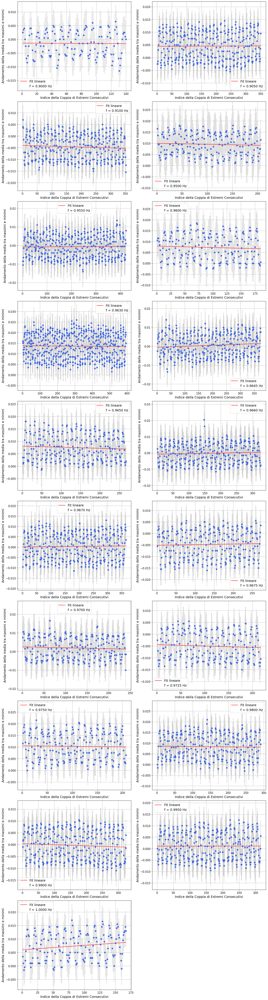


=== Report Finale dei Risultati del Fit ===


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import chi2
import os
import re

def linear_model(x, a, b):
    return a * x + b

risultati_fit = {}

num_files = len(file_ordinati)
rows = int(np.ceil(num_files / 2))
cols = 2 if num_files > 1 else 1
fig, axes = plt.subplots(rows, cols, figsize=(16, 6 * rows), constrained_layout=True)
if num_files == 1:
    axes = np.array([axes])
axes = axes.flatten()

# Crea una cartella per salvare i PDF se non esiste
if not os.path.exists('pdf_plots'):
    os.makedirs('pdf_plots')

print("=== INIZIO FIT LINEARE SULLA STABILITÀ DEL SEGNALE ===")

for idx, nome_file in enumerate(file_ordinati):
    ax = axes[idx]

    # Estrai la frequenza dal nome del file usando espressione regolare
    freq_match = re.search(r'(\d+\.\d{3,4})', nome_file)
    freq = float(freq_match.group(1)) if freq_match else None

    # Verifica se la frequenza è tra quelle da salvare
    save_pdf = freq in [0.965, 0.966, 0.9645, 0.964] if freq is not None else False

    massimi_tempo = risultati_finali[nome_file]['stazionario']['massimi']['tempo']
    massimi_soll = risultati_finali[nome_file]['stazionario']['massimi']['sollecitazione']
    minimi_tempo = risultati_finali[nome_file]['stazionario']['minimi']['tempo']
    minimi_soll = risultati_finali[nome_file]['stazionario']['minimi']['sollecitazione']

    if len(massimi_tempo) < 2 or len(minimi_tempo) < 2:
        print("Dati di massimi/minimi insufficienti per il fit.")
        continue

    tempi_estremi = np.concatenate((massimi_tempo, minimi_tempo))
    soll_estremi = np.concatenate((massimi_soll, minimi_soll))
    sorted_indices = np.argsort(tempi_estremi)
    soll_ordinate = soll_estremi[sorted_indices]

    punti_medi_y = (soll_ordinate[:-1] + soll_ordinate[1:]) / 2
    punti_medi_x = np.arange(1, len(punti_medi_y) + 1)

    if nome_file not in risultati_fit_massimi or nome_file not in risultati_fit_minimi:
        print(f"{nome_file}: risultati_fit_massimi o risultati_fit_minimi mancanti.")
        continue

    sigma_max_corretto = risultati_fit_massimi[nome_file]['std_corretto']
    sigma_min_corretto = risultati_fit_minimi[nome_file]['std_corretto']

    incertezza_y = 0.5 * np.sqrt(sigma_max_corretto**2 + sigma_min_corretto**2)
    errori_y = np.full_like(punti_medi_y, fill_value=incertezza_y)

    try:
        popt, pcov = curve_fit(linear_model, punti_medi_x, punti_medi_y, sigma=errori_y, absolute_sigma=True)
        a, b = popt
        y_pred = linear_model(punti_medi_x, a, b)

        # Crea il plot
        ax.errorbar(punti_medi_x, punti_medi_y, yerr=errori_y, fmt='o', color='royalblue',
                   ecolor='lightgray', capsize=3)
        ax.plot(punti_medi_x, y_pred, 'r-', label='Fit lineare')

        # Aggiungi la frequenza esatta alla legenda
        if freq is not None:
            ax.plot([], [], ' ', label=f'f = {freq:.4f} Hz')

        ax.set_xlabel('Indice della Coppia di Estremi Consecutivi')
        ax.set_ylabel('Andamento della media tra massimi e minimi')
        ax.legend()
        ax.grid(True)  # Rimossa la griglia

        # Salva il plot in PDF solo se è una delle frequenze specificate
        if save_pdf:
            pdf_name = f"pdf_plots/{nome_file.split('.')[0]}_fit.pdf"
            plt.figure(fig.number)
            plt.savefig(pdf_name, format='pdf', bbox_inches='tight')
            print(f"Salvato {pdf_name}")

    except Exception as e:
        print(f"Errore durante il fit per {nome_file}: {e}")

for i in range(num_files, len(axes)):
    axes[i].set_visible(False)

plt.show()

print("\n" + "="*40)
print("=== Report Finale dei Risultati del Fit ===")
print("="*40)
for nome_file, res in risultati_fit.items():
    significativita = abs(res['pendenza']) / res['err_pendenza'] if res['err_pendenza'] > 0 else float('inf')
    print(f"\n{nome_file}:")
    print(f" Pendenza (a) : {res['pendenza']:.3e} ± {res['err_pendenza']:.2e}")
    print(f" Intercetta (b) : {res['intercetta']:.3f} ± {res['err_intercetta']:.3f}")
    print(f" Chi-quadro ridotto: {res['chi2_ridotto']:.2f} (p-value: {res['p_value']:.3f})")
    print(f" Significatività pendenza: {significativita:.1f} σ")

BREIT-WIGNER

=== INIZIO FIT DI BREIT-WIGNER (con traslazione) ===

--- Risultati Fit Breit-Wigner ---
  A (Ampiezza) = 2.213e-03 ± 5.30e-05
  B (ω_0)      = 6.0668 ± 0.0004 rad/s
  C (γ)        = 0.0795 ± 0.0009 rad/s
  D (Offset)   = 0.0403 ± 0.0015
-----------------------------------
  Frequenza di Risonanza f_0 = ω_0 / (2π) = 0.9656 Hz
  Fattore di Qualità Q = ω_0 / γ = 76.36

--- Ampiezza di Risonanza Breit-Wigner ---
  Ampiezza a ω_0 = 0.3909 ± 0.0116 rad

--- Chi-Quadro Breit-Wigner ---
  χ² = 107.14, χ²/ndof = 7.14, p-value = 0.0000


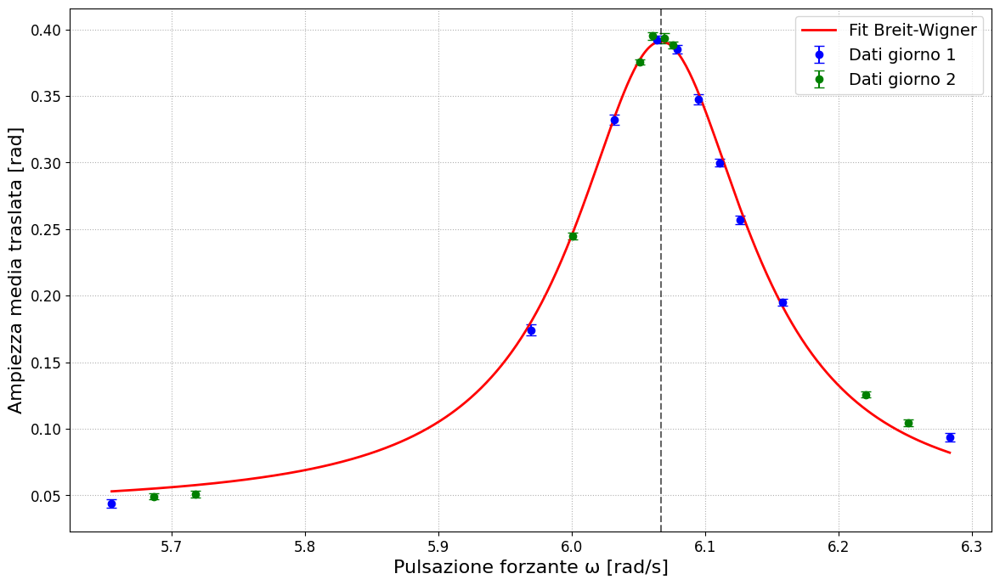


=== INIZIO FIT PARABOLICO INTORNO AL PICCO ===

--- Risultati Fit Parabolico ---
  Pulsazione al vertice ω_max = 6.0668 rad/s
  Frequenza al vertice f_max = 0.9656 Hz
  a (curvatura) = -7.4013e+01 ± 1.3e+01
  b (pendenza)  = 8.9804e+02 ± 1.6e+02
  c (intercetta)= -2.7237e+03 ± 4.7e+02

--- Ampiezza di Risonanza Parabolica ---
  Ampiezza a ω_max = 0.3950 ± 474.8499 rad

--- Chi-Quadro Parabolico ---
  χ² = 2.08, χ²/ndof = 0.69, p-value = 0.5557


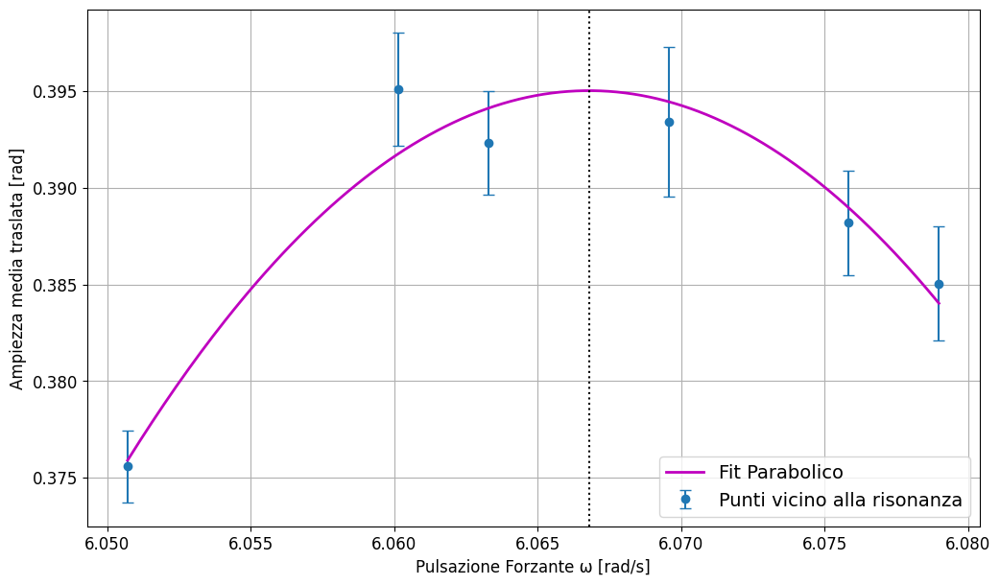

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import chi2

# === DEFINIZIONE FUNZIONI ===
def breit_wigner(omega, A, B, C, D):
    return A / ((omega - B)**2 + C**2) + D

def parabola(x, a, b, c):
    return a * x**2 + b * x + c

def chi_squared_test(y_obs, y_exp, sigma, dof):
    chi2_val = np.sum(((y_obs - y_exp) / sigma) ** 2)
    chi2_red = chi2_val / dof
    p_val = 1 - chi2.cdf(chi2_val, dof)
    return chi2_val, chi2_red, p_val

# === PREPARAZIONE DATI CON TRASLAZIONE E PROPAGAZIONE ===
frequenze_hz = []
valori_medi_traslati = []
incertezze_propagate = []
colori_punti = []

freq_speciali = [
    '0.905.txt', '0.910.txt', '0.955.txt', '0.963.txt',
    '0.966.txt', '0.967.txt', '0.990.txt', '0.995.txt', '0.9645.txt'
]

for nome_file in file_ordinati:
    if nome_file not in risultati_fit_massimi or nome_file not in risultati_fit_stabilita:
        continue

    f = frequenza_f[nome_file]
    mu_massimo = (risultati_fit_massimi[nome_file]['mu_sx'] + risultati_fit_massimi[nome_file]['mu_dx']) / 2
    sigma_massimo = risultati_fit_massimi[nome_file]['std_media_corretto']
    intercetta = risultati_fit_stabilita[nome_file]['intercetta_b']
    sigma_intercetta = risultati_fit_stabilita[nome_file]['err_intercetta_b']

    y_traslato = mu_massimo - intercetta
    sigma_totale = np.sqrt(sigma_massimo**2 + sigma_intercetta**2)

    frequenze_hz.append(f)
    valori_medi_traslati.append(y_traslato)
    incertezze_propagate.append(sigma_totale)
    colori_punti.append('green' if nome_file in freq_speciali else 'blue')

frequenze_hz = np.array(frequenze_hz)
valori_medi_traslati = np.array(valori_medi_traslati)
incertezze_propagate = np.array(incertezze_propagate)
colori_punti = np.array(colori_punti)
omega_forzante = 2 * np.pi * frequenze_hz

# === FIT DI BREIT-WIGNER ===
print("=== INIZIO FIT DI BREIT-WIGNER (con traslazione) ===")
fit_bw_success = False

if len(omega_forzante) > 0:
    A0 = (np.max(valori_medi_traslati) - np.min(valori_medi_traslati))
    B0 = omega_forzante[np.argmax(valori_medi_traslati)]
    C0 = 4*((0.05)**2)
    D0 = np.min(valori_medi_traslati)
    p0 = [A0, B0, C0, D0]

    try:
        popt, pcov = curve_fit(breit_wigner, omega_forzante, valori_medi_traslati,
                               p0=p0, sigma=incertezze_propagate, absolute_sigma=True, maxfev=20000)
        A, B, C, D = popt
        err_popt = np.sqrt(np.diag(pcov))
        fit_bw_success = True

        # Calcolo ampiezza di risonanza BW
        ampiezza_bw = A / C**2 + D
        err_ampiezza_bw = np.sqrt((err_popt[0]/C**2)**2 + (2*A*err_popt[2]/C**3)**2 + err_popt[3]**2)

        print("\n--- Risultati Fit Breit-Wigner ---")
        print(f"  A (Ampiezza) = {A:.3e} ± {err_popt[0]:.2e}")
        print(f"  B (ω_0)      = {B:.4f} ± {err_popt[1]:.4f} rad/s")
        print(f"  C (γ)        = {C:.4f} ± {err_popt[2]:.4f} rad/s")
        print(f"  D (Offset)   = {D:.4f} ± {err_popt[3]:.4f}")
        print("-" * 35)
        print(f"  Frequenza di Risonanza f_0 = ω_0 / (2π) = {B/(2*np.pi):.4f} Hz")
        print(f"  Fattore di Qualità Q = ω_0 / γ = {abs(B/C):.2f}")
        print("\n--- Ampiezza di Risonanza Breit-Wigner ---")
        print(f"  Ampiezza a ω_0 = {ampiezza_bw:.4f} ± {err_ampiezza_bw:.4f} rad")

        # Chi-quadro
        y_fit_bw = breit_wigner(omega_forzante, *popt)
        dof_bw = len(omega_forzante) - len(popt)
        chi2_bw, chi2_red_bw, pval_bw = chi_squared_test(valori_medi_traslati, y_fit_bw, incertezze_propagate, dof_bw)
        print(f"\n--- Chi-Quadro Breit-Wigner ---")
        print(f"  χ² = {chi2_bw:.2f}, χ²/ndof = {chi2_red_bw:.2f}, p-value = {pval_bw:.4f}")

        # Grafico
        plt.figure(figsize=(14, 8))
        mask_blue = colori_punti == 'blue'
        plt.errorbar(omega_forzante[mask_blue], valori_medi_traslati[mask_blue], yerr=incertezze_propagate[mask_blue], fmt='bo', capsize=4, label='Dati giorno 1')
        mask_green = colori_punti == 'green'
        plt.errorbar(omega_forzante[mask_green], valori_medi_traslati[mask_green], yerr=incertezze_propagate[mask_green], fmt='go', capsize=4, label='Dati giorno 2')
        omega_fit_bw = np.linspace(omega_forzante.min(), omega_forzante.max(), 500)
        soll_fit_bw = breit_wigner(omega_fit_bw, *popt)
        plt.plot(omega_fit_bw, soll_fit_bw, 'r-', lw=2, label='Fit Breit-Wigner')
        plt.axvline(B, color='k', ls='--', alpha=0.6)
        plt.xlabel('Pulsazione forzante ω [rad/s]', fontsize=16)
        plt.ylabel('Ampiezza media traslata [rad]', fontsize=16)
        plt.legend()
        plt.grid(True, which='both', linestyle=':')
        plt.savefig("fit_breit_wigner_traslato.pdf", bbox_inches='tight')
        plt.show()

    except Exception as e:
        print(f"ERRORE durante il fit di Breit-Wigner: {e}")
else:
    print("Dati insufficienti per eseguire il fit di Breit-Wigner.")

# === FIT PARABOLICO INTORNO AL PICCO ===
print("\n=== INIZIO FIT PARABOLICO INTORNO AL PICCO ===")

if fit_bw_success:
    f_risonanza = B / (2 * np.pi)
    delta_f = 0.003
    mask_parabola = (frequenze_hz > f_risonanza - delta_f) & (frequenze_hz < f_risonanza + delta_f)

    if np.sum(mask_parabola) >= 3:
        try:
            popt_par, pcov_par = curve_fit(parabola, omega_forzante[mask_parabola], valori_medi_traslati[mask_parabola],
                                           sigma=incertezze_propagate[mask_parabola], absolute_sigma=True)
            a_p, b_p, c_p = popt_par
            err_par = np.sqrt(np.diag(pcov_par))

            omega_vertice = -b_p / (2 * a_p)
            ampiezza_par = c_p - (b_p**2)/(4*a_p)
            err_ampiezza_par = np.sqrt(
                err_par[2]**2 +
                (b_p/(2*a_p**2))**2 * err_par[1]**2 +
                (b_p**2/(4*a_p**3))**2 * err_par[0]**2
            )

            print("\n--- Risultati Fit Parabolico ---")
            print(f"  Pulsazione al vertice ω_max = {omega_vertice:.4f} rad/s")
            print(f"  Frequenza al vertice f_max = {omega_vertice/(2*np.pi):.4f} Hz")
            print(f"  a (curvatura) = {a_p:.4e} ± {err_par[0]:.1e}")
            print(f"  b (pendenza)  = {b_p:.4e} ± {err_par[1]:.1e}")
            print(f"  c (intercetta)= {c_p:.4e} ± {err_par[2]:.1e}")
            print("\n--- Ampiezza di Risonanza Parabolica ---")
            print(f"  Ampiezza a ω_max = {ampiezza_par:.4f} ± {err_ampiezza_par:.4f} rad")

            # Chi-quadro
            y_fit_par = parabola(omega_forzante[mask_parabola], *popt_par)
            dof_par = np.sum(mask_parabola) - len(popt_par)
            chi2_par, chi2_red_par, pval_par = chi_squared_test(valori_medi_traslati[mask_parabola], y_fit_par, incertezze_propagate[mask_parabola], dof_par)
            print(f"\n--- Chi-Quadro Parabolico ---")
            print(f"  χ² = {chi2_par:.2f}, χ²/ndof = {chi2_red_par:.2f}, p-value = {pval_par:.4f}")

            # Grafico
            plt.figure(figsize=(12, 7))
            plt.errorbar(omega_forzante[mask_parabola], valori_medi_traslati[mask_parabola],
                         yerr=incertezze_propagate[mask_parabola], fmt='o', capsize=4, label='Punti vicino alla risonanza')
            omega_fit_par = np.linspace(omega_forzante[mask_parabola].min(), omega_forzante[mask_parabola].max(), 200)
            soll_fit_par = parabola(omega_fit_par, a_p, b_p, c_p)
            plt.plot(omega_fit_par, soll_fit_par, 'm-', lw=2, label='Fit Parabolico')
            plt.axvline(omega_vertice, color='k', ls=':')
            plt.xlabel('Pulsazione Forzante ω [rad/s]', fontsize=12)
            plt.ylabel('Ampiezza media traslata [rad]', fontsize=12)
            plt.legend()
            plt.grid(True)
            plt.savefig("fit_parabolico_traslato.pdf", bbox_inches='tight')
            plt.show()

        except Exception as e:
            print(f"ERRORE durante il fit parabolico: {e}")
    else:
        print("Non ci sono abbastanza punti vicino al picco per eseguire un fit parabolico.")
else:
    print("Fit Breit-Wigner non riuscito: impossibile eseguire il fit parabolico.")

=== INIZIO ANALISI FIT ESPONENZIALE PER FASE DI DECREMENTO CON INCERTEZZE CORRETTE ===

--- Analisi fit esponenziale per: 0.900.txt ---
  Massimi: A = 123.8877, Gamma = 0.0535, Incertezza = 0.0081


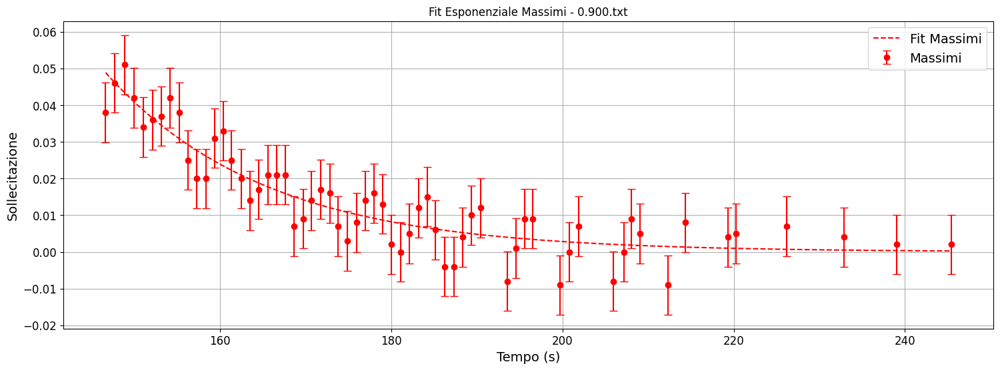

  Minimi: A = 0.7663, Gamma = 0.0190, Incertezza = 0.0083


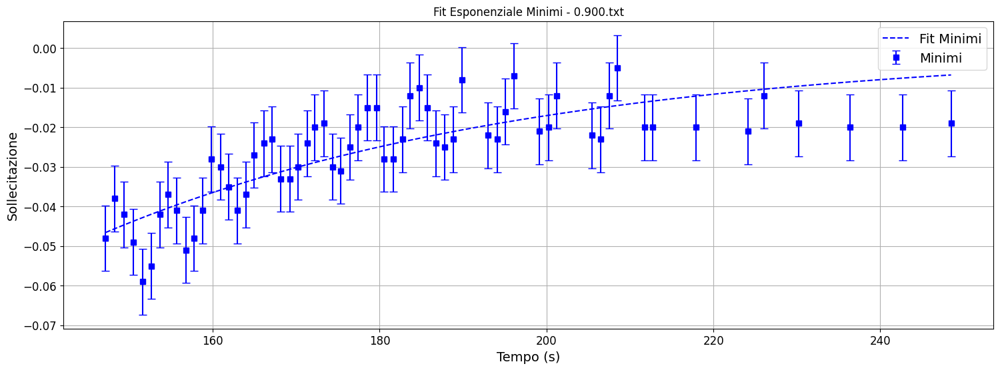


--- Analisi fit esponenziale per: 0.905.txt ---
  Massimi: A = 23.2055, Gamma = 0.0255, Incertezza = 0.0087


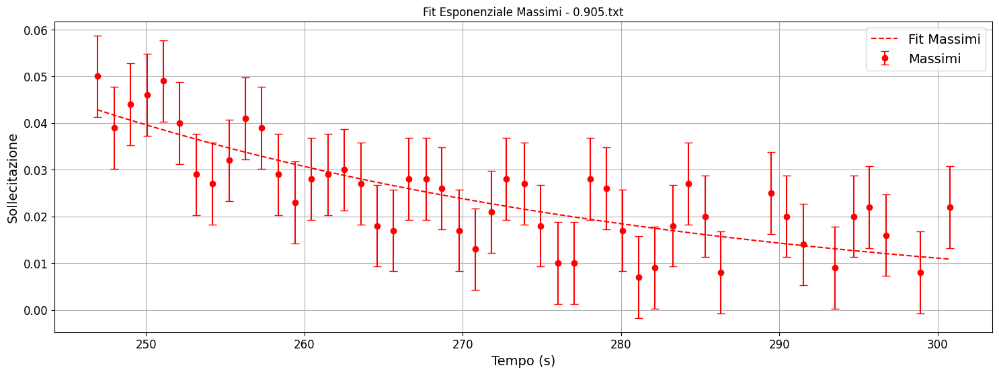

  Minimi: A = 2541.1018, Gamma = 0.0449, Incertezza = 0.0081


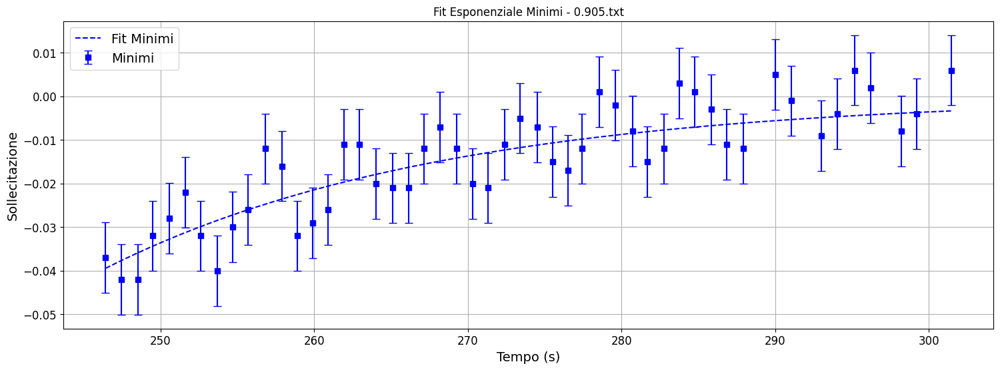


--- Analisi fit esponenziale per: 0.910.txt ---
  Massimi: A = 16896.5565, Gamma = 0.0528, Incertezza = 0.0094


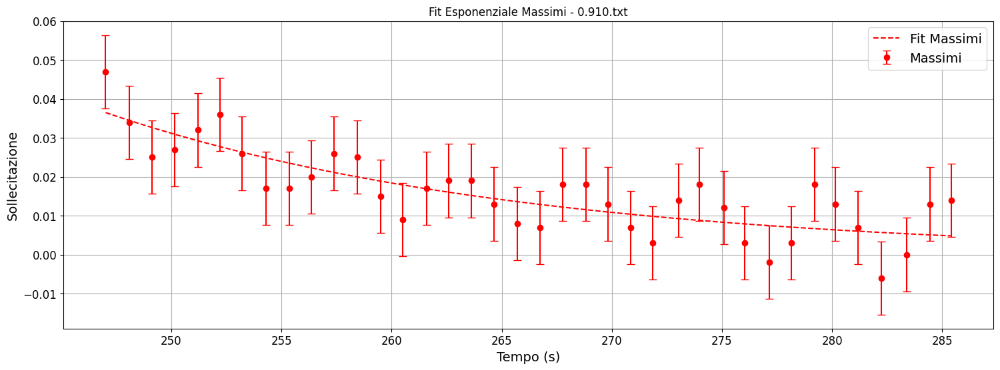

  Minimi: A = 53.7716, Gamma = 0.0288, Incertezza = 0.0080


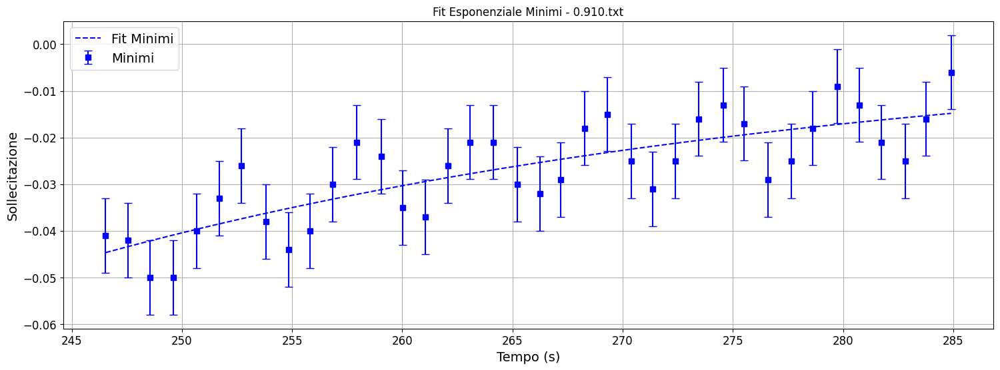


--- Analisi fit esponenziale per: 0.950.txt ---
  Massimi: A = 62.0058, Gamma = 0.0383, Incertezza = 0.0126


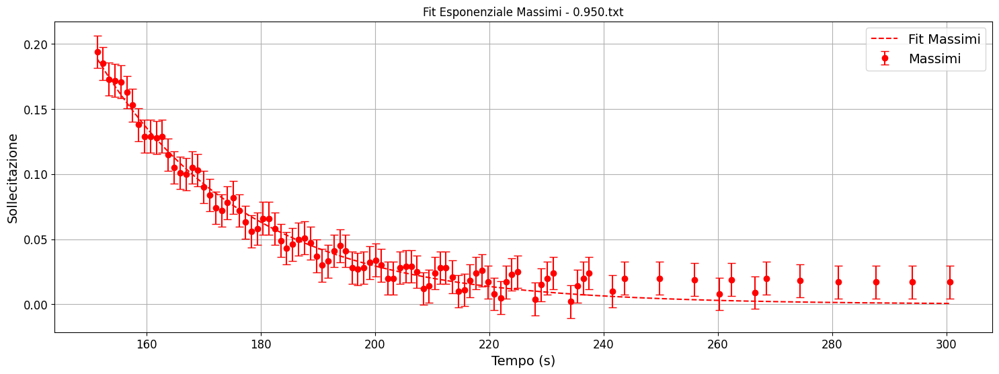

  Minimi: A = 252.3537, Gamma = 0.0478, Incertezza = 0.0127


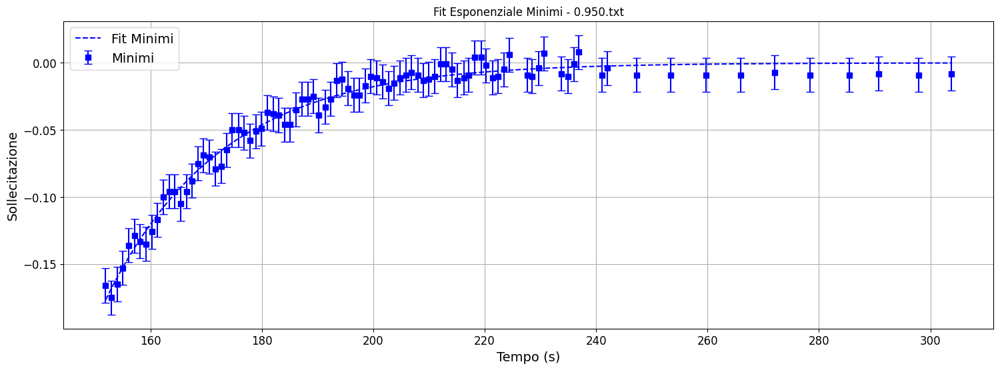


--- Analisi fit esponenziale per: 0.955.txt ---
  Massimi: A = 36399.3784, Gamma = 0.0444, Incertezza = 0.0111


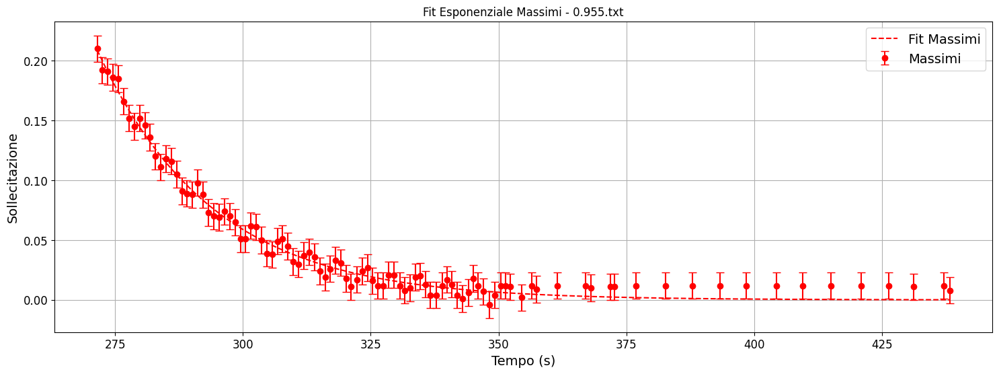

  Minimi: A = 22105.8178, Gamma = 0.0426, Incertezza = 0.0117


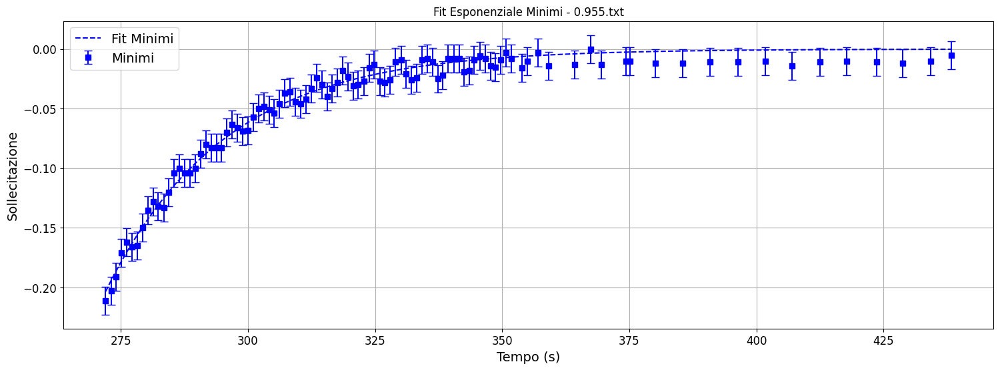


--- Analisi fit esponenziale per: 0.960.txt ---
  Massimi: A = 152.5313, Gamma = 0.0403, Incertezza = 0.0115


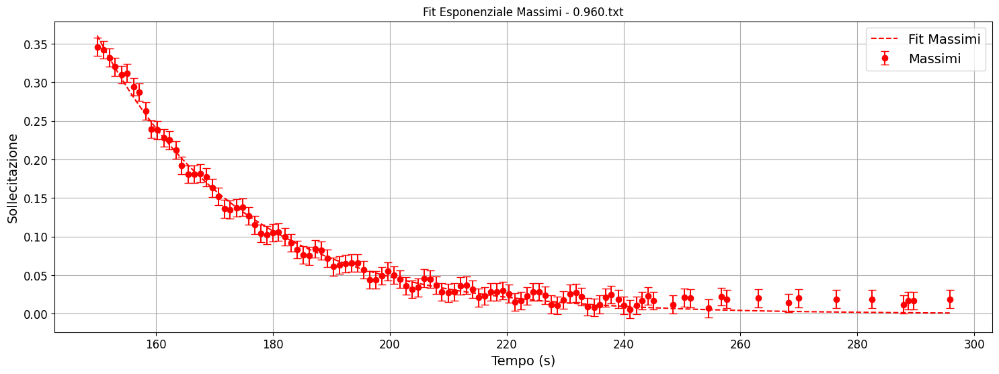

  Minimi: A = 340.0555, Gamma = 0.0459, Incertezza = 0.0115


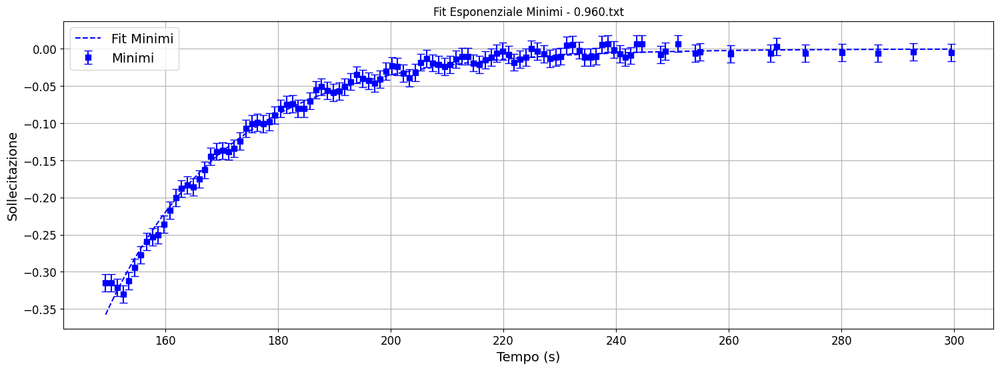


--- Analisi fit esponenziale per: 0.963.txt ---
  Massimi: A = 4983779.0561, Gamma = 0.0401, Incertezza = 0.0098


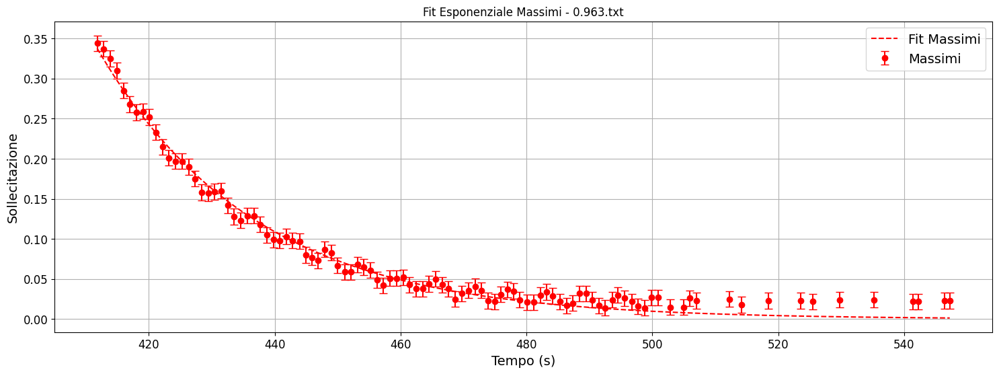

  Minimi: A = 374416093.2404, Gamma = 0.0506, Incertezza = 0.0098


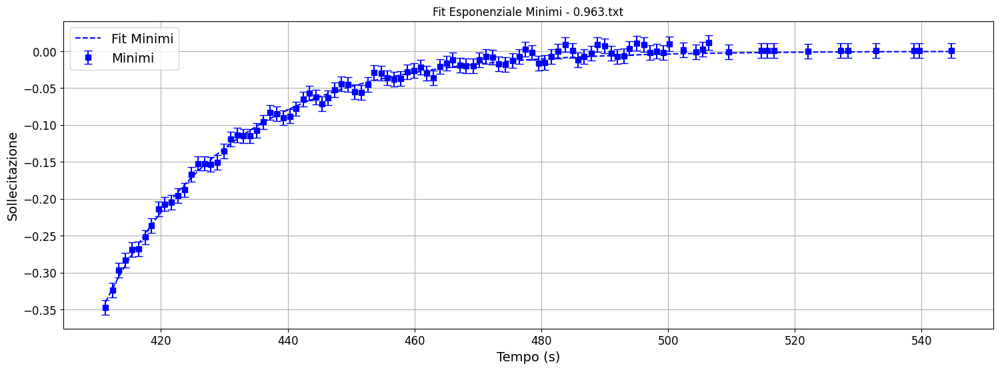


--- Analisi fit esponenziale per: 0.9645.txt ---
  Massimi: A = 109945.5654, Gamma = 0.0465, Incertezza = 0.0121


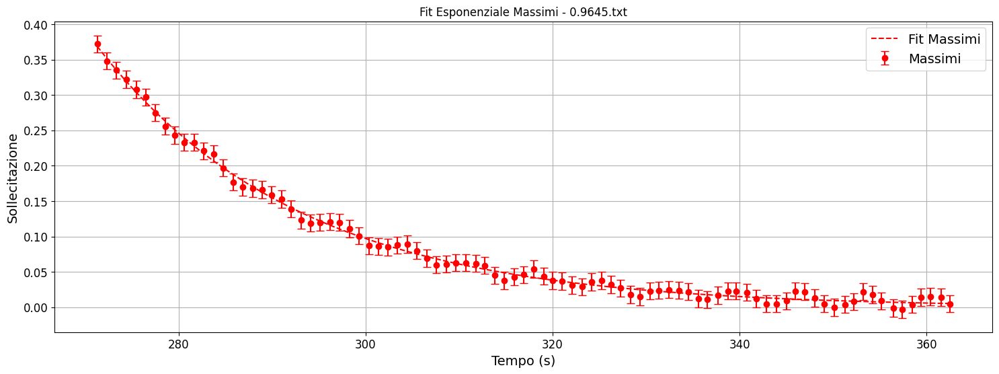

  Minimi: A = 46093.6714, Gamma = 0.0433, Incertezza = 0.0095


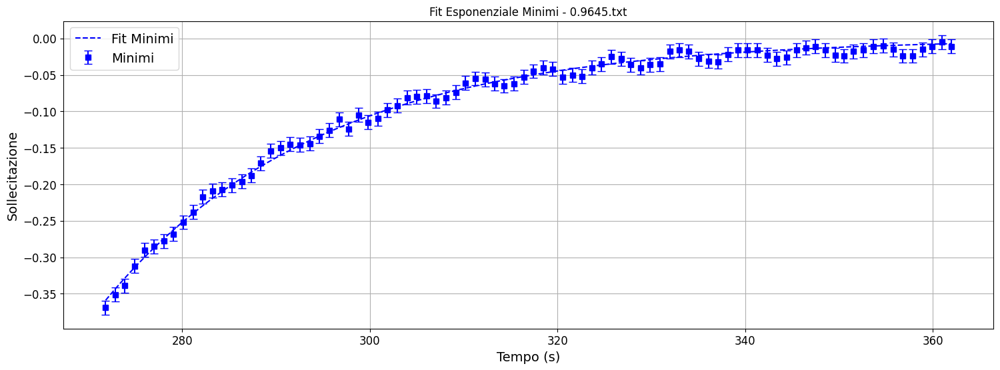


--- Analisi fit esponenziale per: 0.965.txt ---
  Massimi: A = 3023.6838, Gamma = 0.0417, Incertezza = 0.0093


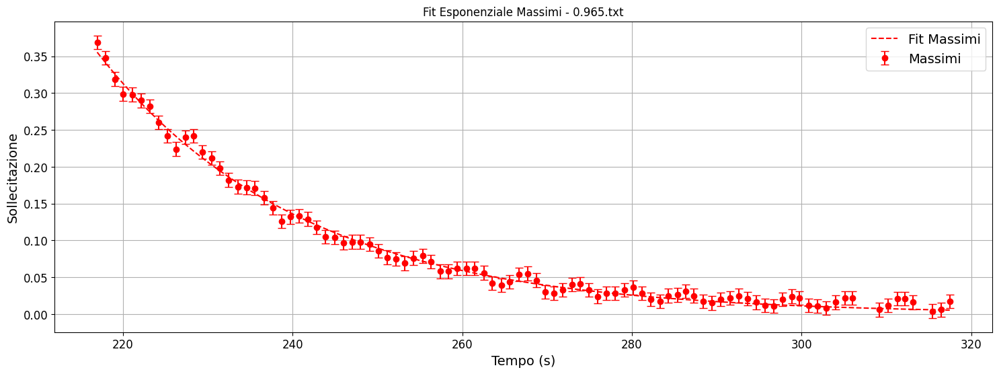

  Minimi: A = 9054.6826, Gamma = 0.0469, Incertezza = 0.0093


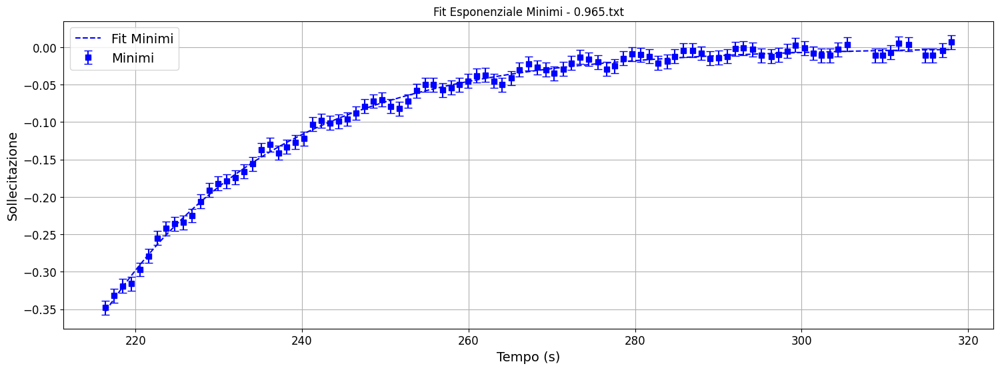


--- Analisi fit esponenziale per: 0.966.txt ---
  Massimi: A = 29778.1265, Gamma = 0.0460, Incertezza = 0.0152


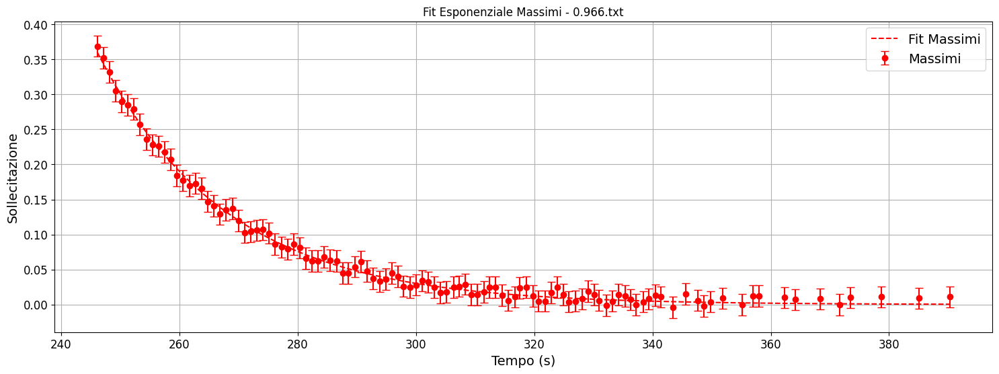

  Minimi: A = 18676.8017, Gamma = 0.0442, Incertezza = 0.0095


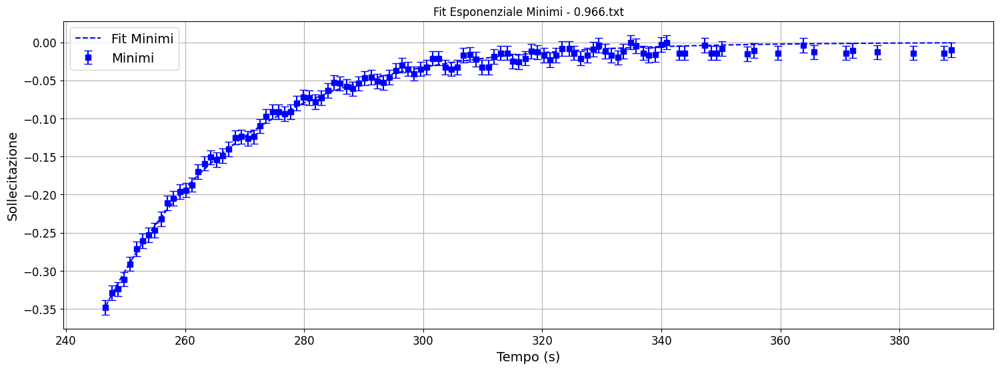


--- Analisi fit esponenziale per: 0.967.txt ---
  Massimi: A = 65289.9639, Gamma = 0.0455, Incertezza = 0.0112


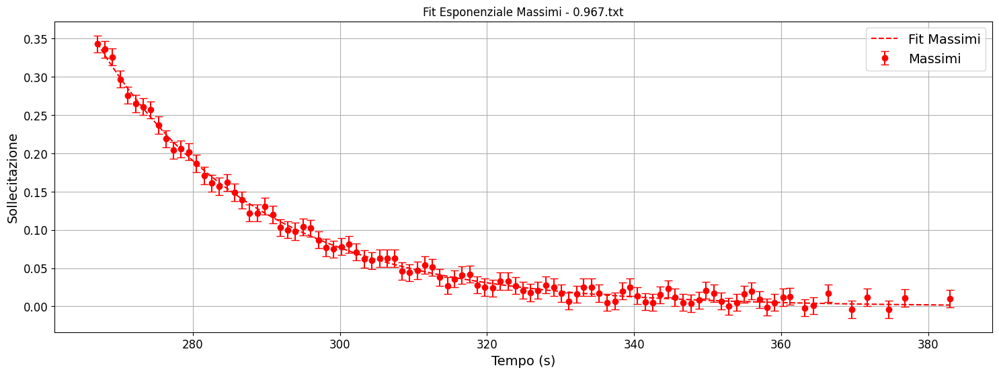

  Minimi: A = 52523.9723, Gamma = 0.0447, Incertezza = 0.0096


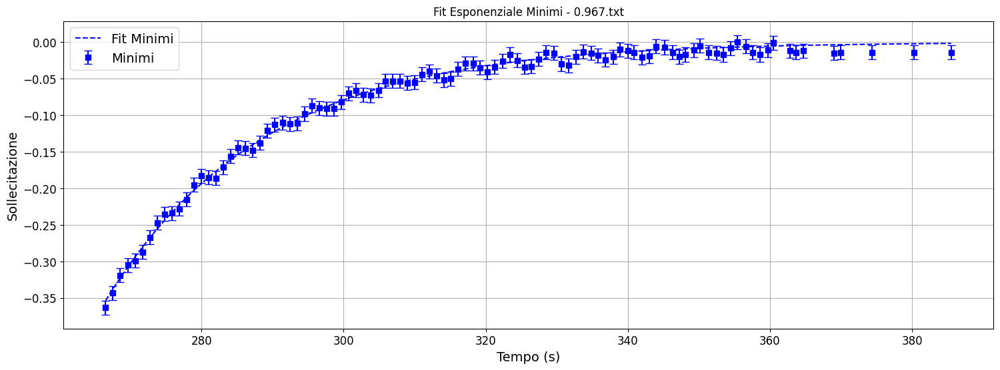


--- Analisi fit esponenziale per: 0.9675.txt ---
  Massimi: A = 9212.6435, Gamma = 0.0461, Incertezza = 0.0104


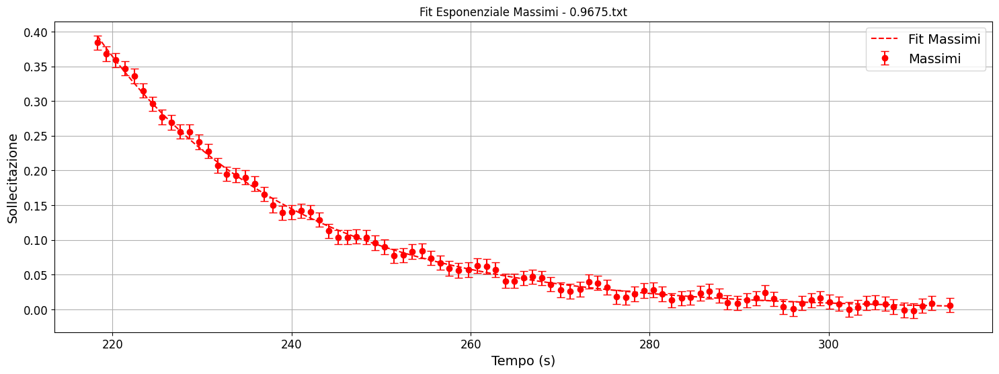

  Minimi: A = 5620.5076, Gamma = 0.0438, Incertezza = 0.0089


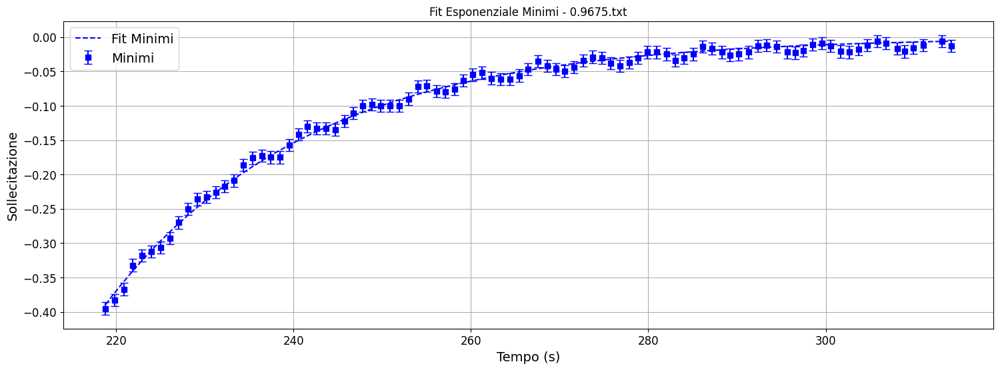


--- Analisi fit esponenziale per: 0.970.txt ---
  Massimi: A = 1203.7650, Gamma = 0.0445, Incertezza = 0.0129


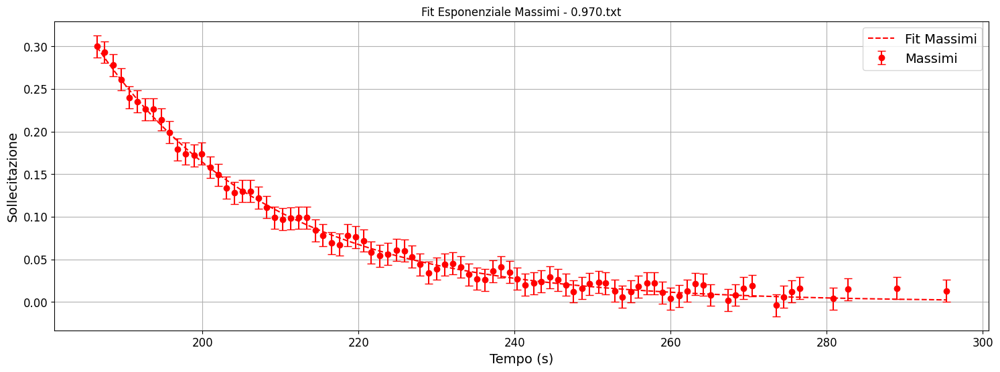

  Minimi: A = 1106.4338, Gamma = 0.0441, Incertezza = 0.0112


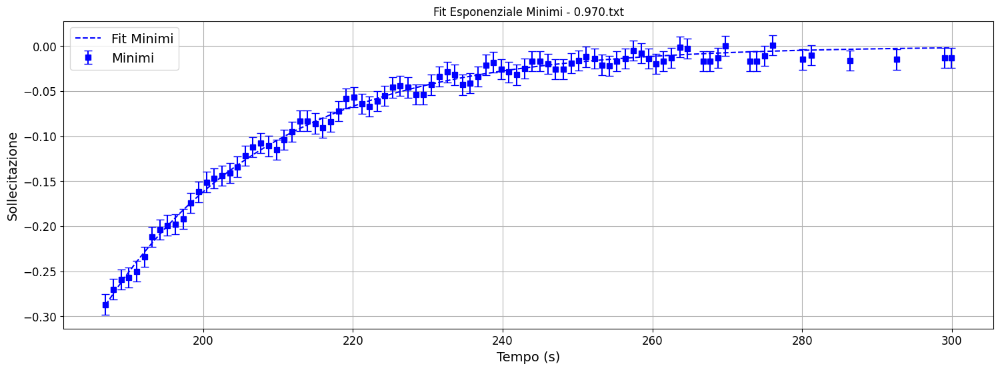


--- Analisi fit esponenziale per: 0.9725.txt ---
  Massimi: A = 1826.9511, Gamma = 0.0459, Incertezza = 0.0094


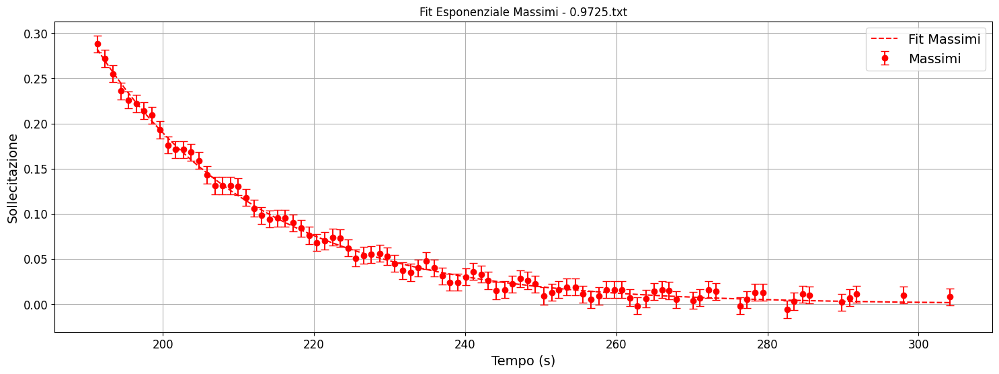

  Minimi: A = 788.1632, Gamma = 0.0414, Incertezza = 0.0100


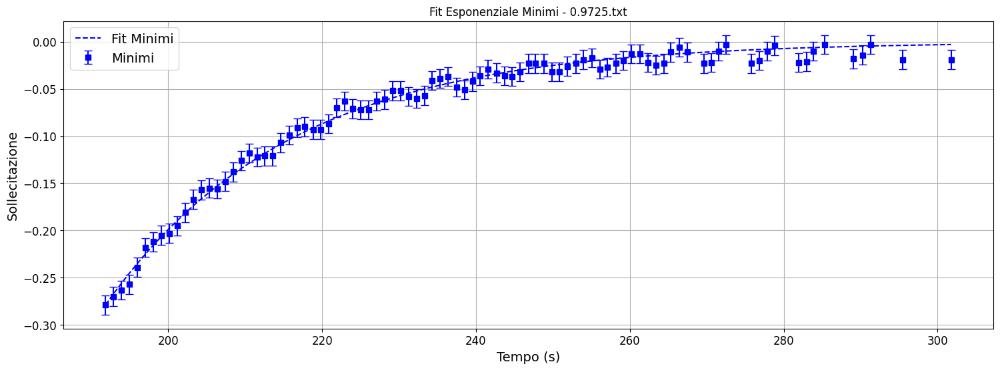


--- Analisi fit esponenziale per: 0.975.txt ---
  Massimi: A = 323.1385, Gamma = 0.0391, Incertezza = 0.0100


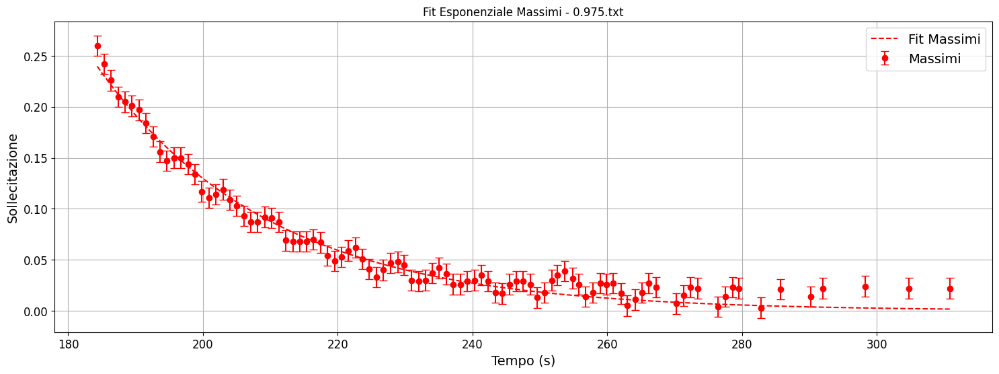

  Minimi: A = 1374.7041, Gamma = 0.0471, Incertezza = 0.0087


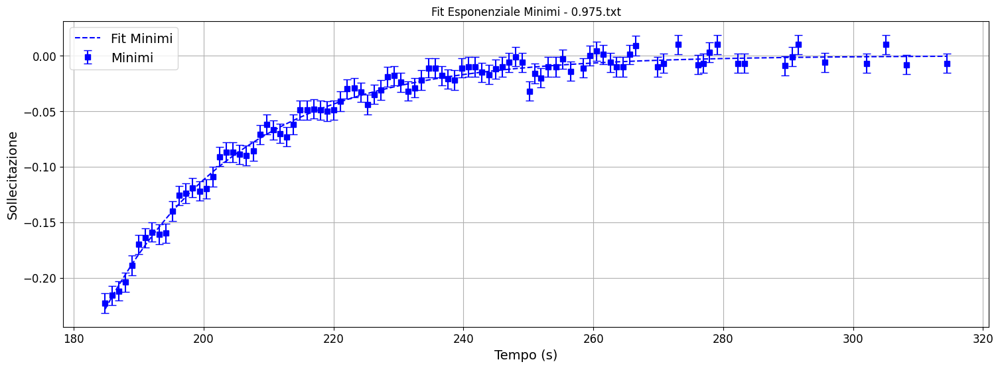


--- Analisi fit esponenziale per: 0.980.txt ---
  Massimi: A = 1340.0202, Gamma = 0.0395, Incertezza = 0.0102


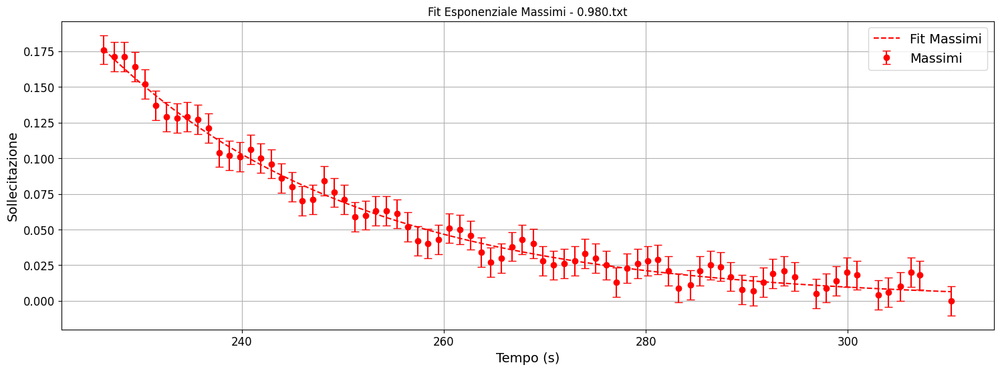

  Minimi: A = 6996.4687, Gamma = 0.0470, Incertezza = 0.0094


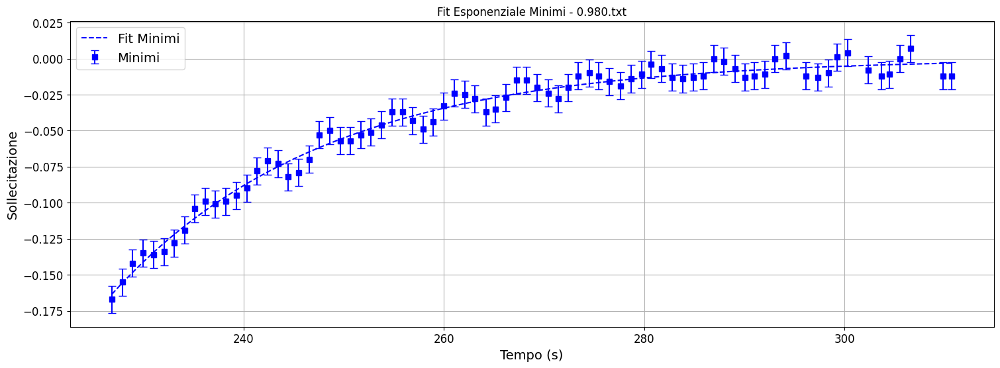


--- Analisi fit esponenziale per: 0.990.txt ---
  Massimi: A = 6044.2334, Gamma = 0.0445, Incertezza = 0.0092


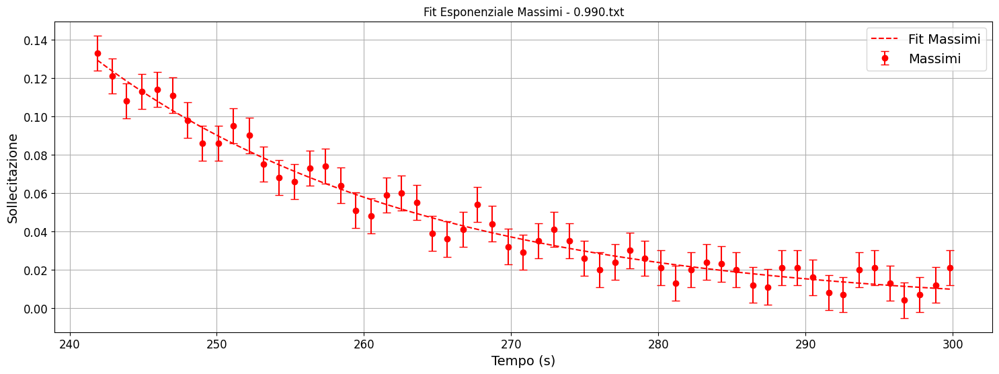

  Minimi: A = 2855.6348, Gamma = 0.0414, Incertezza = 0.0089


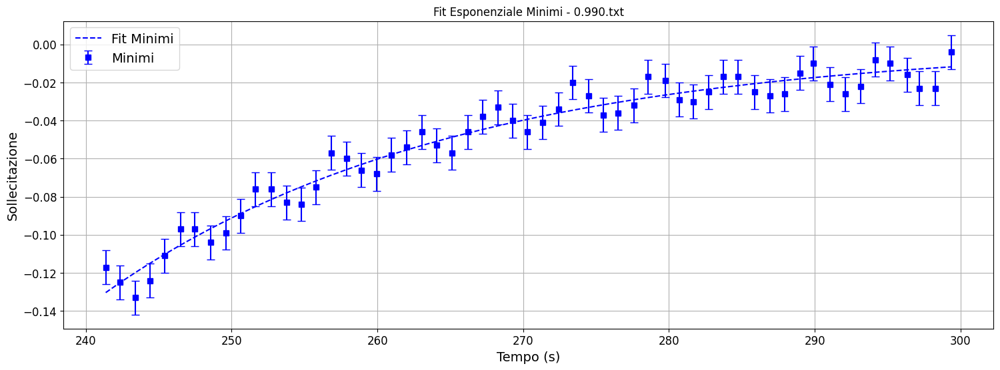


--- Analisi fit esponenziale per: 0.995.txt ---
  Massimi: A = 7609.7753, Gamma = 0.0469, Incertezza = 0.0098


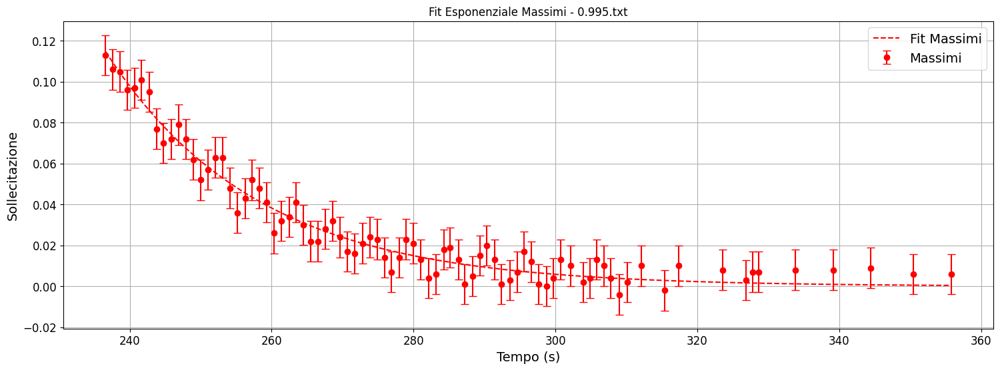

  Minimi: A = 359.6853, Gamma = 0.0343, Incertezza = 0.0091


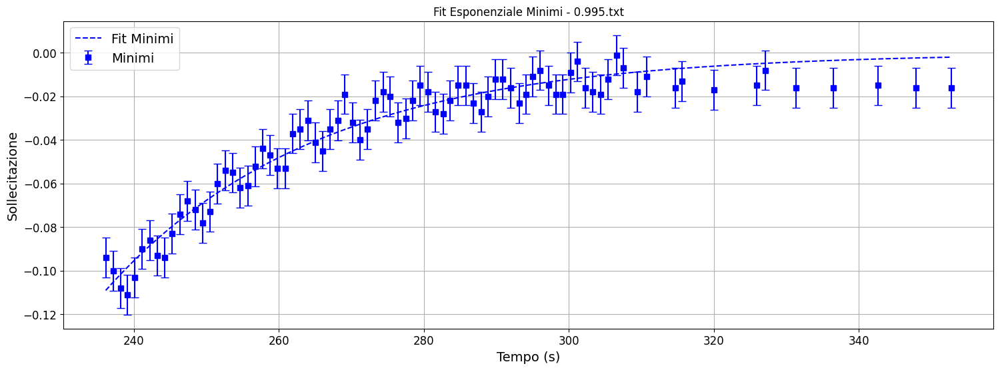


--- Analisi fit esponenziale per: 1.000.txt ---
  Massimi: A = 35.1095, Gamma = 0.0379, Incertezza = 0.0081


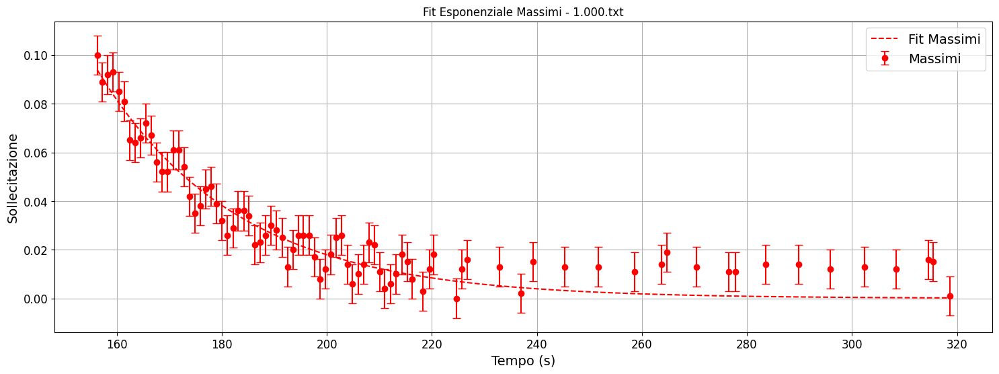

  Minimi: A = 89.5712, Gamma = 0.0442, Incertezza = 0.0083


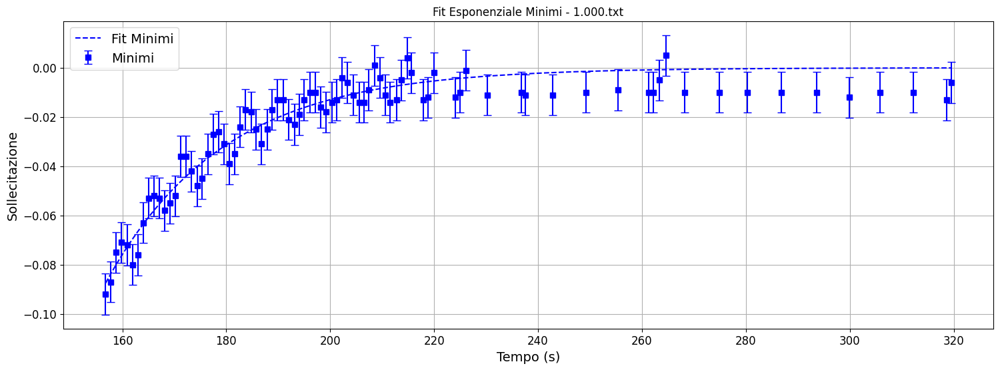


=== REPORT FINALE FIT ESPONENZIALE ===

--- Parametri Fit Massimi ---
0.900.txt: A = 123.8877, Gamma = 0.0535, Incertezza = 0.0081
0.905.txt: A = 23.2055, Gamma = 0.0255, Incertezza = 0.0087
0.910.txt: A = 16896.5565, Gamma = 0.0528, Incertezza = 0.0094
0.950.txt: A = 62.0058, Gamma = 0.0383, Incertezza = 0.0126
0.955.txt: A = 36399.3784, Gamma = 0.0444, Incertezza = 0.0111
0.960.txt: A = 152.5313, Gamma = 0.0403, Incertezza = 0.0115
0.963.txt: A = 4983779.0561, Gamma = 0.0401, Incertezza = 0.0098
0.9645.txt: A = 109945.5654, Gamma = 0.0465, Incertezza = 0.0121
0.965.txt: A = 3023.6838, Gamma = 0.0417, Incertezza = 0.0093
0.966.txt: A = 29778.1265, Gamma = 0.0460, Incertezza = 0.0152
0.967.txt: A = 65289.9639, Gamma = 0.0455, Incertezza = 0.0112
0.9675.txt: A = 9212.6435, Gamma = 0.0461, Incertezza = 0.0104
0.970.txt: A = 1203.7650, Gamma = 0.0445, Incertezza = 0.0129
0.9725.txt: A = 1826.9511, Gamma = 0.0459, Incertezza = 0.0094
0.975.txt: A = 323.1385, Gamma = 0.0391, Incertezza = 0

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def exponential_decay(t, A, gamma):
    return A * np.exp(-gamma * t)

fit_params_massimi = {}
fit_params_minimi = {}

print("=== INIZIO ANALISI FIT ESPONENZIALE PER FASE DI DECREMENTO CON INCERTEZZE CORRETTE ===")

plt.rcParams['figure.figsize'] = [18, 6]

for file_path in file_ordinati:
    print(f"\n--- Analisi fit esponenziale per: {file_path} ---")

    try:
        massimi_tempo = risultati_finali[file_path]['decremento']['massimi']['tempo']
        massimi_soll = risultati_finali[file_path]['decremento']['massimi']['sollecitazione']
        minimi_tempo = risultati_finali[file_path]['decremento']['minimi']['tempo']
        minimi_soll = risultati_finali[file_path]['decremento']['minimi']['sollecitazione']
    except KeyError:
        print(f"  Dati non disponibili per {file_path}.")
        continue

    inc_massimi = risultati_fit_massimi.get(file_path, {}).get('std_corretto', None)
    inc_minimi = risultati_fit_minimi.get(file_path, {}).get('std_corretto', None)

    if len(massimi_tempo) > 1 and inc_massimi is not None:
        try:
            popt_massimi, _ = curve_fit(
                exponential_decay,
                massimi_tempo,
                massimi_soll,
                p0=[max(massimi_soll), 0.01],
                sigma=np.full_like(massimi_soll, inc_massimi),
                absolute_sigma=True
            )
            A_m, gamma_m = popt_massimi
            fit_params_massimi[file_path] = {'A': A_m, 'gamma': gamma_m, 'incertezza_associata': inc_massimi}
            print(f"  Massimi: A = {A_m:.4f}, Gamma = {gamma_m:.4f}, Incertezza = {inc_massimi:.4f}")

            plt.figure()
            plt.errorbar(massimi_tempo, massimi_soll, yerr=inc_massimi, fmt='o', color='red', capsize=4, label='Massimi')
            t_fit = np.linspace(min(massimi_tempo), max(massimi_tempo), 500)
            plt.plot(t_fit, exponential_decay(t_fit, A_m, gamma_m), 'r--', label='Fit Massimi')
            plt.title(f'Fit Esponenziale Massimi - {file_path}')
            plt.xlabel('Tempo (s)')
            plt.ylabel('Sollecitazione')
            plt.grid(True)
            plt.legend()
            plt.show()
        except RuntimeError as e:
            print(f"  Errore nel fit massimi: {e}")
            fit_params_massimi[file_path] = {'A': np.nan, 'gamma': np.nan, 'incertezza_associata': np.nan}
    else:
        print("  Massimi: dati insufficienti o incertezza mancante.")
        fit_params_massimi[file_path] = {'A': np.nan, 'gamma': np.nan, 'incertezza_associata': np.nan}

    if len(minimi_tempo) > 1 and inc_minimi is not None:
        try:
            minimi_soll_abs = np.abs(minimi_soll)
            popt_minimi, _ = curve_fit(
                exponential_decay,
                minimi_tempo,
                minimi_soll_abs,
                p0=[max(minimi_soll_abs), 0.01],
                sigma=np.full_like(minimi_soll_abs, inc_minimi),
                absolute_sigma=True
            )
            A_n, gamma_n = popt_minimi
            fit_params_minimi[file_path] = {'A': A_n, 'gamma': gamma_n, 'incertezza_associata': inc_minimi}
            print(f"  Minimi: A = {A_n:.4f}, Gamma = {gamma_n:.4f}, Incertezza = {inc_minimi:.4f}")

            plt.figure()
            plt.errorbar(minimi_tempo, minimi_soll, yerr=inc_minimi, fmt='s', color='blue', capsize=4, label='Minimi')
            t_fit = np.linspace(min(minimi_tempo), max(minimi_tempo), 500)
            plt.plot(t_fit, -exponential_decay(t_fit, A_n, gamma_n), 'b--', label='Fit Minimi')
            plt.title(f'Fit Esponenziale Minimi - {file_path}')
            plt.xlabel('Tempo (s)')
            plt.ylabel('Sollecitazione')
            plt.grid(True)
            plt.legend()
            plt.show()
        except RuntimeError as e:
            print(f"  Errore nel fit minimi: {e}")
            fit_params_minimi[file_path] = {'A': np.nan, 'gamma': np.nan, 'incertezza_associata': np.nan}
    else:
        print("  Minimi: dati insufficienti o incertezza mancante.")
        fit_params_minimi[file_path] = {'A': np.nan, 'gamma': np.nan, 'incertezza_associata': np.nan}

print("\n=== REPORT FINALE FIT ESPONENZIALE ===")

print("\n--- Parametri Fit Massimi ---")
for file_path, params in fit_params_massimi.items():
    if not np.isnan(params['A']):
        print(f"{file_path}: A = {params['A']:.4f}, Gamma = {params['gamma']:.4f}, Incertezza = {params['incertezza_associata']:.4f}")
    else:
        print(f"{file_path}: Fit non riuscito.")

print("\n--- Parametri Fit Minimi ---")
for file_path, params in fit_params_minimi.items():
    if not np.isnan(params['A']):
        print(f"{file_path}: A = {params['A']:.4f}, Gamma = {params['gamma']:.4f}, Incertezza = {params['incertezza_associata']:.4f}")
    else:
        print(f"{file_path}: Fit non riuscito.")


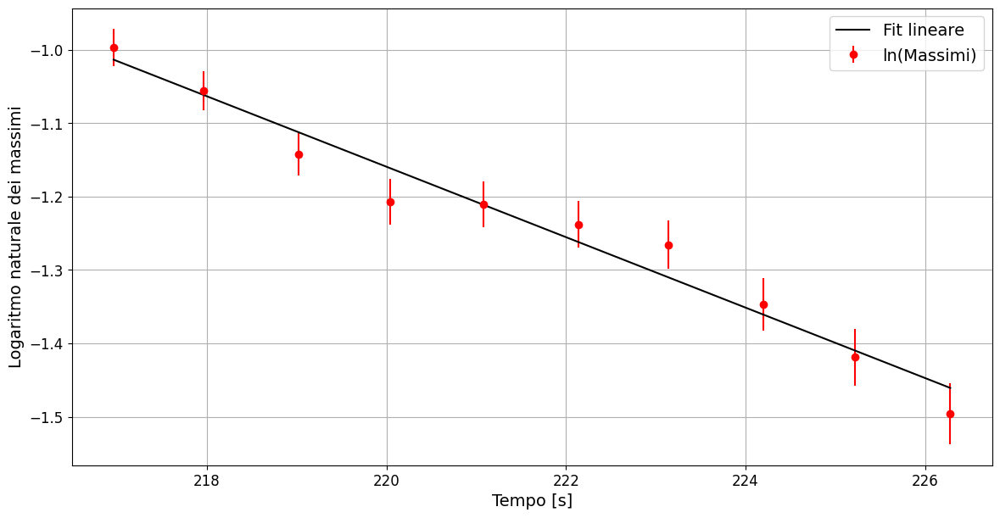

γ dai massimi: 0.0480 ± 0.0034


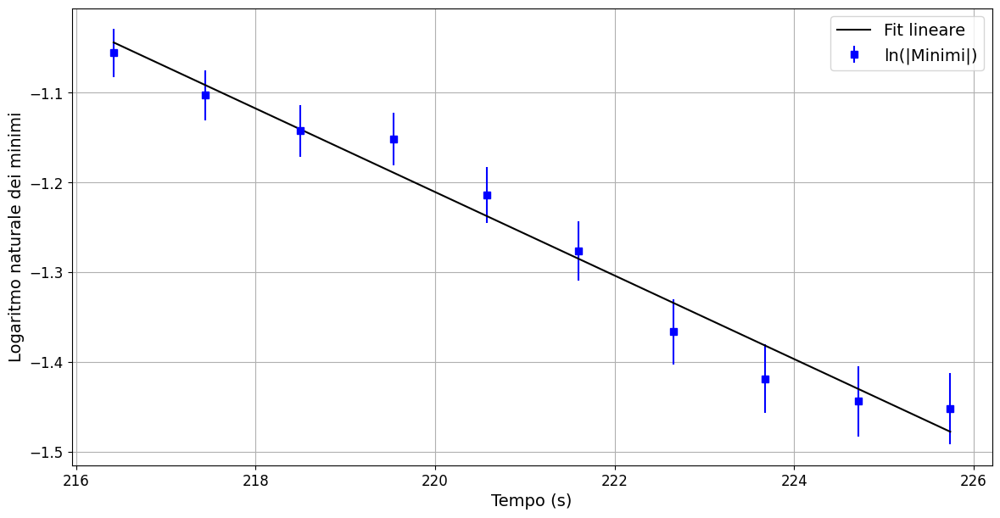

γ dai minimi: 0.0466 ± 0.0035


In [10]:
file_da_analizzare = '0.965.txt'
n = 10

try:
    massimi_tempo = risultati_finali[file_da_analizzare]['decremento']['massimi']['tempo'][:n]
    massimi_soll = risultati_finali[file_da_analizzare]['decremento']['massimi']['sollecitazione'][:n]
    minimi_tempo = risultati_finali[file_da_analizzare]['decremento']['minimi']['tempo'][:n]
    minimi_soll_abs = np.abs(risultati_finali[file_da_analizzare]['decremento']['minimi']['sollecitazione'][:n])

    err_popolazione_massimi = risultati_fit_massimi[file_da_analizzare]['std_corretto']
    err_popolazione_minimi = risultati_fit_minimi[file_da_analizzare]['std_corretto']

except (KeyError, IndexError) as e:
    print(f"Errore: Dati non trovati o insufficienti per '{file_da_analizzare}'. ({e})")
    raise

def linear_model(x, a, b):
    return a * x + b

# Fit massimi
log_massimi_soll = np.log(massimi_soll)
err_log_massimi = err_popolazione_massimi / massimi_soll
popt_max, pcov_max = curve_fit(linear_model, massimi_tempo, log_massimi_soll, sigma=err_log_massimi, absolute_sigma=True)
slope_max, intercept_max = popt_max
err_slope_max, err_intercept_max = np.sqrt(np.diag(pcov_max))
gamma_max = -slope_max
err_gamma_max = err_slope_max

# Plot massimi
plt.figure(figsize=(14, 7))
plt.errorbar(massimi_tempo, log_massimi_soll, yerr=err_log_massimi, fmt='o', color='red', label='ln(Massimi)')
plt.plot(massimi_tempo, linear_model(massimi_tempo, *popt_max), 'k-', label=f'Fit lineare')
plt.xlabel('Tempo [s]')
plt.ylabel('Logaritmo naturale dei massimi')
plt.legend()
plt.grid(True)
plt.savefig("ln_max.pdf", bbox_inches='tight')
plt.show()

print(f"γ dai massimi: {gamma_max:.4f} ± {err_gamma_max:.4f}")

# Fit minimi
log_minimi_soll = np.log(minimi_soll_abs)
err_log_minimi = err_popolazione_minimi / minimi_soll_abs
popt_min, pcov_min = curve_fit(linear_model, minimi_tempo, log_minimi_soll, sigma=err_log_minimi, absolute_sigma=True)
slope_min, intercept_min = popt_min
err_slope_min, err_intercept_min = np.sqrt(np.diag(pcov_min))
gamma_min = -slope_min
err_gamma_min = err_slope_min

# Plot minimi
plt.figure(figsize=(14, 7))
plt.errorbar(minimi_tempo, log_minimi_soll, yerr=err_log_minimi, fmt='s', color='blue', label='ln(|Minimi|)')
plt.plot(minimi_tempo, linear_model(minimi_tempo, *popt_min), 'k-', label=f'Fit lineare')
plt.xlabel('Tempo (s)')
plt.ylabel('Logaritmo naturale dei minimi')
plt.legend()
plt.grid(True)
plt.savefig("ln_min.pdf", bbox_inches='tight')
plt.show()

print(f"γ dai minimi: {gamma_min:.4f} ± {err_gamma_min:.4f}")


In [11]:
# Calcolo del chi quadro ridotto per i massimi
y_pred_max = linear_model(massimi_tempo, *popt_max)
chi2_max = np.sum(((log_massimi_soll - y_pred_max) / err_log_massimi)**2)
dof_max = len(massimi_tempo) - len(popt_max)
reduced_chi2_max = chi2_max / dof_max

print(f"Chi quadro ridotto per i massimi: {reduced_chi2_max:.4f}")

# Calcolo del chi quadro ridotto per i minimi
y_pred_min = linear_model(minimi_tempo, *popt_min)
chi2_min = np.sum(((log_minimi_soll - y_pred_min) / err_log_minimi)**2)
dof_min = len(minimi_tempo) - len(popt_min)
reduced_chi2_min = chi2_min / dof_min

print(f"Chi quadro ridotto per i minimi: {reduced_chi2_min:.4f}")

Chi quadro ridotto per i massimi: 0.8770
Chi quadro ridotto per i minimi: 0.6048


In [12]:
import numpy as np

# ==============================================================================
# VERIFICA DI COMPATIBILITÀ E CALCOLO MEDIA PESATA TRA I DUE VALORI DI GAMMA
# ==============================================================================

try:
    # --- 1. Calcolo della differenza e della sua incertezza ---

    differenza_gamma = np.abs(gamma_max - gamma_min)
    incertezza_diff = np.sqrt(err_gamma_max**2 + err_gamma_min**2)

    if incertezza_diff > 0:
        z_score = differenza_gamma / incertezza_diff
    else:
        z_score = float('inf') if differenza_gamma > 0 else 0.0

    # --- 2. Stampa del report di compatibilità ---

    print("=" * 50)
    print("=== Verifica di Compatibilità tra γ_max e γ_min ===")
    print("=" * 50)
    print(f"  γ calcolato dai massimi: {gamma_max:.4f} ± {err_gamma_max:.4f}")
    print(f"  γ calcolato dai minimi:  {gamma_min:.4f} ± {err_gamma_min:.4f}")
    print("-" * 50)
    print(f"  Differenza: |γ_max - γ_min| = {differenza_gamma:.4f}")
    print(f"  Incertezza sulla differenza  = {incertezza_diff:.4f}")
    print("-" * 50)
    print(f"  Significatività della differenza (z-score): {z_score:.2f} σ")
    print("=" * 50)

    # Interpretazione del risultato
    print("\nInterpretazione del risultato:")
    if z_score < 1:
        print("-> ECCELLENTE COMPATIBILITÀ: I due valori sono statisticamente indistinguibili.")
    elif z_score < 2:
        print("-> BUONA COMPATIBILITÀ: I due valori sono considerati compatibili (entro 2σ).")
    else:
        print("-> ATTENZIONE: I valori potrebbero non essere compatibili (differenza > 2σ).")

    # --- 3. AGGIUNTA: Calcolo della media pesata e del suo errore ---

    print("\n" + "=" * 50)
    print("=== Stima Migliore di γ (Media Pesata) ===")
    print("=" * 50)

    # Calcola i pesi (inversi della varianza)
    # Si aggiunge un valore piccolissimo per evitare divisione per zero se l'errore fosse nullo
    w_max = 1 / (err_gamma_max**2 + 1e-99)
    w_min = 1 / (err_gamma_min**2 + 1e-99)

    # Calcola la media pesata
    gamma_media_pesata = (w_max * gamma_max + w_min * gamma_min) / (w_max + w_min)

    # Calcola l'errore sulla media pesata
    err_media_pesata = np.sqrt(1 / (w_max + w_min))

    print("La stima migliore del coefficiente di smorzamento, ottenuta")
    print("combinando i due risultati, è:")
    print(f"\n  γ_finale = {gamma_media_pesata:.4f} ± {err_media_pesata:.4f}")
    print("=" * 50)

except NameError:
    print("Errore: una o più delle variabili 'gamma_max', 'err_gamma_max', 'gamma_min', 'err_gamma_min' non sono state trovate.")
    print("Assicurati di aver eseguito con successo la cella precedente che calcola i fit.")



=== Verifica di Compatibilità tra γ_max e γ_min ===
  γ calcolato dai massimi: 0.0480 ± 0.0034
  γ calcolato dai minimi:  0.0466 ± 0.0035
--------------------------------------------------
  Differenza: |γ_max - γ_min| = 0.0014
  Incertezza sulla differenza  = 0.0049
--------------------------------------------------
  Significatività della differenza (z-score): 0.29 σ

Interpretazione del risultato:
-> ECCELLENTE COMPATIBILITÀ: I due valori sono statisticamente indistinguibili.

=== Stima Migliore di γ (Media Pesata) ===
La stima migliore del coefficiente di smorzamento, ottenuta
combinando i due risultati, è:

  γ_finale = 0.0473 ± 0.0025


In [13]:
import pandas as pd
import numpy as np

# ==============================================================================
# CALCOLO DELLA PERCENTUALE DI DIPENDENZA TRA MISURE CONSECUTIVE
# ==============================================================================

print("=== Quantificazione della dipendenza tra una misura e la successiva ===")

for nome_file in file_ordinati:
    try:
        # Prendi i dati della 'sollecitazione' dalla fase stazionaria
        sollecitazione_data = dati_staz[nome_file][1]

        if len(sollecitazione_data) < 2:
            continue

        soll_series = pd.Series(sollecitazione_data)

        # 1. Calcola il coefficiente di correlazione (r) tra una misura e la precedente
        r = soll_series.autocorr(lag=1)

        # 2. Esprimi il risultato come percentuale
        percentuale_dipendenza = r * 100

        print(f"\nFile: {nome_file}")
        print(f" -> La dipendenza tra una misura e la successiva è del {percentuale_dipendenza:.1f}%.")

    except Exception as e:
        print(f"\nErrore durante l'analisi del file {nome_file}: {e}")

print("\n\n=== ANALISI COMPLETATA ===")

=== Quantificazione della dipendenza tra una misura e la successiva ===

File: 0.900.txt
 -> La dipendenza tra una misura e la successiva è del 98.7%.

File: 0.905.txt
 -> La dipendenza tra una misura e la successiva è del 98.8%.

File: 0.910.txt
 -> La dipendenza tra una misura e la successiva è del 99.0%.

File: 0.950.txt
 -> La dipendenza tra una misura e la successiva è del 99.2%.

File: 0.955.txt
 -> La dipendenza tra una misura e la successiva è del 99.2%.

File: 0.960.txt
 -> La dipendenza tra una misura e la successiva è del 99.3%.

File: 0.963.txt
 -> La dipendenza tra una misura e la successiva è del 99.2%.

File: 0.9645.txt
 -> La dipendenza tra una misura e la successiva è del 99.2%.

File: 0.965.txt
 -> La dipendenza tra una misura e la successiva è del 99.3%.

File: 0.966.txt
 -> La dipendenza tra una misura e la successiva è del 99.2%.

File: 0.967.txt
 -> La dipendenza tra una misura e la successiva è del 99.3%.

File: 0.9675.txt
 -> La dipendenza tra una misura e la su

=== Creazione del grafico per il file: 0.965.txt ===
Grafico salvato come: grafico_0.965_max_min.pdf


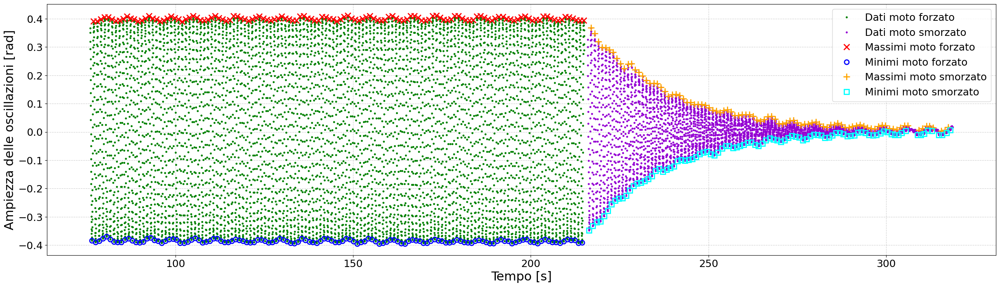

In [14]:
import numpy as np
import matplotlib.pyplot as plt

# ==============================================================================
# PLOT E SALVATAGGIO DEI RISULTATI PER UN SINGOLO FILE: 0.965.txt
# ==============================================================================

# Specifica il file che vuoi visualizzare
file_da_plottare = '0.965.txt'

print(f"=== Creazione del grafico per il file: {file_da_plottare} ===")

# Controlla se i risultati per questo file esistono prima di procedere
if file_da_plottare in risultati_finali:

    # Crea una nuova figura con una dimensione adeguata
    plt.figure(figsize=(30, 8))

    # --- Estrazione dei dati per la fase STAZIONARIA ---
    tempo_staz, soll_staz = dati_staz[file_da_plottare]
    massimi_tempo_staz = risultati_finali[file_da_plottare]['stazionario']['massimi']['tempo']
    massimi_soll_staz = risultati_finali[file_da_plottare]['stazionario']['massimi']['sollecitazione']
    minimi_tempo_staz = risultati_finali[file_da_plottare]['stazionario']['minimi']['tempo']
    minimi_soll_staz = risultati_finali[file_da_plottare]['stazionario']['minimi']['sollecitazione']

    # --- Estrazione dei dati per la fase di DECREMENTO ---
    tempo_decr, soll_decr = dati_decr[file_da_plottare]
    massimi_tempo_decr = risultati_finali[file_da_plottare]['decremento']['massimi']['tempo']
    massimi_soll_decr = risultati_finali[file_da_plottare]['decremento']['massimi']['sollecitazione']
    minimi_tempo_decr = risultati_finali[file_da_plottare]['decremento']['minimi']['tempo']
    minimi_soll_decr = risultati_finali[file_da_plottare]['decremento']['minimi']['sollecitazione']

    # --- Plot di tutti gli elementi ---

    # Dati originali con aggiunta delle label
    plt.plot(tempo_staz, soll_staz, '.', markersize=5, color='green', label='Dati moto forzato')
    plt.plot(tempo_decr, soll_decr, '.', markersize=5, color='darkviolet', label='Dati moto smorzato')

    # Massimi e Minimi Stazionari
    plt.plot(massimi_tempo_staz, massimi_soll_staz, 'x', color='red', markersize=10, mew=2, label='Massimi moto forzato')
    plt.plot(minimi_tempo_staz, minimi_soll_staz, 'o', color='blue', markersize=8, mfc='none', mew=2, label='Minimi moto forzato')

    # Massimi e Minimi in Decremento
    plt.plot(massimi_tempo_decr, massimi_soll_decr, '+', color='orange', markersize=12, mew=2, label='Massimi moto smorzato')
    plt.plot(minimi_tempo_decr, minimi_soll_decr, 's', color='cyan', markersize=8, mfc='none', mew=2, label='Minimi moto smorzato')

    # Impostazioni del grafico
    plt.xlabel('Tempo [s]', fontsize=22)
    plt.ylabel('Ampiezza delle oscillazioni [rad]', fontsize=22)

    # Aumenta la dimensione dei numeri sugli assi
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    plt.legend(fontsize=18)
    plt.grid(True, linestyle='--', alpha=0.6)

    # Salva la figura in un file PDF
    nome_grafico = f'grafico_{file_da_plottare.replace(".txt", "")}_max_min.pdf'
    plt.savefig(nome_grafico, bbox_inches='tight')
    print(f"Grafico salvato come: {nome_grafico}")

    plt.show()

else:
    print(f"Errore: I risultati per il file '{file_da_plottare}' non sono stati trovati.")
    print("Assicurati di aver eseguito la cella di analisi principale precedente.")

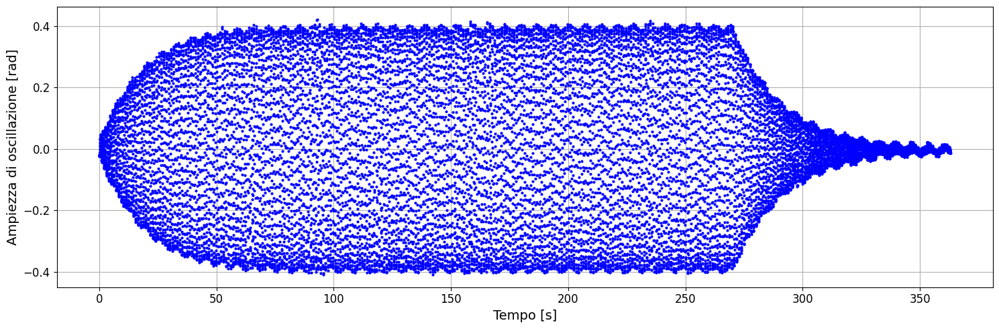

Grafico salvato come: grafico_0.965_globale.pdf


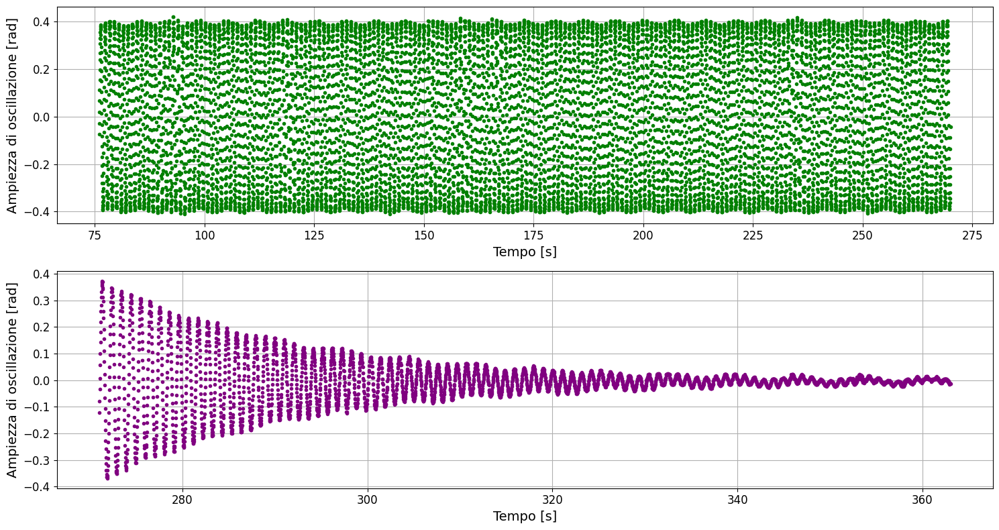

Grafico salvato come: grafico_0.965_staz_e_smorz.pdf


In [15]:
import numpy as np
import matplotlib.pyplot as plt

# Assicurati che queste variabili siano già definite:
# x_vals, y_vals, x2, y2, x3, y3, file_da_plottare

# --- Conversione in array NumPy ---
x_vals = np.array(x_vals)
y_vals = np.array(y_vals)
x2 = np.array(x2)
y2 = np.array(y2)
x3 = np.array(x3)
y3 = np.array(y3)

# --- Plot completo ---
plt.figure(figsize=(15, 5))
plt.plot(x_vals, y_vals, '.', markersize=4, color='blue')
plt.xlabel('Tempo [s]', fontsize=14)
plt.ylabel('Ampiezza di oscillazione [rad]', fontsize=14)
plt.grid(True)
plt.tight_layout()

# Salvataggio del grafico completo
nome_grafico = f'grafico_{file_da_plottare.replace(".txt", "")}_globale.pdf'
plt.savefig(nome_grafico, bbox_inches='tight')
plt.show()
print(f"Grafico salvato come: {nome_grafico}")


# --- Subplot verticali: fase stazionaria e fase di smorzamento ---
fig, axs = plt.subplots(2, 1, figsize=(15, 8))  # 2 righe, 1 colonna

# Subplot 1: Fase stazionaria
if x2.size > 0:
    axs[0].plot(x2, y2, '.', markersize=6, color='green')
    axs[0].set_xlabel('Tempo [s]', fontsize=14)
    axs[0].set_ylabel('Ampiezza di oscillazione [rad]', fontsize=14)
    axs[0].grid(True)
    # Rimosso il titolo come richiesto

# Subplot 2: Fase di smorzamento
if x3.size > 0:
    axs[1].plot(x3, y3, '.', markersize=6, color='purple')
    axs[1].set_xlabel('Tempo [s]', fontsize=14)
    axs[1].set_ylabel('Ampiezza di oscillazione [rad]', fontsize=14)
    axs[1].grid(True)
    # Rimosso il titolo come richiesto

# Layout e salvataggio
plt.tight_layout()
nome_grafico = f'grafico_{file_da_plottare.replace(".txt", "")}_staz_e_smorz.pdf'
plt.savefig(nome_grafico, bbox_inches='tight')
plt.show()
print(f"Grafico salvato come: {nome_grafico}")

=== Creazione del grafico ZOOM per il file: 0.900.txt ===


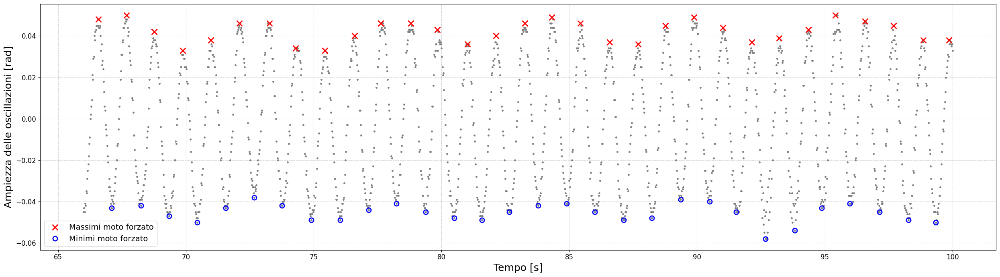

Grafico salvato come: grafico_0.900_zoom_iniziale.pdf


In [16]:
import numpy as np
import matplotlib.pyplot as plt

# ==============================================================================
# PLOT ZOOMATO INIZIALE PER UN SINGOLO FILE: 0.965.txt
# ==============================================================================

file_da_plottare = '0.900.txt'
print(f"=== Creazione del grafico ZOOM per il file: {file_da_plottare} ===")

# Controlla se i risultati esistono
if file_da_plottare in risultati_finali:

    # --- Parametri dello zoom ---
    tempo_max_zoom = 100  # Mostra solo i primi 2 secondi

    # --- Estrazione e filtraggio dei dati ---
    tempo_staz, soll_staz = dati_staz[file_da_plottare]
    tempo_decr, soll_decr = dati_decr[file_da_plottare]

    # Maschere per tenere solo i dati iniziali
    mask_staz = np.array(tempo_staz) <= tempo_max_zoom
    mask_decr = np.array(tempo_decr) <= tempo_max_zoom

    # Massimi e minimi filtrati
    massimi_tempo_staz = np.array(risultati_finali[file_da_plottare]['stazionario']['massimi']['tempo'])
    massimi_soll_staz = np.array(risultati_finali[file_da_plottare]['stazionario']['massimi']['sollecitazione'])
    minimi_tempo_staz = np.array(risultati_finali[file_da_plottare]['stazionario']['minimi']['tempo'])
    minimi_soll_staz = np.array(risultati_finali[file_da_plottare]['stazionario']['minimi']['sollecitazione'])

    massimi_tempo_decr = np.array(risultati_finali[file_da_plottare]['decremento']['massimi']['tempo'])
    massimi_soll_decr = np.array(risultati_finali[file_da_plottare]['decremento']['massimi']['sollecitazione'])
    minimi_tempo_decr = np.array(risultati_finali[file_da_plottare]['decremento']['minimi']['tempo'])
    minimi_soll_decr = np.array(risultati_finali[file_da_plottare]['decremento']['minimi']['sollecitazione'])

    # Filtro anche per massimi e minimi
    mask_massimi_staz = massimi_tempo_staz <= tempo_max_zoom
    mask_minimi_staz = minimi_tempo_staz <= tempo_max_zoom
    mask_massimi_decr = massimi_tempo_decr <= tempo_max_zoom
    mask_minimi_decr = minimi_tempo_decr <= tempo_max_zoom

    # --- Plot zoomato ---
    plt.figure(figsize=(25, 7))
    plt.plot(np.array(tempo_staz)[mask_staz], np.array(soll_staz)[mask_staz], '.', markersize=5, color='gray')


    plt.plot(massimi_tempo_staz[mask_massimi_staz], massimi_soll_staz[mask_massimi_staz], 'x', color='red', markersize=10, mew=2, label='Massimi moto forzato')
    plt.plot(minimi_tempo_staz[mask_minimi_staz], minimi_soll_staz[mask_minimi_staz], 'o', color='blue', markersize=8, mfc='none', mew=2, label='Minimi moto forzato')


    plt.xlabel('Tempo [s]', fontsize=18)
    plt.ylabel('Ampiezza delle oscillazioni [rad]', fontsize=18)
    plt.legend(fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()

    # Salvataggio del grafico zoomato
    nome_grafico = f'grafico_{file_da_plottare.replace(".txt", "")}_zoom_iniziale.pdf'
    plt.savefig(nome_grafico, bbox_inches='tight')
    plt.show()
    print(f"Grafico salvato come: {nome_grafico}")

else:
    print(f"Errore: I risultati per il file '{file_da_plottare}' non sono stati trovati.")


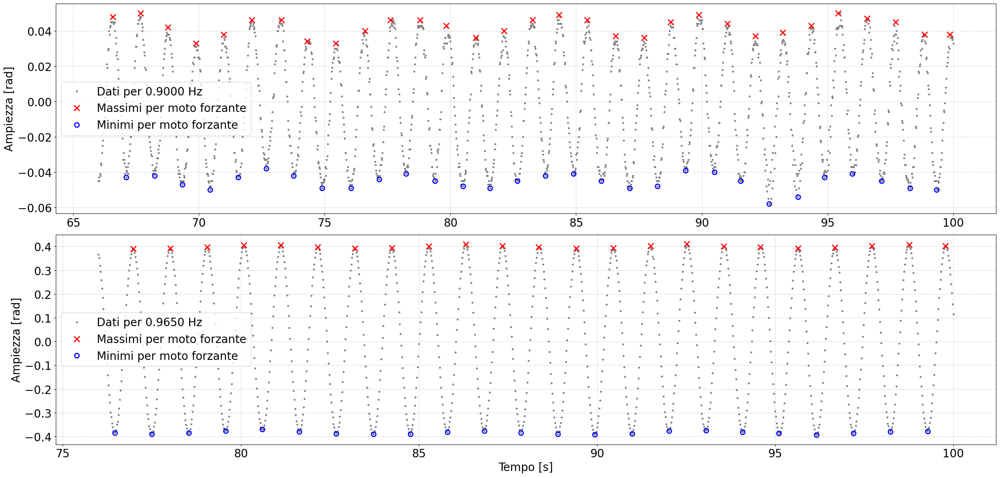

Grafico salvato come: confronto_zoom.pdf


In [29]:
import numpy as np
import matplotlib.pyplot as plt

# Parametro zoom per il moto forzante
tempo_max = 100  # Mostra solo i primi 100 secondi

# File da confrontare
file_1 = '0.900.txt'
file_2 = '0.965.txt'

# Inizializza figura e assi (2 subplot verticali)
fig, axs = plt.subplots(2, 1, figsize=(25, 12), sharex=False)

def plot_moto_forzante(ax, file, colore_punti='gray'):
    tempo, soll = dati_staz[file]
    tempo = np.array(tempo)
    soll = np.array(soll)
    mask = tempo <= tempo_max

    max_t = np.array(risultati_finali[file]['stazionario']['massimi']['tempo'])
    max_s = np.array(risultati_finali[file]['stazionario']['massimi']['sollecitazione'])
    min_t = np.array(risultati_finali[file]['stazionario']['minimi']['tempo'])
    min_s = np.array(risultati_finali[file]['stazionario']['minimi']['sollecitazione'])

    mask_max = max_t <= tempo_max
    mask_min = min_t <= tempo_max

    ax.plot(tempo[mask], soll[mask], '.', color=colore_punti, markersize=5, label=f'Dati per {file.replace(".txt","")}0 Hz')
    ax.plot(max_t[mask_max], max_s[mask_max], 'x', color='red', markersize=10, mew=2, label='Massimi per moto forzante')
    ax.plot(min_t[mask_min], min_s[mask_min], 'o', color='blue', markersize=8, mfc='none', mew=2, label='Minimi per moto forzante')

    # Impostazioni assi e legenda
    ax.set_ylabel('Ampiezza [rad]', fontsize=20)
    ax.legend(fontsize=20)
    ax.grid(True, linestyle='--', alpha=0.6)

    # Aumenta dimensione dei numeri su entrambi gli assi
    ax.tick_params(axis='both', which='major', labelsize=20)  # <-- Modifica qui la dimensione (es. 18)

# Plot primo file
plot_moto_forzante(axs[0], file_1)

# Plot secondo file
plot_moto_forzante(axs[1], file_2)

axs[1].set_xlabel('Tempo [s]', fontsize=20)

plt.tight_layout()
nome_grafico = f'confronto_zoom.pdf'
plt.savefig(nome_grafico, bbox_inches='tight')
plt.show()
print(f"Grafico salvato come: {nome_grafico}")

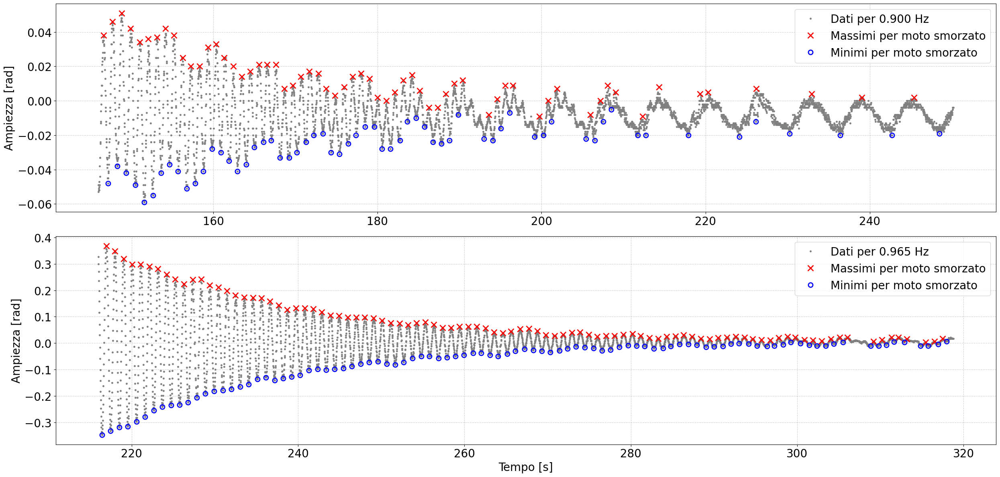

Grafico salvato come: confronto_smorzato.pdf


In [28]:
import numpy as np
import matplotlib.pyplot as plt

# File da confrontare
file_1 = '0.900.txt'
file_2 = '0.965.txt'

# Inizializza figura e assi (2 subplot verticali)
fig, axs = plt.subplots(2, 1, figsize=(25, 12), sharex=False)

def plot_moto_smorzato(ax, file, colore_punti='gray'):
    # Usa i dati della fase di decremento (moto smorzato)
    tempo, soll = dati_decr[file]
    tempo = np.array(tempo)
    soll = np.array(soll)

    max_t = np.array(risultati_finali[file]['decremento']['massimi']['tempo'])
    max_s = np.array(risultati_finali[file]['decremento']['massimi']['sollecitazione'])
    min_t = np.array(risultati_finali[file]['decremento']['minimi']['tempo'])
    min_s = np.array(risultati_finali[file]['decremento']['minimi']['sollecitazione'])

    ax.plot(tempo, soll, '.', color=colore_punti, markersize=5, label=f'Dati per {file.replace(".txt", "")} Hz')
    ax.plot(max_t, max_s, 'x', color='red', markersize=10, mew=2, label='Massimi per moto smorzato')
    ax.plot(min_t, min_s, 'o', color='blue', markersize=8, mfc='none', mew=2, label='Minimi per moto smorzato')

    # Impostazioni assi e legenda
    ax.set_ylabel('Ampiezza [rad]', fontsize=20)
    ax.legend(fontsize=20)
    ax.grid(True, linestyle='--', alpha=0.6)

    # Aumenta dimensione dei numeri su entrambi gli assi
    ax.tick_params(axis='both', which='major', labelsize=20)  # <-- Dimensione aumentata (18)

# Plot primo file
plot_moto_smorzato(axs[0], file_1)

# Plot secondo file
plot_moto_smorzato(axs[1], file_2)

axs[1].set_xlabel('Tempo [s]', fontsize=20)

plt.tight_layout()
nome_grafico = 'confronto_smorzato.pdf'
plt.savefig(nome_grafico, bbox_inches='tight')
plt.show()
print(f"Grafico salvato come: {nome_grafico}")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import chi2

# === DEFINIZIONE FUNZIONI ===
def linear_model(x, a, b):
    return a * x + b

def chi_squared_test(y_obs, y_exp, sigma, dof):
    chi2_val = np.sum(((y_obs - y_exp) / sigma) ** 2)
    chi2_red = chi2_val / dof
    p_val = 1 - chi2.cdf(chi2_val, dof)
    return chi2_val, chi2_red, p_val

# === DATI ===
file_da_analizzare = '0.965.txt'

try:
    massimi_tempo = risultati_finali[file_da_analizzare]['decremento']['massimi']['tempo'][:10]
    massimi_soll = risultati_finali[file_da_analizzare]['decremento']['massimi']['sollecitazione'][:10]
    minimi_tempo = risultati_finali[file_da_analizzare]['decremento']['minimi']['tempo'][:10]
    minimi_soll_abs = np.abs(risultati_finali[file_da_analizzare]['decremento']['minimi']['sollecitazione'][:10])

    err_popolazione_massimi = risultati_fit_massimi[file_da_analizzare]['std_corretto']
    err_popolazione_minimi = risultati_fit_minimi[file_da_analizzare]['std_corretto']

except (KeyError, IndexError) as e:
    print(f"Errore: Dati non trovati o insufficienti per '{file_da_analizzare}'. ({e})")
    raise

# === FIT MASSIMI ===
log_massimi_soll = np.log(massimi_soll)
err_log_massimi = err_popolazione_massimi / massimi_soll
popt_max, pcov_max = curve_fit(linear_model, massimi_tempo, log_massimi_soll, sigma=err_log_massimi, absolute_sigma=True)
slope_max, intercept_max = popt_max
err_slope_max, err_intercept_max = np.sqrt(np.diag(pcov_max))
gamma_max = -slope_max
err_gamma_max = err_slope_max
chi2_max, chi2_red_max, pval_max = chi_squared_test(log_massimi_soll, linear_model(massimi_tempo, *popt_max), err_log_massimi, len(massimi_tempo) - 2)

# === FIT MINIMI ===
log_minimi_soll = np.log(minimi_soll_abs)
err_log_minimi = err_popolazione_minimi / minimi_soll_abs
popt_min, pcov_min = curve_fit(linear_model, minimi_tempo, log_minimi_soll, sigma=err_log_minimi, absolute_sigma=True)
slope_min, intercept_min = popt_min
err_slope_min, err_intercept_min = np.sqrt(np.diag(pcov_min))
gamma_min = -slope_min
err_gamma_min = err_slope_min
chi2_min, chi2_red_min, pval_min = chi_squared_test(log_minimi_soll, linear_model(minimi_tempo, *popt_min), err_log_minimi, len(minimi_tempo) - 2)

# === PLOT ===
fig, axs = plt.subplots(2, 1, figsize=(8, 6))
axs[0].errorbar(massimi_tempo, log_massimi_soll, yerr=err_log_massimi, fmt='o', color='red', label='ln(Massimi)')
axs[0].plot(massimi_tempo, linear_model(massimi_tempo, *popt_max), 'k-', label='Fit lineare')
axs[0].set_ylabel('ln(Ampiezza Massimi)')
axs[0].legend()
axs[0].grid(True)

axs[1].errorbar(minimi_tempo, log_minimi_soll, yerr=err_log_minimi, fmt='s', color='blue', label='ln(|Minimi|)')
axs[1].plot(minimi_tempo, linear_model(minimi_tempo, *popt_min), 'k-', label='Fit lineare')
axs[1].set_xlabel('Tempo (s)')
axs[1].set_ylabel('ln(|Ampiezza Minimi|)')
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
nome_output = f"fit_decremento_{file_da_analizzare.replace('.txt','')}.pdf"
plt.savefig(nome_output, bbox_inches='tight')
plt.show()

# === RISULTATI ===
print(f"--- Risultati Fit ({file_da_analizzare}) ---")
print(f"Fit Massimi:")
print(f"  pendenza = {slope_max:.4f} ± {err_slope_max:.4f}")
print(f"  intercetta = {intercept_max:.4f} ± {err_intercept_max:.4f}")
print(f"  γ = {gamma_max:.4f} ± {err_gamma_max:.4f}")
print(f"  χ² = {chi2_max:.2f}, χ²/ndof = {chi2_red_max:.2f}, p-value = {pval_max:.4f}")

print(f"\nFit Minimi:")
print(f"  pendenza = {slope_min:.4f} ± {err_slope_min:.4f}")
print(f"  intercetta = {intercept_min:.4f} ± {err_intercept_min:.4f}")
print(f"  γ = {gamma_min:.4f} ± {err_gamma_min:.4f}")
print(f"  χ² = {chi2_min:.2f}, χ²/ndof = {chi2_red_min:.2f}, p-value = {pval_min:.4f}")

print(f"\nGrafico salvato come: {nome_output}")


=== INIZIO FIT DI BREIT-WIGNER (con offset sottratto) ===

--- Risultati Fit Breit-Wigner ---
  A (Ampiezza) = 2.390e-03 ± 1.63e-04 rad³/s²
  B (ω₀)       = 6.0651 ± 0.0013 rad/s
  C (γ)        = 0.0822 ± 0.0027 rad/s
  D (Offset)   = 0.0395 ± 0.0039 rad
-----------------------------------
  Frequenza di Risonanza f₀ = ω₀ / (2π) = 0.9653 Hz
  Fattore di Qualità Q = ω₀ / γ = 73.81
-----------------------------------


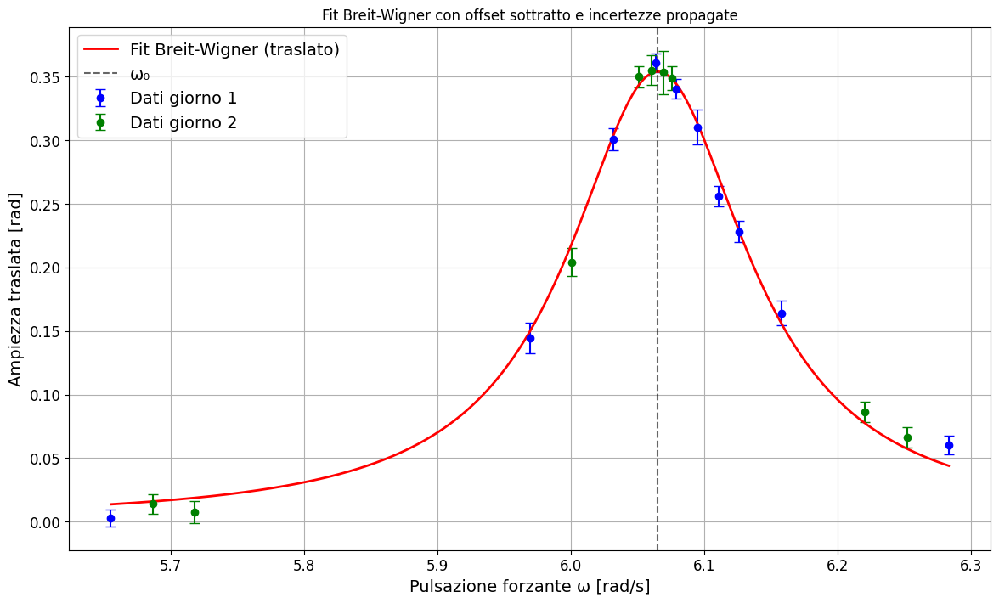


--- Analisi Chi-Quadro (dati traslati) ---
  Chi-quadro ridotto (χ²/ndof) = 1.306
  p-value = 0.1882
-----------------------------------


In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import chi2

def breit_wigner(omega, A, B, C, D):
    return A / ((omega - B)**2 + C**2) + D

# === PREPARAZIONE DATI ===
frequenze_hz = []
valori_medi_massimi = []
incertezze_uniformi = []
colori_punti = []

freq_speciali = [
    '0.905.txt', '0.910.txt', '0.955.txt', '0.963.txt',
    '0.966.txt', '0.967.txt', '0.990.txt', '0.995.txt', '0.9645.txt'
]

for nome_file in file_ordinati:
    if nome_file not in risultati_fit_massimi:
        continue
    frequenze_hz.append(frequenza_f[nome_file])
    media = (risultati_fit_massimi[nome_file]['mu_sx'] + risultati_fit_massimi[nome_file]['mu_dx']) / 2
    valori_medi_massimi.append(media)
    incertezze_uniformi.append(risultati_fit_massimi[nome_file]['std_uniforme'])
    colori_punti.append('green' if nome_file in freq_speciali else 'blue')

frequenze_hz = np.array(frequenze_hz)
valori_medi_massimi = np.array(valori_medi_massimi)
incertezze_uniformi = np.array(incertezze_uniformi)
colori_punti = np.array(colori_punti)
omega_forzante = 2 * np.pi * frequenze_hz

# === FIT DI BREIT-WIGNER ===
print("=== INIZIO FIT DI BREIT-WIGNER (con offset sottratto) ===")
A0 = (np.max(valori_medi_massimi) - np.min(valori_medi_massimi))
B0 = omega_forzante[np.argmax(valori_medi_massimi)]
C0 = 4 * ((0.05)**2)
D0 = np.min(valori_medi_massimi)
p0 = [A0, B0, C0, D0]

try:
    popt, pcov = curve_fit(breit_wigner, omega_forzante, valori_medi_massimi,
                           p0=p0, sigma=incertezze_uniformi, absolute_sigma=True, maxfev=20000)
    A, B, C, D = popt
    err_popt = np.sqrt(np.diag(pcov))
    err_D = err_popt[3]

    print("\n--- Risultati Fit Breit-Wigner ---")
    print(f"  A (Ampiezza) = {A:.3e} ± {err_popt[0]:.2e} rad³/s²")
    print(f"  B (ω₀)       = {B:.4f} ± {err_popt[1]:.4f} rad/s")
    print(f"  C (γ)        = {C:.4f} ± {err_popt[2]:.4f} rad/s")
    print(f"  D (Offset)   = {D:.4f} ± {err_D:.4f} rad")
    print("-" * 35)
    print(f"  Frequenza di Risonanza f₀ = ω₀ / (2π) = {B/(2*np.pi):.4f} Hz")
    print(f"  Fattore di Qualità Q = ω₀ / γ = {abs(B/C):.2f}")
    print("-" * 35)

    # === SOTTRAZIONE OFFSET E PROPAGAZIONE INCERTEZZE ===
    valori_traslati = valori_medi_massimi - D
    incertezze_propagate = np.sqrt(incertezze_uniformi**2 + err_D**2)

    # === GRAFICO ===
    plt.figure(figsize=(14, 8))
    mask_blue = colori_punti == 'blue'
    plt.errorbar(omega_forzante[mask_blue], valori_traslati[mask_blue], yerr=incertezze_propagate[mask_blue], fmt='bo', capsize=4, label='Dati giorno 1')
    mask_green = colori_punti == 'green'
    plt.errorbar(omega_forzante[mask_green], valori_traslati[mask_green], yerr=incertezze_propagate[mask_green], fmt='go', capsize=4, label='Dati giorno 2')
    omega_fit = np.linspace(omega_forzante.min(), omega_forzante.max(), 500)
    fit_vals = breit_wigner(omega_fit, *popt) - D
    plt.plot(omega_fit, fit_vals, 'r-', lw=2, label='Fit Breit-Wigner (traslato)')
    plt.axvline(B, color='k', ls='--', alpha=0.6, label='ω₀')
    plt.xlabel('Pulsazione forzante ω [rad/s]')
    plt.ylabel('Ampiezza traslata [rad]')
    plt.title('Fit Breit-Wigner con offset sottratto e incertezze propagate')
    plt.legend()
    plt.grid(True)
    plt.savefig("breit_wigner_traslato_UNIF.pdf", bbox_inches='tight')
    plt.show()

    # === CHI-QUADRO ===
    y_attesi_traslati = breit_wigner(omega_forzante, *popt) - D
    dof = len(omega_forzante) - len(popt)
    chi2_val = np.sum(((valori_traslati - y_attesi_traslati) / incertezze_propagate)**2)
    chi2_ridotto = chi2_val / dof
    p_value = 1 - chi2.cdf(chi2_val, dof)
    print("\n--- Analisi Chi-Quadro (dati traslati) ---")
    print(f"  Chi-quadro ridotto (χ²/ndof) = {chi2_ridotto:.3f}")
    print(f"  p-value = {p_value:.4f}")
    print("-" * 35)

except Exception as e:
    print(f"ERRORE durante il fit di Breit-Wigner: {e}")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.signal import find_peaks

file_list = ["0.990.txt", "0.965.txt"]

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

for idx, nome_file in enumerate(file_list):
    massimi_y = risultati_finali[nome_file]['stazionario']['massimi']['sollecitazione']

    # Istogramma per identificare i picchi
    hist_vals, bin_edges = np.histogram(massimi_y, bins='auto')
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    peaks, _ = find_peaks(hist_vals, distance=2)

    ax = axes[idx]

    if len(peaks) >= 2:
        # Seleziona i due picchi principali
        peak_indices = peaks[np.argsort(hist_vals[peaks])[-2:]]
        peak_positions = bin_centers[peak_indices]
        peak_positions.sort()
        midpoint = np.mean(peak_positions)

        # Divide i dati
        left_group = massimi_y[massimi_y <= midpoint]
        right_group = massimi_y[massimi_y > midpoint]

        # Fit gaussiano
        mu_sx, std_sx = np.mean(left_group), np.std(left_group, ddof=1)
        mu_dx, std_dx = np.mean(right_group), np.std(right_group, ddof=1)

        # Plot istogramma
        ax.hist(massimi_y, bins='auto', density=True, alpha=0.6, color='dodgerblue', edgecolor='navy')

        x = np.linspace(min(massimi_y), max(massimi_y), 300)
        ax.plot([], [], ' ', label=f"f = {frequenza_f[nome_file]:.4f} Hz")
        ax.plot(x, norm.pdf(x, mu_sx, std_sx), 'b-', lw=2, label='Fit gaussiano sx')
        ax.plot(x, norm.pdf(x, mu_dx, std_dx), 'r-', lw=2, label='Fit gaussiano dx')

        # Titolo e legenda centrata
        ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), frameon=True, ncol=1)

        ax.set_xlabel("Classi di frequenza dei massimi")
        ax.grid(True)
    else:
        ax.text(0.5, 0.5, "Nessun doppio fit", transform=ax.transAxes, ha='center', va='center')
        ax.grid(True)

axes[0].set_ylabel("Densità di Probabilità")
plt.tight_layout()
plt.savefig("doppio_istogramma_fit.pdf")
plt.show()
plt.close()
print("PDF salvato come doppio_istogramma_fit.pdf")


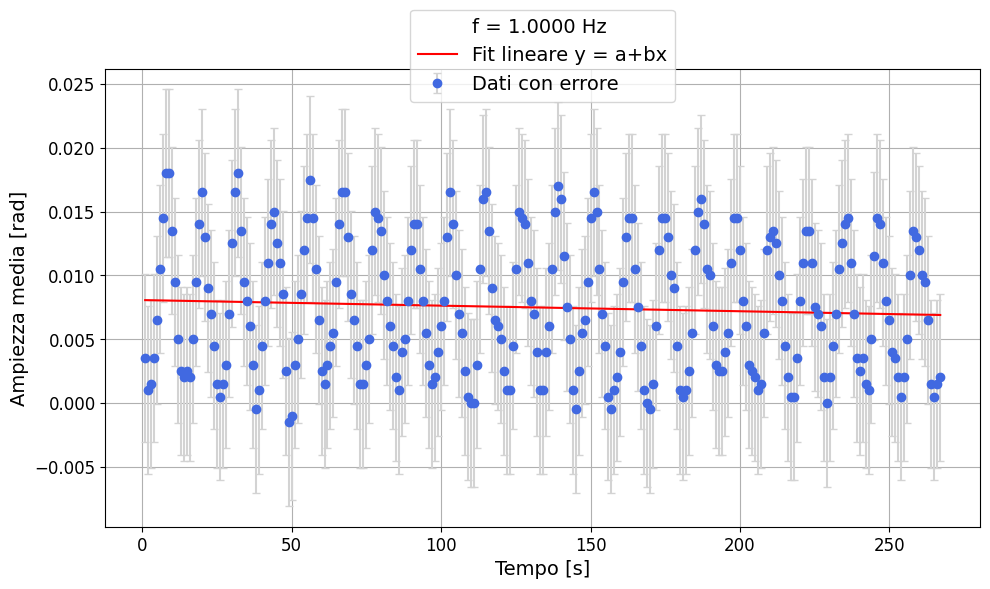

Plot singolo salvato come pdf_plots/0_fit_singolo.pdf


In [24]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import chi2
import os
import re

def linear_model(x, a, b):
    return a * x + b

nome_file = "0.965.txt"

if nome_file not in risultati_finali or \
   nome_file not in risultati_fit_massimi or \
   nome_file not in risultati_fit_minimi:
    raise ValueError(f"Dati mancanti per il file {nome_file}")

massimi_tempo = risultati_finali[nome_file]['stazionario']['massimi']['tempo']
massimi_soll = risultati_finali[nome_file]['stazionario']['massimi']['sollecitazione']
minimi_tempo = risultati_finali[nome_file]['stazionario']['minimi']['tempo']
minimi_soll = risultati_finali[nome_file]['stazionario']['minimi']['sollecitazione']

if len(massimi_tempo) < 2 or len(minimi_tempo) < 2:
    raise ValueError("Dati di massimi/minimi insufficienti per il fit.")

tempi_estremi = np.concatenate((massimi_tempo, minimi_tempo))
soll_estremi = np.concatenate((massimi_soll, minimi_soll))
sorted_indices = np.argsort(tempi_estremi)
soll_ordinate = soll_estremi[sorted_indices]

punti_medi_y = (soll_ordinate[:-1] + soll_ordinate[1:]) / 2
punti_medi_x = np.arange(1, len(punti_medi_y) + 1)

sigma_max_corretto = risultati_fit_massimi[nome_file]['std_corretto']
sigma_min_corretto = risultati_fit_minimi[nome_file]['std_corretto']
incertezza_y = 0.5 * np.sqrt(sigma_max_corretto**2 + sigma_min_corretto**2)
errori_y = np.full_like(punti_medi_y, fill_value=incertezza_y)

popt, pcov = curve_fit(linear_model, punti_medi_x, punti_medi_y, sigma=errori_y, absolute_sigma=True)
a, b = popt
y_pred = linear_model(punti_medi_x, a, b)

residui = punti_medi_y - y_pred
chi2_val = np.sum((residui / errori_y)**2)
dof = len(punti_medi_y) - 2
chi2_ridotto = chi2_val / dof
p_value = 1 - chi2.cdf(chi2_val, dof)

err_a, err_b = np.sqrt(np.diag(pcov))

# Compatibilità coeff. angolare con zero in sigma
compatibilita_sigma = abs(a) / err_a if err_a > 0 else float('inf')

risultati_fit[nome_file] = {
    'pendenza': a,
    'intercetta': b,
    'err_pendenza': err_a,
    'err_intercetta': err_b,
    'chi2_ridotto': chi2_ridotto,
    'p_value': p_value
}

fig, ax = plt.subplots(figsize=(10, 6))






freq = float(freq_match.group(1)) if freq_match else None
if freq is not None:
    ax.plot([], [], ' ', label=f'f = {freq:.4f} Hz')

ax.errorbar(punti_medi_x, punti_medi_y, yerr=errori_y, fmt='o', color='royalblue',
            ecolor='lightgray', capsize=3, label='Dati con errore')


ax.plot([], [], ' ')
freq_match = re.search(r'(\d+\.\d{3,4})', nome_file)
ax.plot(punti_medi_x, y_pred, 'r-', label='Fit lineare y = a+bx')






ax.set_xlabel("Tempo [s]")
ax.set_ylabel( "Ampiezza media [rad]" )
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), frameon=True, ncol=1)
ax.grid(True)

plt.tight_layout()
plt.savefig(f"retta_orizzontale.pdf", bbox_inches='tight')
plt.show()
plt.close()

print(f"Plot singolo salvato come pdf_plots/{nome_file.split('.')[0]}_fit_singolo.pdf")


In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import chi2
import pandas as pd # Importa la libreria pandas

# ==============================================================================
# REPORT COMPLETO SULLA STABILITÀ DEL SEGNALE CON SALVATAGGIO CSV
# ==============================================================================

def linear_model(x, a, b):
    """Modello lineare per il fit: y = ax + b"""
    return a * x + b

# Dizionario per salvare i risultati numerici completi
risultati_fit_stabilita = {}

print("="*60)
print("=== Report sulla Stabilità del Segnale (Fit Lineare) ===")
print("="*60)

# Itera su tutti i file ordinati
for nome_file in file_ordinati:
    print(f"\n--- Analisi per il file: {nome_file} ---")

    try:
        # --- 1. Preparazione dei dati ---
        if nome_file not in risultati_finali or \
           nome_file not in risultati_fit_massimi or \
           nome_file not in risultati_fit_minimi:
            print("  -> Dati di analisi preliminare mancanti. Salto il file.")
            continue

        massimi_tempo = risultati_finali[nome_file]['stazionario']['massimi']['tempo']
        massimi_soll = risultati_finali[nome_file]['stazionario']['massimi']['sollecitazione']
        minimi_tempo = risultati_finali[nome_file]['stazionario']['minimi']['tempo']
        minimi_soll = risultati_finali[nome_file]['stazionario']['minimi']['sollecitazione']

        if len(massimi_tempo) < 2 or len(minimi_tempo) < 2:
            print("  -> Dati di massimi/minimi insufficienti per il fit. Salto il file.")
            continue

        tempi_estremi = np.concatenate((massimi_tempo, minimi_tempo))
        soll_estremi = np.concatenate((massimi_soll, minimi_soll))
        sorted_indices = np.argsort(tempi_estremi)
        soll_ordinate = soll_estremi[sorted_indices]

        punti_medi_y = (soll_ordinate[:-1] + soll_ordinate[1:]) / 2
        punti_medi_x = np.arange(1, len(punti_medi_y) + 1)

        # --- MODIFICA: Uso di 'std_corretto' come richiesto ---
        sigma_max_popolazione = risultati_fit_massimi[nome_file]['std_corretto']
        sigma_min_popolazione = risultati_fit_minimi[nome_file]['std_corretto']
        # ----------------------------------------------------

        incertezza_y = 0.5 * np.sqrt(sigma_max_popolazione**2 + sigma_min_popolazione**2)
        errori_y = np.full_like(punti_medi_y, fill_value=incertezza_y)

        # --- 2. Fit Lineare e Calcolo Compatibilità ---
        if len(punti_medi_x) < 3:
             print("  -> Non ci sono abbastanza punti (coppie di estremi) per un fit significativo.")
             continue

        popt, pcov = curve_fit(linear_model, punti_medi_x, punti_medi_y, sigma=errori_y, absolute_sigma=True)
        a, b = popt
        err_a, err_b = np.sqrt(np.diag(pcov))
        compatibilita_a_zero = abs(a) / err_a if err_a > 0 else float('inf')

        # --- MODIFICA: Salva tutti i risultati del fit ---
        risultati_fit_stabilita[nome_file] = {
            'pendenza_a': a,
            'err_pendenza_a': err_a,
            'intercetta_b': b,
            'err_intercetta_b': err_b,
            'compatibilita_sigma': compatibilita_a_zero
        }
        # -----------------------------------------------

        # Stampa del Risultato a schermo
        print(f"  Pendenza (a) = {a:.2e} ± {err_a:.1e}")
        print(f"  Intercetta (b) = {b:.3f} ± {err_b:.3f}")
        print(f"  => Compatibilità della pendenza con zero: {compatibilita_a_zero:.2f} σ")

    except Exception as e:
        print(f"  -> Si è verificato un errore imprevisto: {e}")

print("\n" + "="*60)
print("Analisi completata.")
print("="*60)


# --- AGGIUNTA E MODIFICA: Salvataggio dei risultati completi in un file CSV ---
try:
    if risultati_fit_stabilita:
        # Converte il dizionario dei risultati in un DataFrame
        df_risultati = pd.DataFrame.from_dict(risultati_fit_stabilita, orient='index')

        # Rinomina le colonne per chiarezza nel file CSV
        df_risultati.columns = ['Pendenza', 'Errore_Pendenza', 'Intercetta', 'Errore_Intercetta', 'Compatibilita_Pendenza_Sigma']
        df_risultati.index.name = 'File' # La colonna con i nomi dei file

        nome_file_csv = 'report_fit_stabilita.csv'
        # Salva il DataFrame in un file CSV, includendo l'indice (i nomi dei file)
        df_risultati.to_csv(nome_file_csv, float_format='%.4e')

        print(f"\nRisultati completi salvati con successo nel file: {nome_file_csv}")
    else:
        print("\nNessun risultato da salvare nel file CSV.")
except Exception as e:
    print(f"\nErrore durante il salvataggio del file CSV: {e}")
# --- FINE MODIFICA ---


=== Report sulla Stabilità del Segnale (Fit Lineare) ===

--- Analisi per il file: 0.900.txt ---
  Pendenza (a) = -1.60e-06 ± 1.2e-05
  Intercetta (b) = -0.001 ± 0.001
  => Compatibilità della pendenza con zero: 0.13 σ

--- Analisi per il file: 0.905.txt ---
  Pendenza (a) = 5.13e-07 ± 3.1e-06
  Intercetta (b) = 0.004 ± 0.001
  => Compatibilità della pendenza con zero: 0.16 σ

--- Analisi per il file: 0.910.txt ---
  Pendenza (a) = -3.59e-06 ± 3.2e-06
  Intercetta (b) = -0.004 ± 0.001
  => Compatibilità della pendenza con zero: 1.11 σ

--- Analisi per il file: 0.950.txt ---
  Pendenza (a) = -4.38e-06 ± 1.0e-05
  Intercetta (b) = 0.010 ± 0.001
  => Compatibilità della pendenza con zero: 0.42 σ

--- Analisi per il file: 0.955.txt ---
  Pendenza (a) = 6.51e-07 ± 3.2e-06
  Intercetta (b) = -0.001 ± 0.001
  => Compatibilità della pendenza con zero: 0.20 σ

--- Analisi per il file: 0.960.txt ---
  Pendenza (a) = -6.78e-06 ± 1.1e-05
  Intercetta (b) = 0.008 ± 0.001
  => Compatibilità della pe